### EverDelinquency Rate Prediction

In [1]:
## Importing the necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
## Importing the dataset
df=pd.read_csv('C:\\Python\\LoanExport.csv')
df.head()

C:\Users\prath\AppData\Local\Temp\ipykernel_8320\323304544.py:2: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('C:\\Python\\LoanExport.csv')


,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PostalCode,LoanSeqNum,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,0,199902,N,202901,16974,25,1,O,89,27,...,60400,F199Q1268030,P,360,2,FL,WASHINGTONMUTUALBANK,0,0,52
1,0,199902,N,202901,19740,0,1,O,73,17,...,80200,F199Q1015092,N,360,1,FT,CHASEHOMEFINANCELLC,0,0,144
2,0,199902,N,202901,29940,0,1,O,75,16,...,66000,F199Q1266886,N,360,2,FL,WASHINGTONMUTUALBANK,0,0,67
3,0,199902,N,202901,31084,0,1,O,76,14,...,90700,F199Q1178167,N,360,2,GM,GMACMTGECORP,0,0,35
4,0,199902,N,202901,35644,0,1,O,78,18,...,7600,F199Q1178517,N,360,2,GM,GMACMTGECORP,0,0,54


In [3]:
## Basic information displayed
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 291451 entries, 0 to 291450
Data columns (total 28 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   CreditScore         291451 non-null  int64  
 1   FirstPaymentDate    291451 non-null  int64  
 2   FirstTimeHomebuyer  291451 non-null  object 
 3   MaturityDate        291451 non-null  int64  
 4   MSA                 291451 non-null  object 
 5   MIP                 291451 non-null  int64  
 6   Units               291451 non-null  int64  
 7   Occupancy           291451 non-null  object 
 8   OCLTV               291451 non-null  int64  
 9   DTI                 291451 non-null  int64  
 10  OrigUPB             291451 non-null  int64  
 11  LTV                 291451 non-null  int64  
 12  OrigInterestRate    291451 non-null  float64
 13  Channel             291451 non-null  object 
 14  PPM                 291451 non-null  object 
 15  ProductType         291451 non-nul

### Observations:
There are 291451 records and 28 columns in the dataset
13 columns are numerical, 14 columns are categorical and 1 column is of float

In [4]:
### Summary statistics of the dataset
df.describe()

,CreditScore,FirstPaymentDate,MaturityDate,MIP,Units,OCLTV,DTI,OrigUPB,LTV,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment
count,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000
mean,708.936991,199904.760553,202902.367043,9.216685,1.026022,76.960529,30.033453,124940.387921,76.937986,6.926547,359.835375,0.197848,1.837729,60.805291
std,68.408791,13.821228,16.090508,12.648273,0.202986,15.236154,13.203974,53657.440624,15.225298,0.343541,2.286939,0.398378,8.809392,46.142599
min,0.000000,199901.000000,202402.000000,0.000000,0.000000,0.000000,0.000000,8000.000000,0.000000,4.000000,301.000000,0.000000,0.000000,1.000000
25%,675.000000,199903.000000,202902.000000,0.000000,1.000000,70.000000,22.000000,83000.000000,70.000000,6.750000,360.000000,0.000000,0.000000,34.000000
50%,717.000000,199904.000000,202903.000000,0.000000,1.000000,80.000000,31.000000,117000.000000,80.000000,6.875000,360.000000,0.000000,0.000000,48.000000
75%,753.000000,199905.000000,202904.000000,25.000000,1.000000,90.000000,39.000000,160000.000000,90.000000,7.125000,360.000000,0.000000,0.000000,63.000000
max,849.000000,201303.000000,204302.000000,55.000000,4.000000,110.000000,65.000000,497000.000000,103.000000,12.350000,361.000000,1.000000,180.000000,212.000000


### Observations:
1. Average credit score is 710 points
2. Average MIP is 9
3. Average OCLTV is 77
4. Average DTI is 30
5. Average OrigUPB is 124940
6. Average LTV is 77
7. Average Interest rate is 7%

In [5]:
## Checking the null values
df.isnull().sum()

CreditScore               0
FirstPaymentDate          0
FirstTimeHomebuyer        0
MaturityDate              0
MSA                       0
MIP                       0
Units                     0
Occupancy                 0
OCLTV                     0
DTI                       0
OrigUPB                   0
LTV                       0
OrigInterestRate          0
Channel                   0
PPM                       0
ProductType               0
PropertyState             0
PropertyType              0
PostalCode                0
LoanSeqNum                0
LoanPurpose               0
OrigLoanTerm              0
NumBorrowers              0
SellerName            24994
ServicerName              0
EverDelinquent            0
MonthsDelinquent          0
MonthsInRepayment         0
dtype: int64

### Handling Missing Values

In [6]:
for var in ['MSA','PropertyType','NumBorrowers']: ## Loop containing variables used for handling nan values
    df[var]=df[var].str.strip() ## Removing the white space using str.strip()
    df[var]=df[var].replace('X','Other') ## Replacing nan values with a category "Other"

In [7]:
for var in ['FirstTimeHomebuyer','SellerName']:
    mode=df[var].mode()
    df[var]=df[var].fillna(mode)[0]

In [8]:
df['PPM']=df['PPM'].replace('X','Other') ## Replacing nan values with "Other"

### Exploratory Data Analysis

### Univariate Analysis

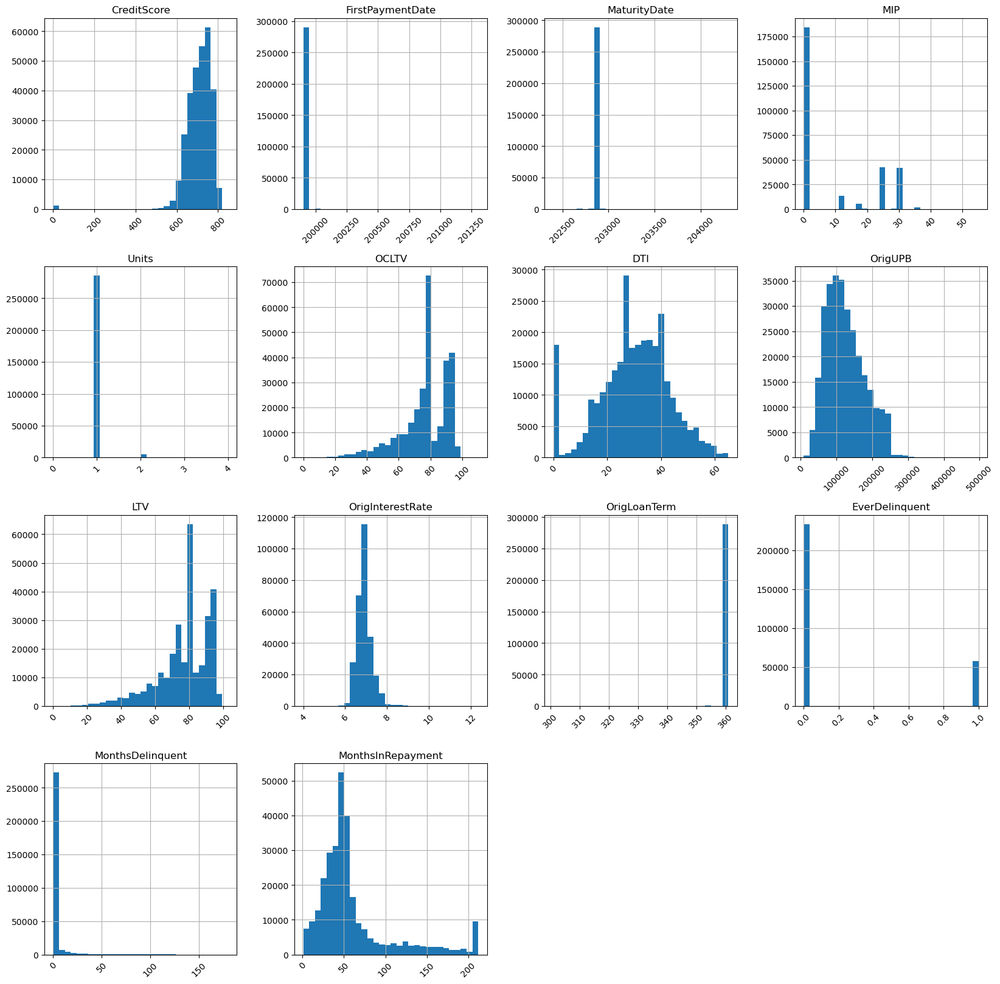

In [9]:
df.hist(bins=30,figsize=(20,20),xrot=45)
plt.show() ## Histogram for the numerical variables

### Observations:
1. Credit score follows a left skewed distribution. Most values are concentrated within 500-800 points
2. Interest Rates are lying between 6-8%
3. OrigUPB values are lying between 100000-300000
4. LTV and OCLTV follows a left skewed distribution. Highest value of both is between 80 to 100

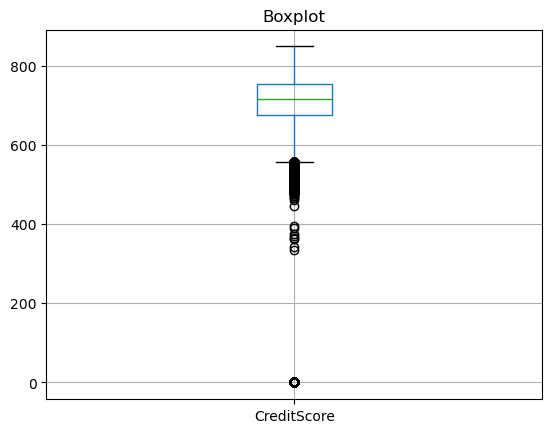

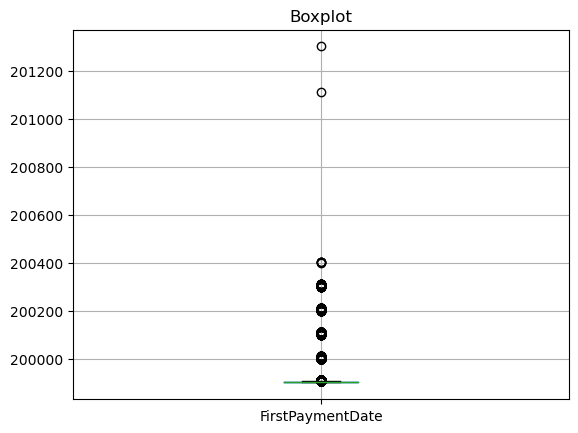

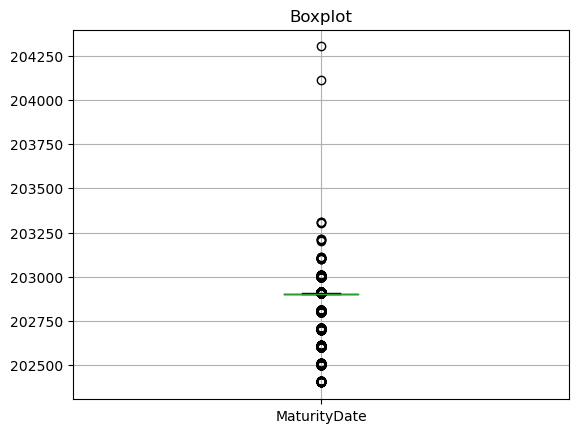

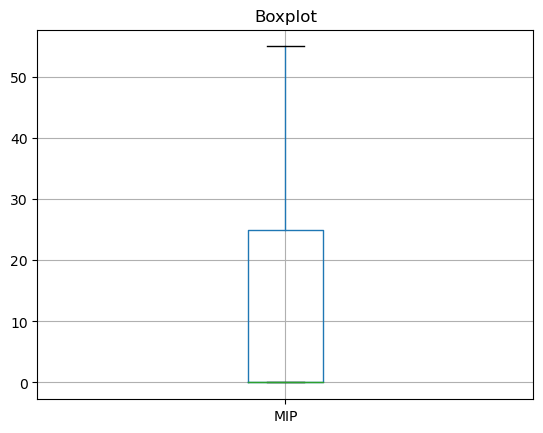

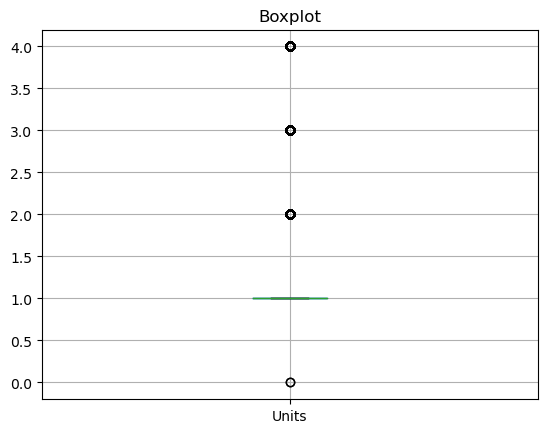

...

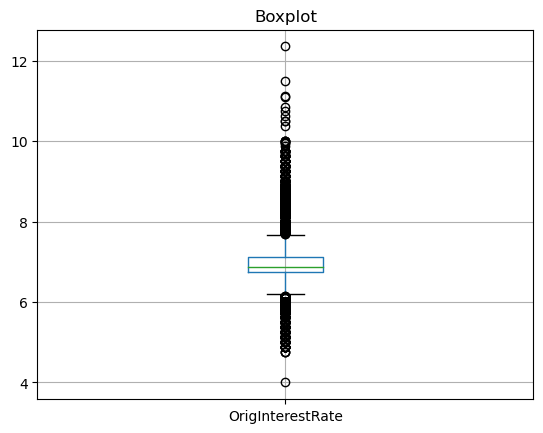

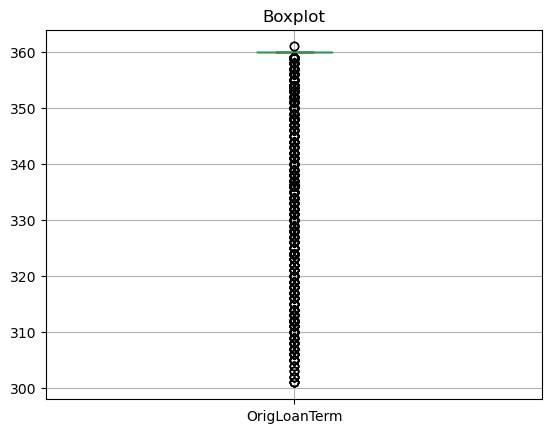

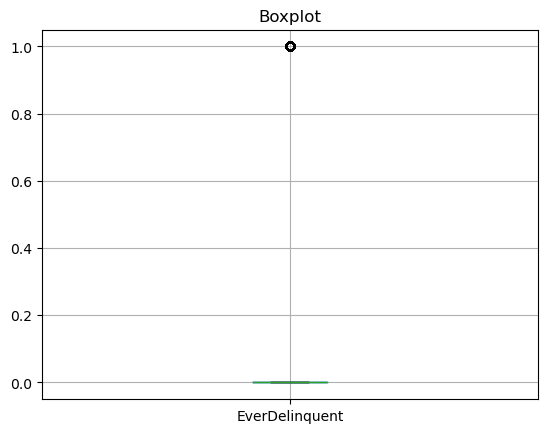

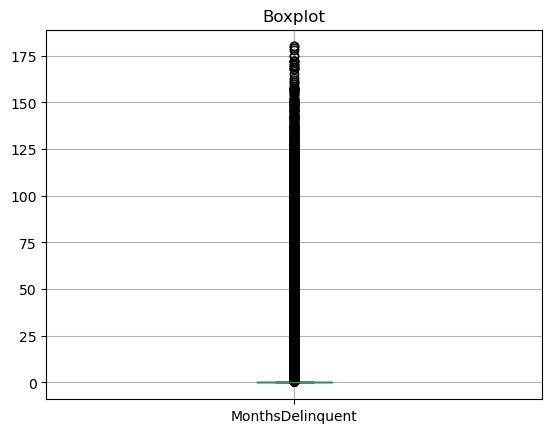

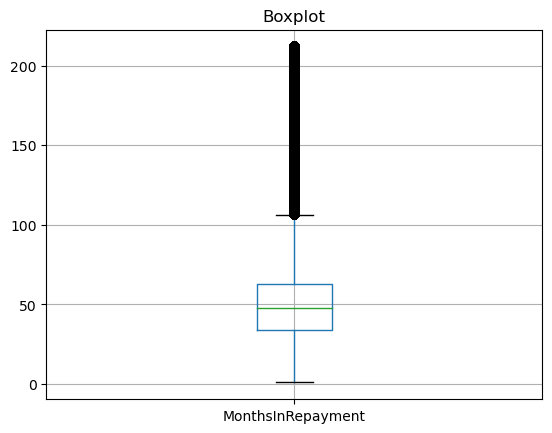

In [10]:
for var in df.select_dtypes(exclude='O'): ## Loop which contains only numerical variables
    df.boxplot(var) 
    plt.title('Boxplot')
    plt.show() ## Creating a boxplot for all the numerical variables

<AxesSubplot:xlabel='EverDelinquent', ylabel='Density'>

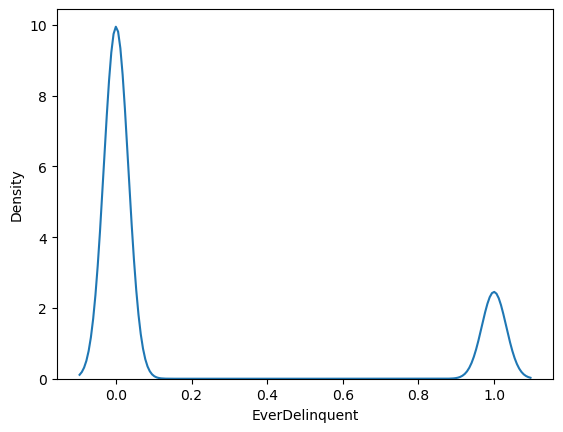

In [11]:
sns.kdeplot(data=df,x='EverDelinquent',gridsize=200) ## Plotiing the kde plot for everdelinquent

In [12]:
def distplot(df,variable): ## Creating a function which will plot the kde plot of the variables
    plt.figure(figsize=(8,8))
    sns.kdeplot(df[variable])
    plt.title('Density Plot')
    plt.show() 

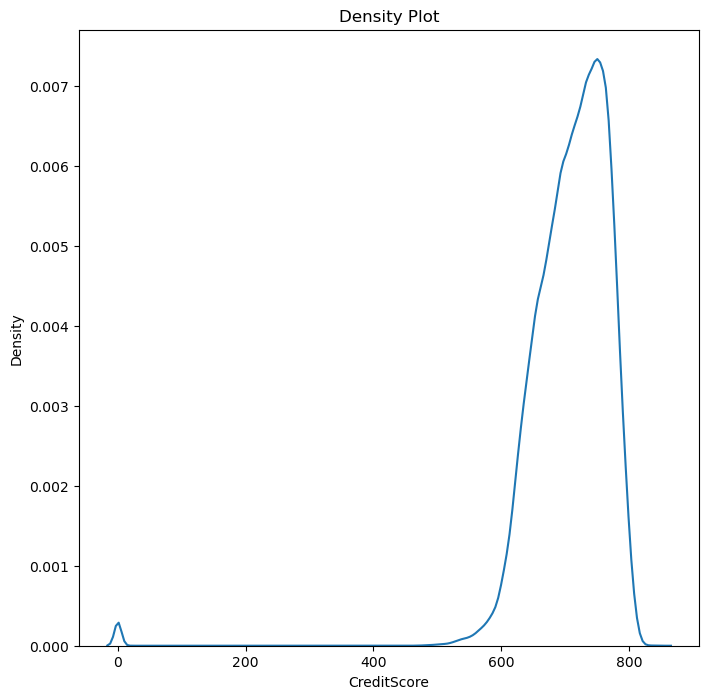

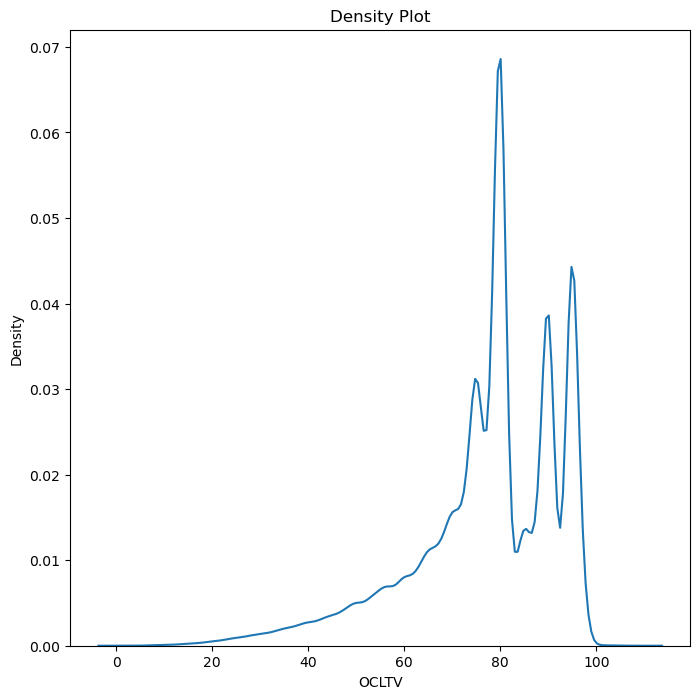

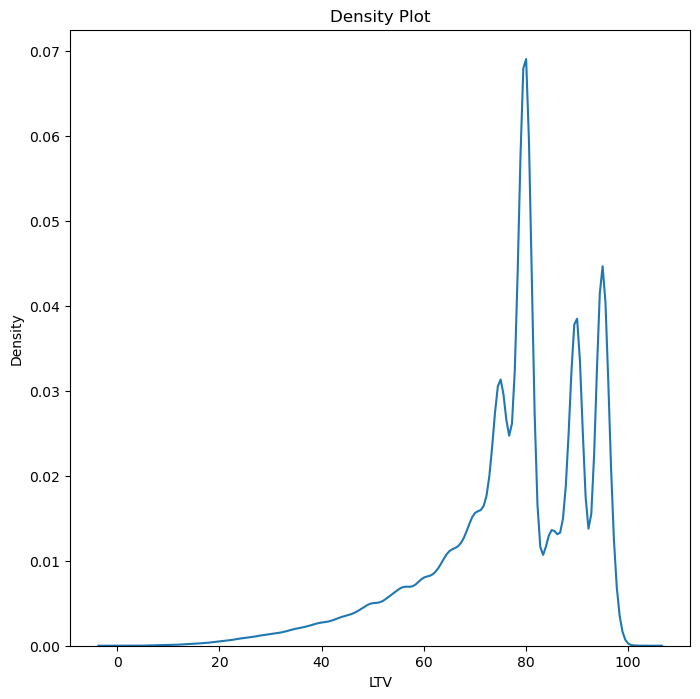

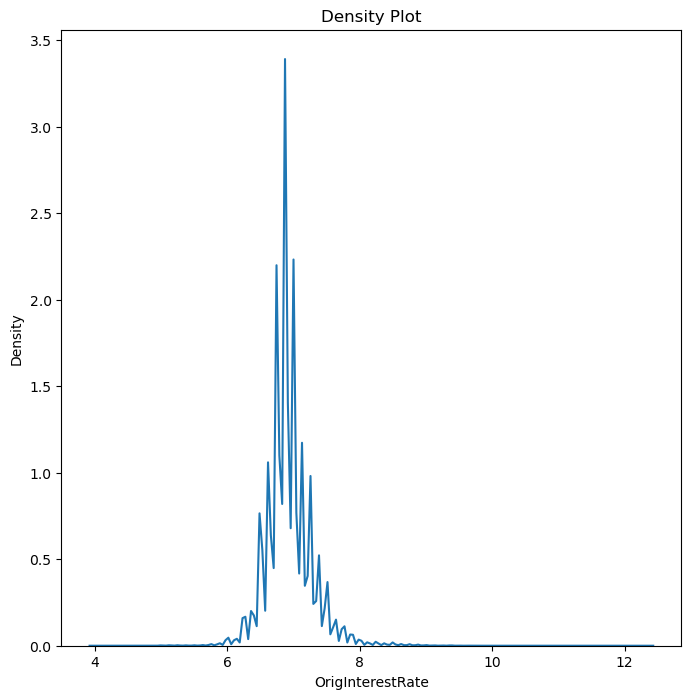

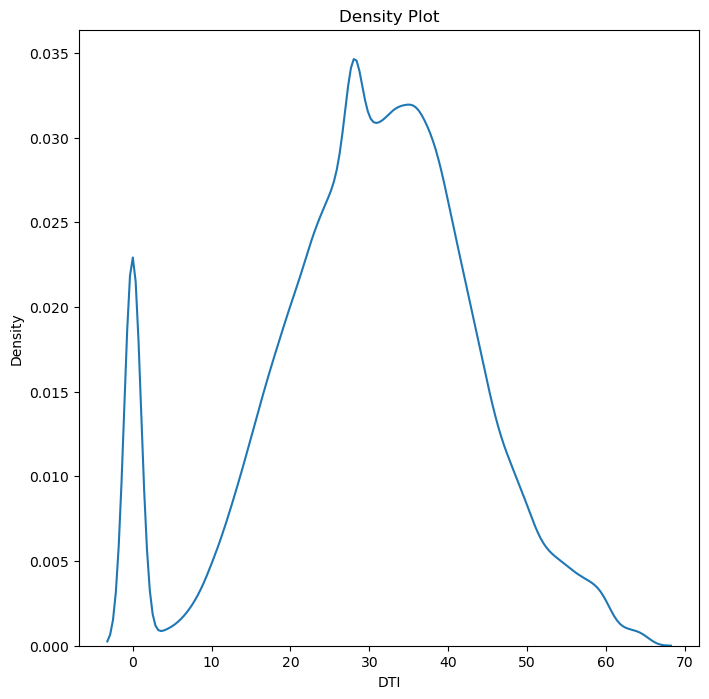

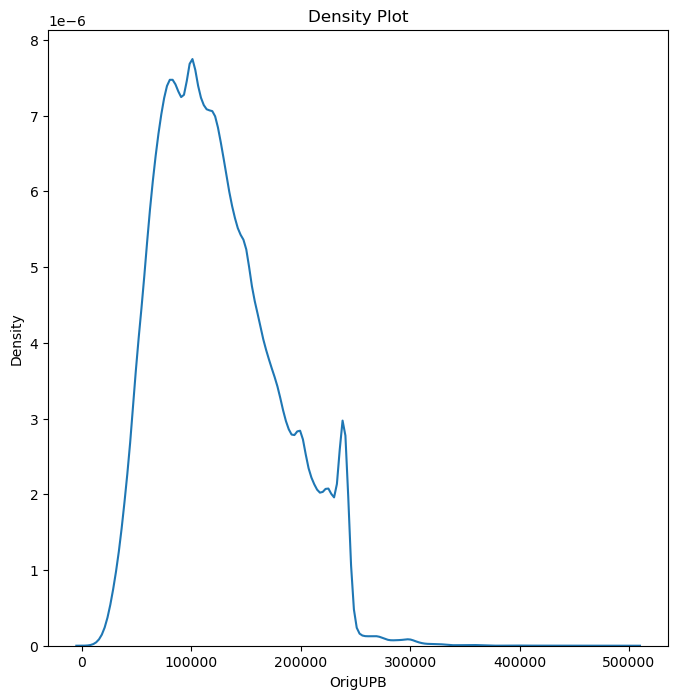

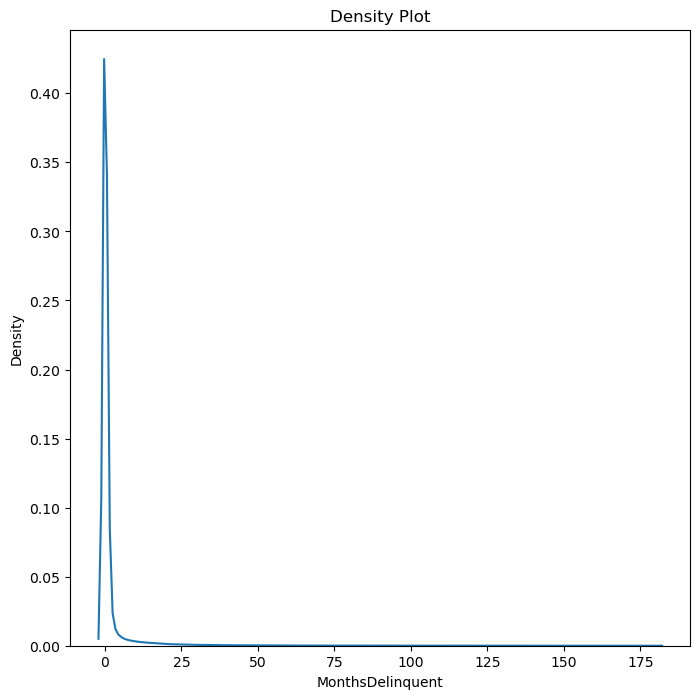

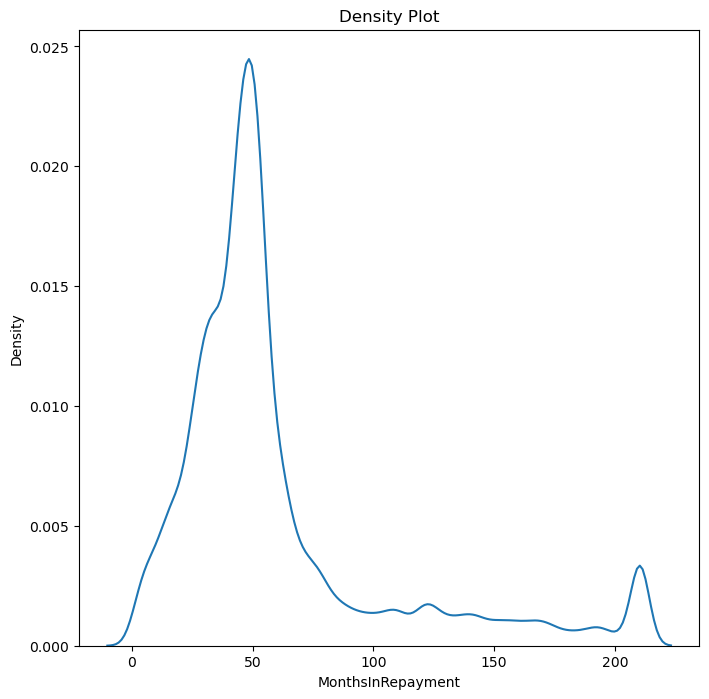

In [13]:
var=['CreditScore','OCLTV','LTV','OrigInterestRate','DTI','OrigUPB',
    'MonthsDelinquent','MonthsInRepayment']
for variable in var:
    distplot(df,variable) ## Loop which creates the density plot for all the variables mentioned in the list

Text(0, 0.5, '% of borrowers')

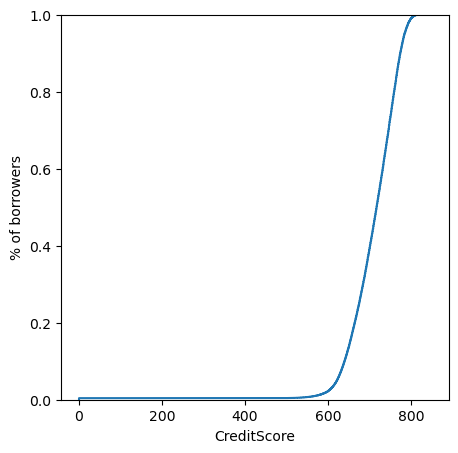

In [14]:
plt.figure(figsize=(5,5))
sns.ecdfplot(data=df,x='CreditScore') ## plotting the ecdf plot of credit score
plt.ylabel('% of borrowers')

### Observations:
We can interpret the graph as follows: Let's say we want to find out what percentage of borrowers have a credit score less than 800 points, then we can see that almost all the borrowers(99%) have the credit score less than 800 points

Text(0, 0.5, '% of borrowers')

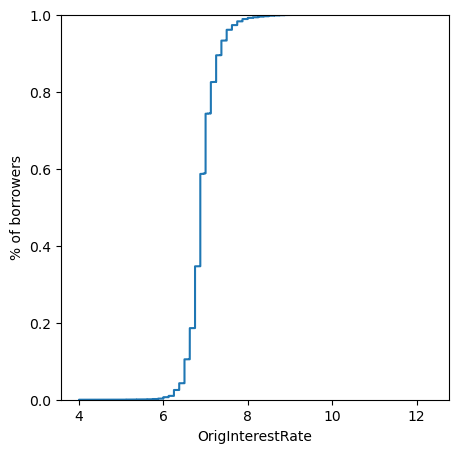

In [15]:
plt.figure(figsize=(5,5))
sns.ecdfplot(data=df,x='OrigInterestRate')
plt.ylabel('% of borrowers') ## plotting the cumulative distribution plot for interest rate

### Observations:
57% of the borrowers are paying an interest of less than 7%

98% of the borrowers are paying an interest of less than 8%

Text(0, 0.5, '% of borrowers')

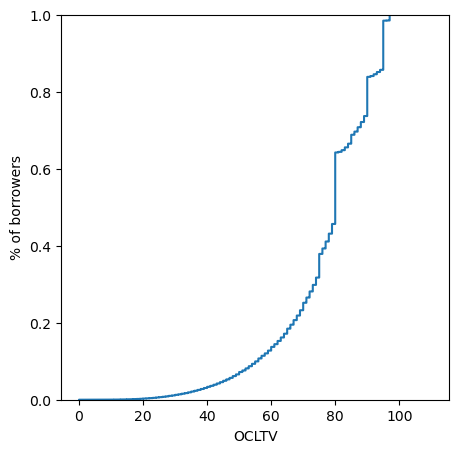

In [16]:
plt.figure(figsize=(5,5))
sns.ecdfplot(data=df,x='OCLTV')
plt.ylabel('% of borrowers')

### Observations:
Approximately 3% of the borrowers have ocltv ratio less than 40

Around 10% of the borrowers have an ocltv ratio less than 60

Approximately 40% of the borrowers have an ocltv ratio less than 80

Text(0, 0.5, '% of borrowers')

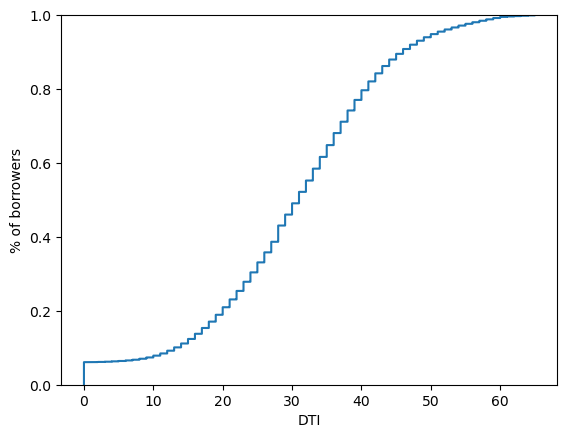

In [17]:
sns.ecdfplot(data=df,x='DTI')
plt.ylabel('% of borrowers')

### Observations:
Approx 40% of the borrowers have DTI ratio less than 30

Approx 70% of the borrowers have DTI ratio less than 40

Approx 90% of the borrowers have DTI ratio less than 50

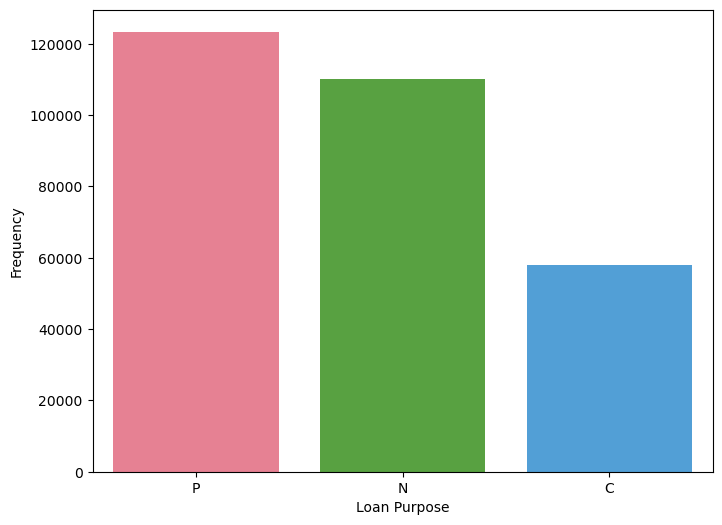

In [18]:
plt.figure(figsize=(8,6))
sns.countplot(x='LoanPurpose',data=df,palette='husl')
plt.xlabel('Loan Purpose')
plt.ylabel('Frequency')
plt.show() ## Plotting the countplot for loan purpose

### Observations:
The borrowers are mostly taking loans for purpose P followed by N and then C

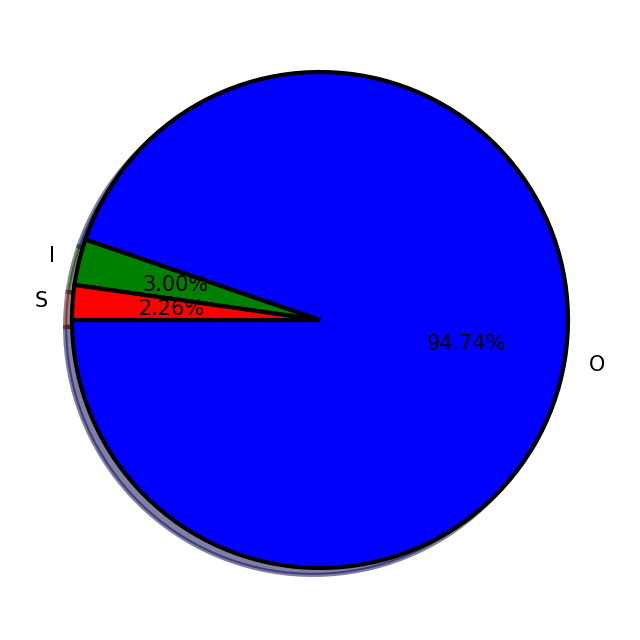

In [19]:
plt.figure(figsize=(8,9))
plt.pie(df['Occupancy'].value_counts(),labels=['O','I','S'],autopct='%1.2f%%',
       colors=['b','g','r'],startangle=180,shadow=True,textprops={'fontsize':15},
       wedgeprops={'linewidth':3,'width':1,'edgecolor':'k'},explode=[0,0,0])
plt.show() 

### Observations:
1. 94.74% of the observations are owner occupied
2. 3% of the observations are for investment incentive
3. 2.26% of the observations are for second home

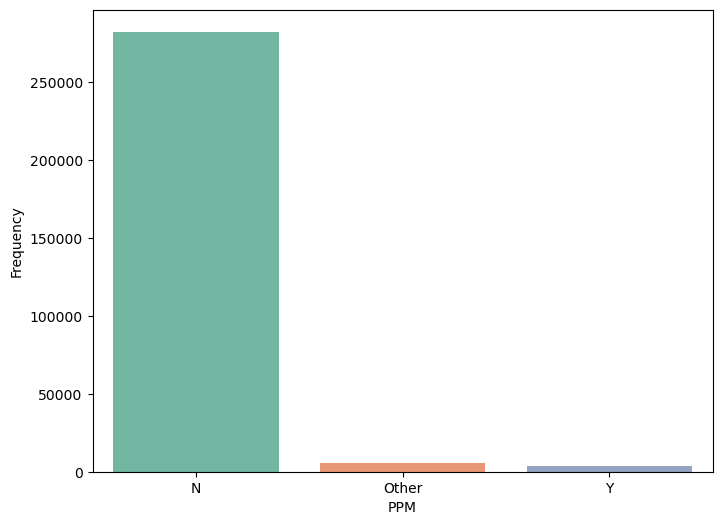

In [20]:
plt.figure(figsize=(8,6))
sns.countplot(x='PPM',data=df,palette='Set2')
plt.xlabel('PPM')
plt.ylabel('Frequency')
plt.show()

### Observations:
In most of the transactions there is no PPM. That means the borrowers are not paying penalty on their loans

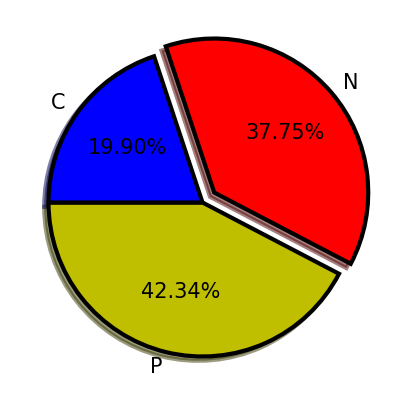

In [21]:
plt.figure(figsize=(5,5))
plt.pie(df['LoanPurpose'].value_counts(),labels=df['LoanPurpose'].unique(),autopct='%1.2f%%',
       colors=['y','r','b'],startangle=180,shadow=True,textprops={'fontsize':15},
       wedgeprops={'linewidth':3,'width':1,'edgecolor':'k'},explode=[0,0.1,0])
plt.show()

### Observations:
1. 42.34% of the loans are for purpose P
2. 37.75% of the loans are for purpose N
3. 19.9% of the loans are for purpose C

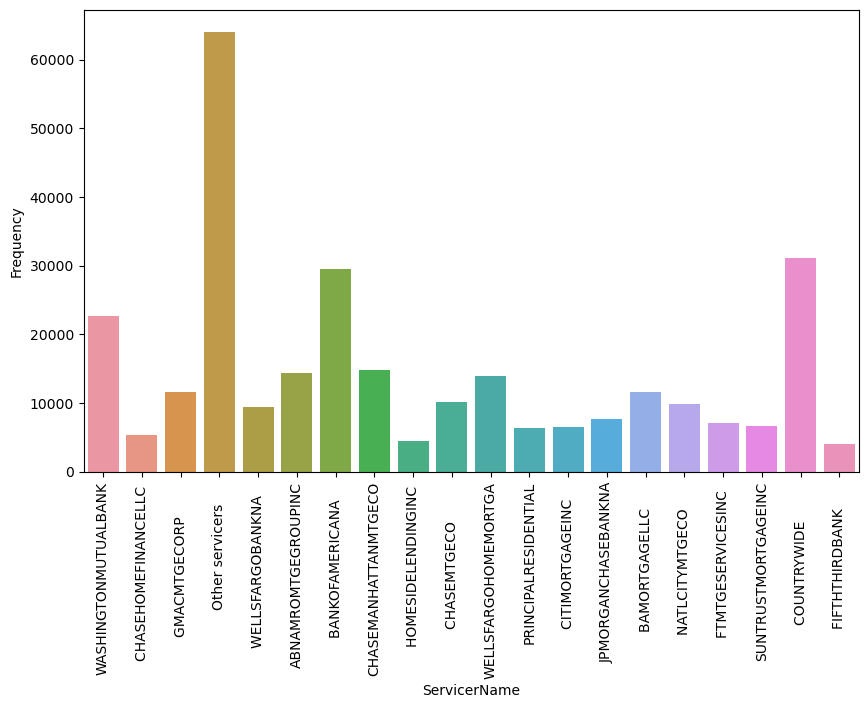

In [22]:
plt.figure(figsize=(10,6))
sns.countplot(x='ServicerName',data=df)
plt.xlabel('ServicerName')
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.show()

### Observations:
Other servicers are giving maximum loans
The Servicers who are reluctant to give loans means that there are more cases of prepayment in that banks or
financial institutions.

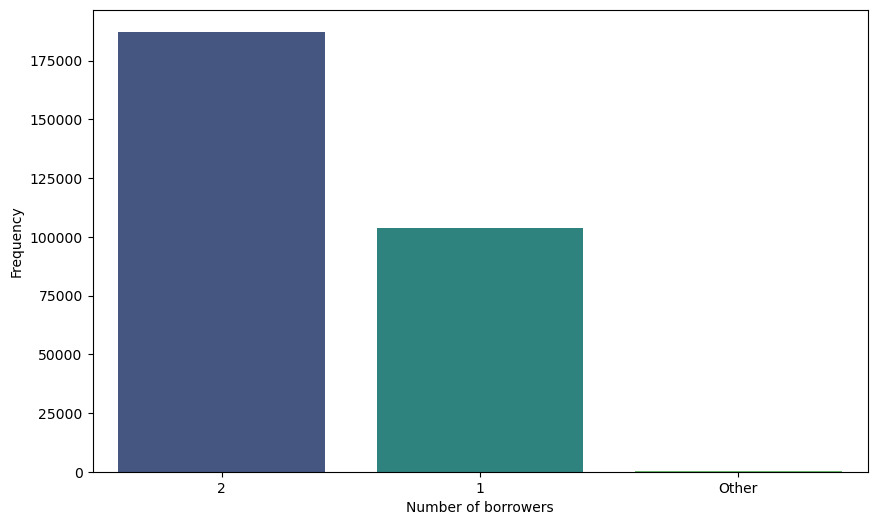

In [23]:
plt.figure(figsize=(10,6))
sns.countplot(x='NumBorrowers',data=df,palette='viridis')
plt.xlabel('Number of borrowers')
plt.ylabel('Frequency')
plt.show()

### Observations:
We can see that the number of borrowers who are taking maximum loans are 2. That means delinquency rate may vary as in most cases there are mix of borrowers who are taking loans

<AxesSubplot:>

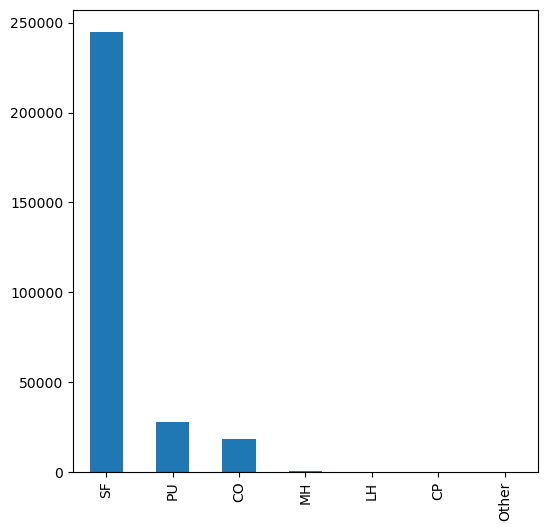

In [24]:
plt.figure(figsize=(6,6))
df['PropertyType'].value_counts().plot.bar()

### Observations:
Highest number of observations are from property type SF. This means that the loan is taken mostly for the property type SF

In [25]:
## Creating a function which plots histogram and q-q plot for the variables to check normality
import scipy.stats as stats
def distribution_plot(df,variable):
    plt.figure(figsize=(6,6)) ## figure size is 6,6
    
    plt.subplot(1,2,1) ## 1st row, 2 columns, 1st chart
    df[variable].hist(bins=30)
    plt.title('Histogram of {}'.format(variable))
    
    plt.subplot(1,2,2) ## 1st row,2 columns, 2nd chart
    stats.probplot(df[variable],dist='norm',plot=plt) ## probability plot or q-q plot with distribution as normal
    plt.title('Q-Q Plot of {}'.format(variable))
    
    plt.show() ## plotting histogram and q-q plot of the variables before handling outliers

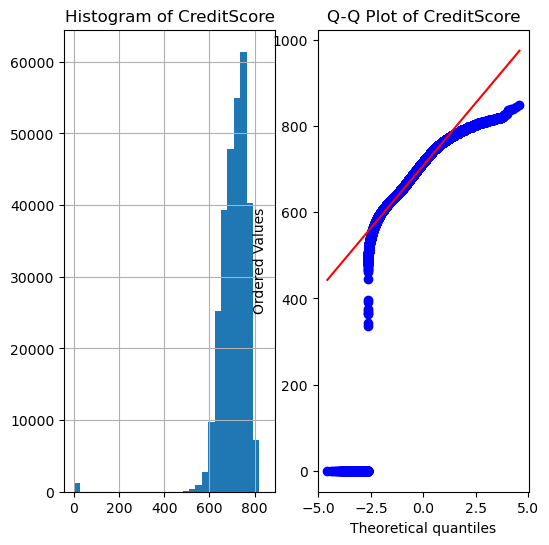

In [26]:
distribution_plot(df,'CreditScore')

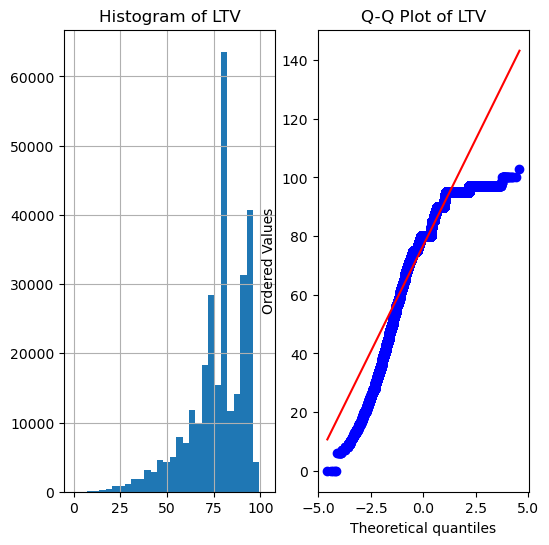

In [27]:
distribution_plot(df,'LTV')

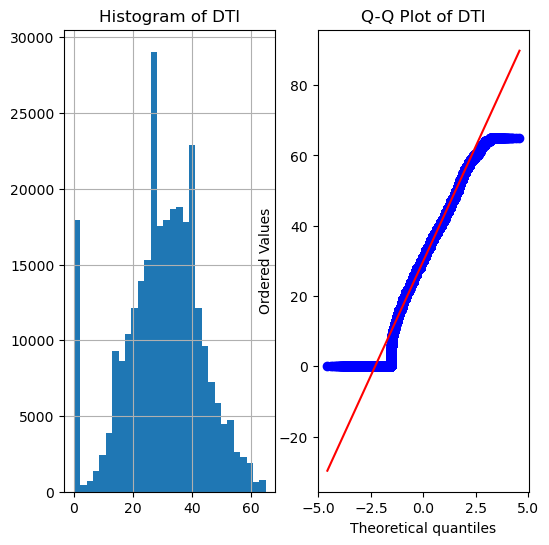

In [28]:
distribution_plot(df,'DTI')

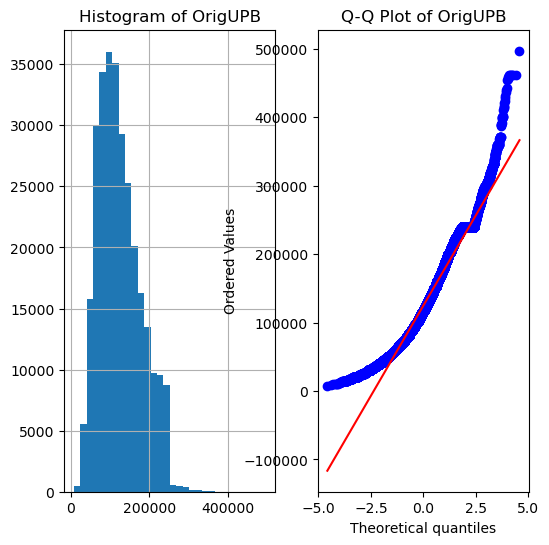

In [29]:
distribution_plot(df,'OrigUPB')

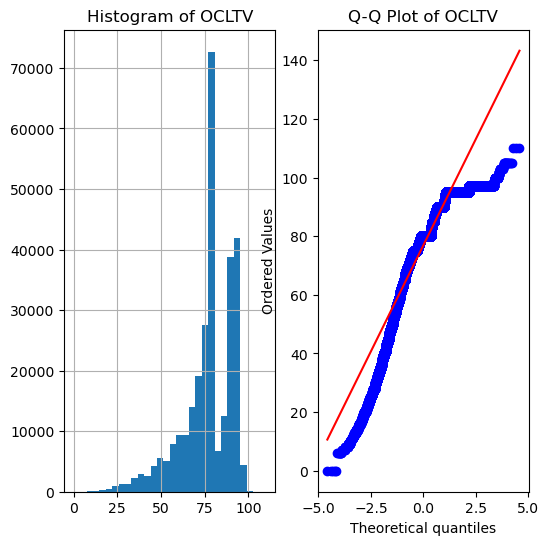

In [30]:
distribution_plot(df,'OCLTV')

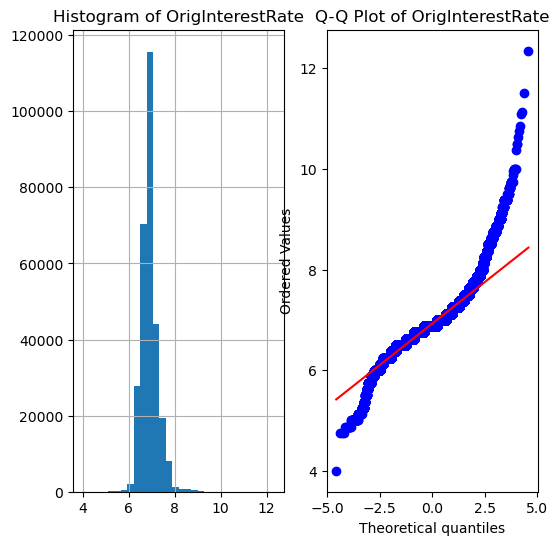

In [31]:
distribution_plot(df,'OrigInterestRate')

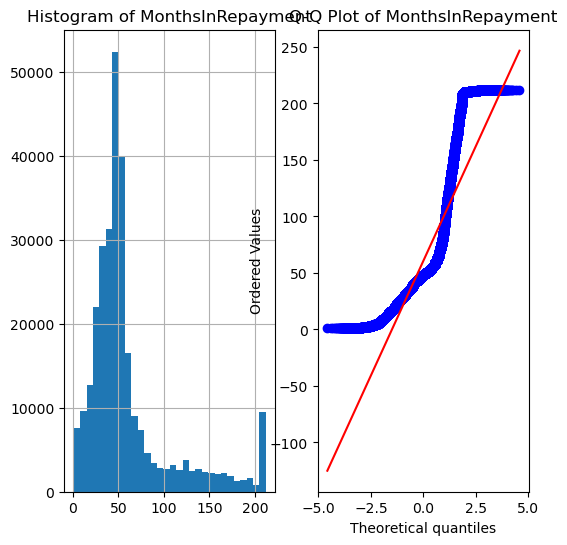

In [32]:
distribution_plot(df,'MonthsInRepayment')

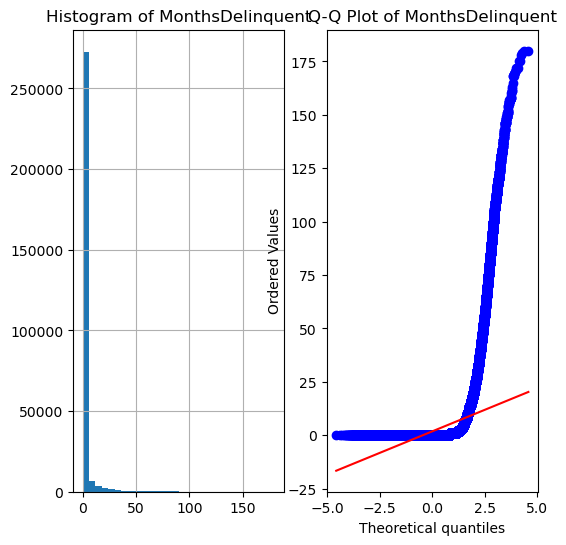

In [33]:
distribution_plot(df,'MonthsDelinquent')

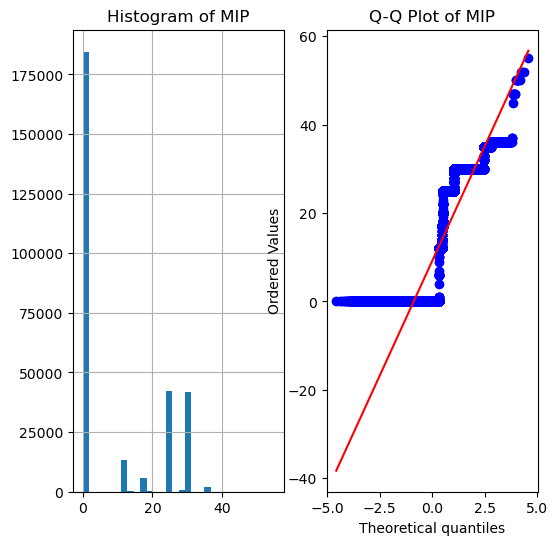

In [34]:
distribution_plot(df,'MIP')

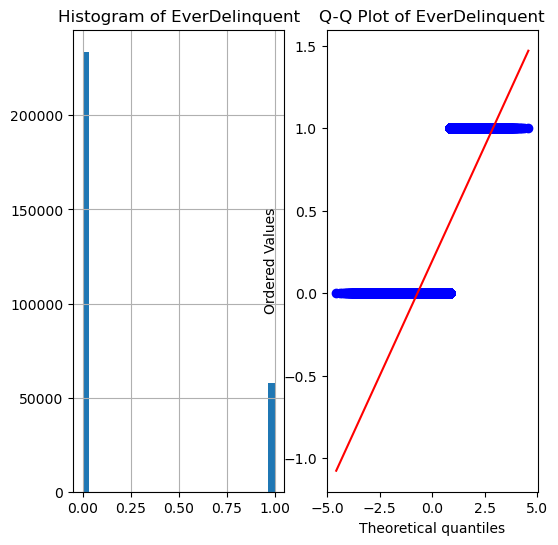

In [35]:
distribution_plot(df,'EverDelinquent')

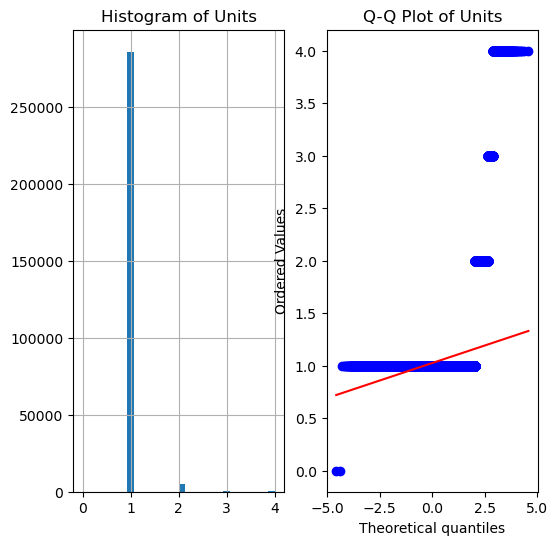

In [36]:
distribution_plot(df,'Units')

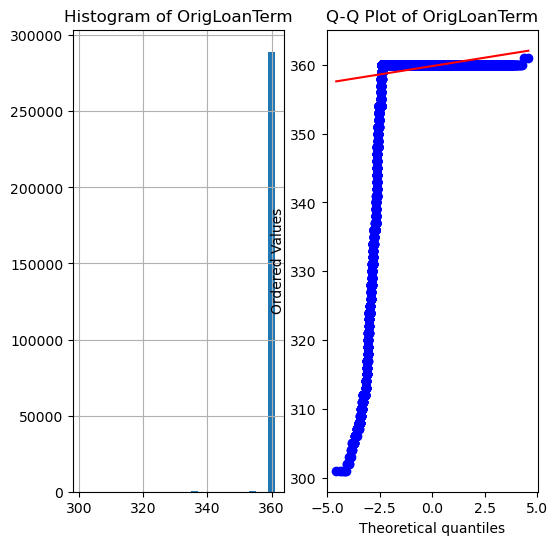

In [37]:
distribution_plot(df,'OrigLoanTerm')

### Observations:
We can see that there are some variables which follows a skewed distribution and some follow gaussian distribution. We can transform the variables which are skewed to the normal distribution by applying appropriate transformation

### Bivariate Analysis/Multivariate Analysis
1. Numerical vs Numerical
2. Numerical vs Categorical
3. Categorical vs Categorical

In [38]:
df.columns

Index(['CreditScore', 'FirstPaymentDate', 'FirstTimeHomebuyer', 'MaturityDate',
       'MSA', 'MIP', 'Units', 'Occupancy', 'OCLTV', 'DTI', 'OrigUPB', 'LTV',
       'OrigInterestRate', 'Channel', 'PPM', 'ProductType', 'PropertyState',
       'PropertyType', 'PostalCode', 'LoanSeqNum', 'LoanPurpose',
       'OrigLoanTerm', 'NumBorrowers', 'SellerName', 'ServicerName',
       'EverDelinquent', 'MonthsDelinquent', 'MonthsInRepayment'],
      dtype='object')

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='DTI', ylabel='CreditScore'>

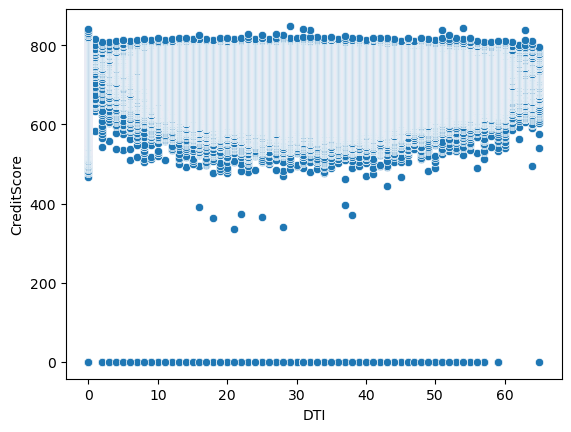

In [39]:
sns.scatterplot(df['DTI'],df['CreditScore'])

### Observations:
There is a negative relationship between DTI and Credit Score. As DTI increases, Creditscore tends to fall which means that the delinquency rate rises

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='LTV', ylabel='DTI'>

C:\Users\prath\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


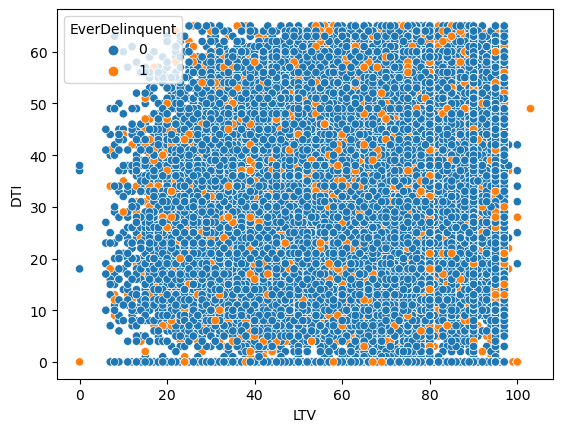

In [40]:
sns.scatterplot(df['LTV'],df['DTI'],hue=df['EverDelinquent'])

### Observations:
There is a positive relation between LTV and DTI. AS LTV rises, DTI also rises and with an increase in DTI most of the buyers are non-delinquent i.e. they are not behind their payments. Here with an increase in DTI the buyers are still making their payments on time

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='OrigInterestRate', ylabel='CreditScore'>

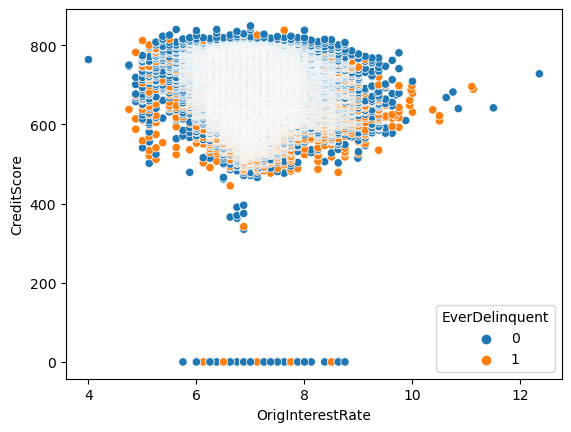

In [41]:
sns.scatterplot(df['OrigInterestRate'],df['CreditScore'],hue=df['EverDelinquent'])

### Observations:
There is an inverse relation between interest rate and credit score. Again the borrowers are non-delinquent with a fall in credit score due to rise in interest rates. Delinquency rates are lower

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='OCLTV', ylabel='OrigInterestRate'>

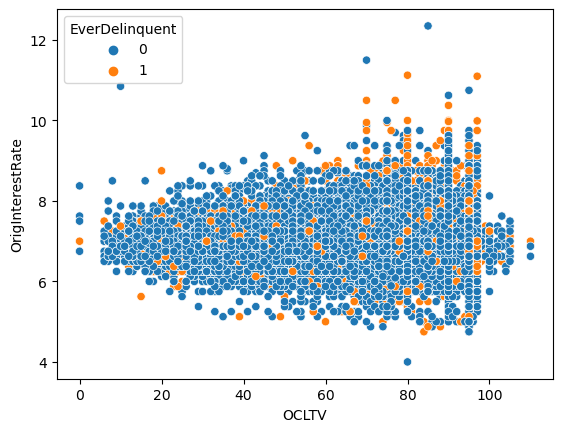

In [42]:
sns.scatterplot(df['OCLTV'],df['OrigInterestRate'],hue=df['EverDelinquent'])

### Observations:
There is a positive relation between OCLTV and OrigInterestRate. As ocltv rises the interest rates are rising but most of the borrowers are non-delinquent so the delinquency rate is lower 

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='LTV', ylabel='MIP'>

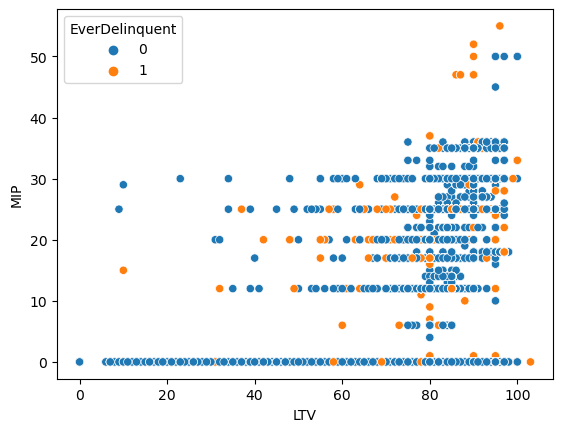

In [43]:
sns.scatterplot(df['LTV'],df['MIP'],hue=df['EverDelinquent'])

### Observations:
There is a positive relationship between LTV and MIP. With an increase in MIP there are still more non-delinquent borrowers

<AxesSubplot:xlabel='Occupancy', ylabel='CreditScore'>

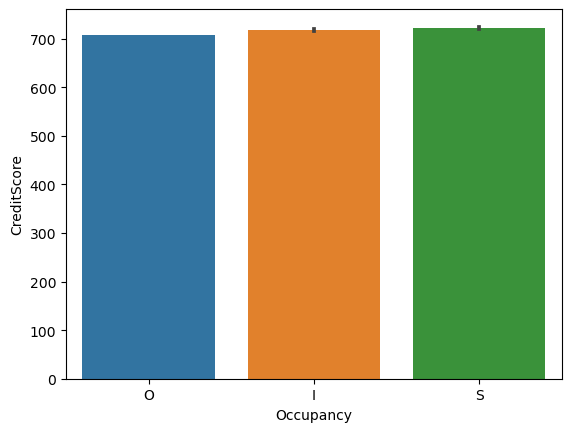

In [44]:
sns.barplot(data=df,x='Occupancy',y='CreditScore')

### Observations:
Highest Credit score is in Occupancy S i.e. Second home. This means that when the borrower is keeping the house as a seasonal residence rather than his primary residence then the delinquency rates are lower because of high credit score

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='LoanPurpose', ylabel='DTI'>

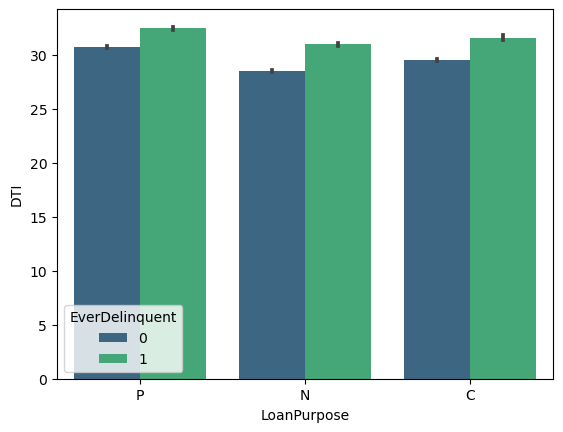

In [45]:
sns.barplot(df['LoanPurpose'],df['DTI'],hue=df['EverDelinquent'],palette='viridis')

### Observations:
When the loan is taken for purchasing a property i.e. a home purchase then the DTI ratio is the highest for delinquent borrowers borrowers,this means that in case of purchase the delinquency rates are highest. When the mortgage loan is taken for the purpose of refinancing an existing mortgage then the DTI ratio is the lowest for delinquent borrowers, therefore in case of refinancing an existing mortgage the delinquency rates are comparatively lower

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='NumBorrowers', ylabel='MIP'>

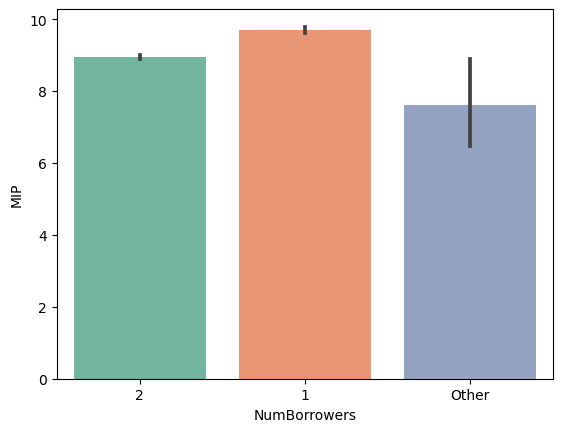

In [46]:
sns.barplot(df['NumBorrowers'],df['MIP'],palette='Set2')

### Observations:
MIP for 1 borrower is higher than MIP for 2 borrowers, therefore it would be better if the mortgage is purchased by a mix of borrowers so that the premimum is reduced

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='EverDelinquent', ylabel='LTV'>

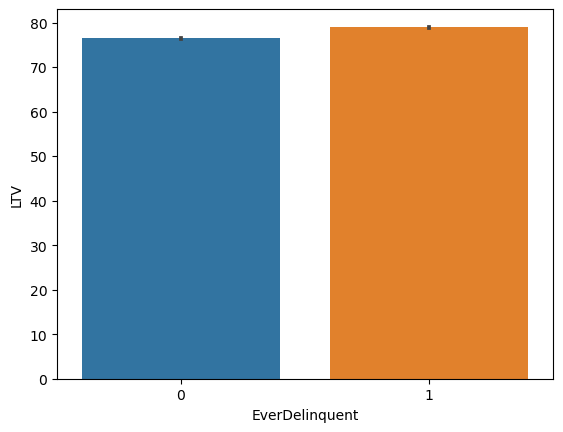

In [47]:
sns.barplot(df['EverDelinquent'],df['LTV'])

### Observations:
LTV is higher for delinquent borrowers than non-delinquent borrowers. This means that delinquent borrowers have high financial risk and it may affect the prepayment likelihood

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='LoanPurpose', ylabel='CreditScore'>

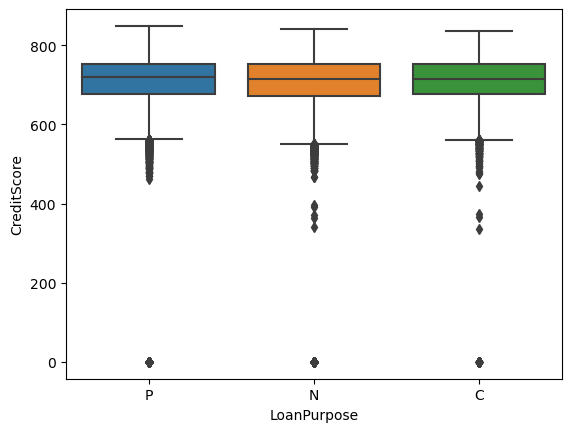

In [48]:
sns.boxplot(df['LoanPurpose'],df['CreditScore'])

### Observations:
1. The median credit score is around 700 when the loan is taken for purchasing a home property
2. The median credit score is less than 700 when the loan is taken for refinancing a mortgage
3. The median credit score is less than 700 when the loan is taken for cash refinancing

When loan is taken for purchasing a property then there lowest number of outliers

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Channel', ylabel='DTI'>

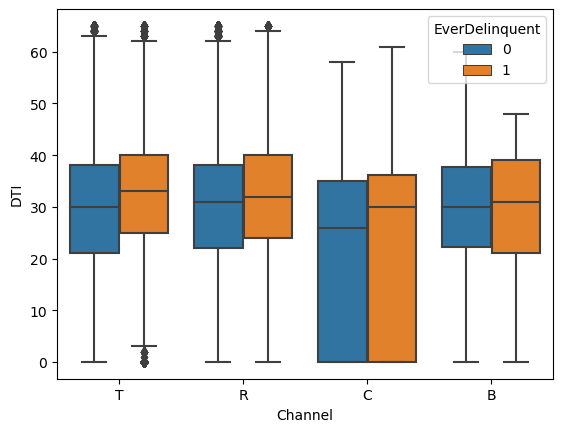

In [49]:
sns.boxplot(df['Channel'],df['DTI'],hue=df['EverDelinquent'])

### Observations:
1. The median DTI ratio for Delinquent borrowers in channel T is 35 and that of non-delinquent borrowers is 30
2. The median DTI ratio for Delinquent borrowers in channel R is approximately more than 30 and same is that for non-delinquent borrowers

3. The median DTI ratio for delinquent borrowers in channel C is higher than that of Non-delinquent borrowers
4. The median DTI ratio for delinquent borrowers in channel B is same as that of non-delinquent borrowers

For delinquent borrowers outliers are more in channel T

For non-delinquent borrowers outliers are more in channel R

There are no outliers present in channel C and B

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Occupancy', ylabel='OrigInterestRate'>

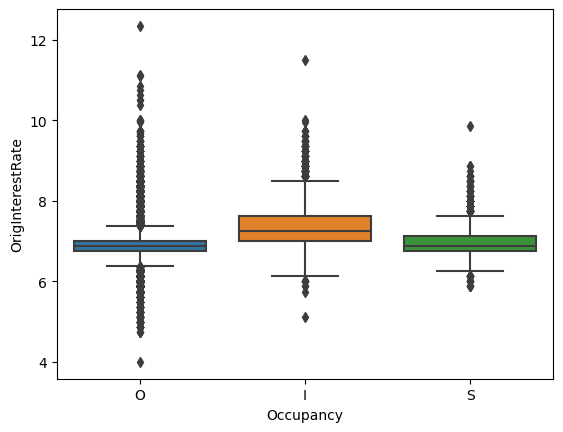

In [50]:
sns.boxplot(df['Occupancy'],df['OrigInterestRate'])

### Observations:
The median interest rate in investment property is around 7%

The median interest rate in second home is less than 7% i.e. approx 6.3

The median interest rate in owner occupied is around 6.5%

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='EverDelinquent', ylabel='OCLTV'>

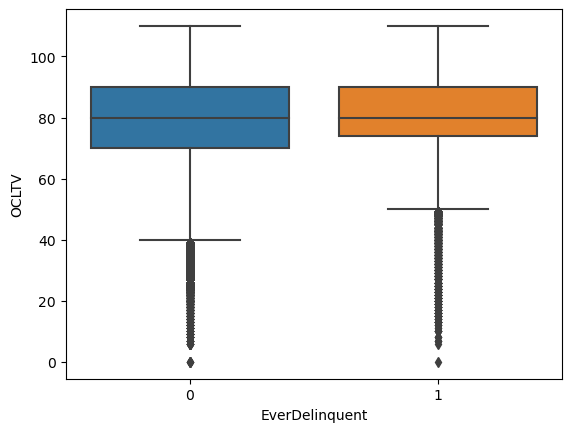

In [51]:
sns.boxplot(df['EverDelinquent'],df['OCLTV'])

### Observations:
The median ocltv ratio of non-delinquent borrowers is 80

The median ocltv ratio of delinquent borrowers is approximately 80 i.e. 79.998

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='EverDelinquent', ylabel='CreditScore'>

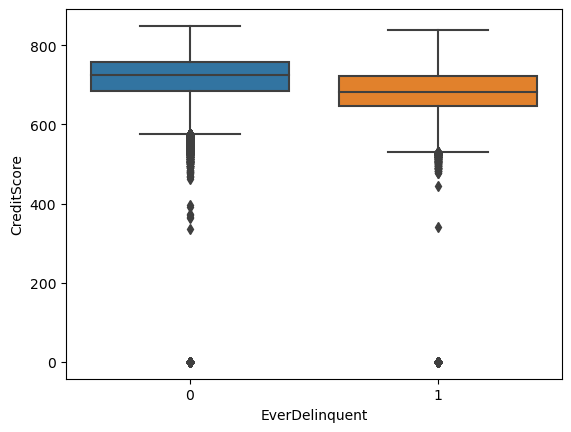

In [52]:
sns.boxplot(df['EverDelinquent'],df['CreditScore'])

### Observations:
The median creditscore for non-delinquent borrowers is around 760 points

The median creditscore for delinquent borrowers is around 640 points

There are more outliers in non-delinquency than in delinquency

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='EverDelinquent', ylabel='OrigUPB'>

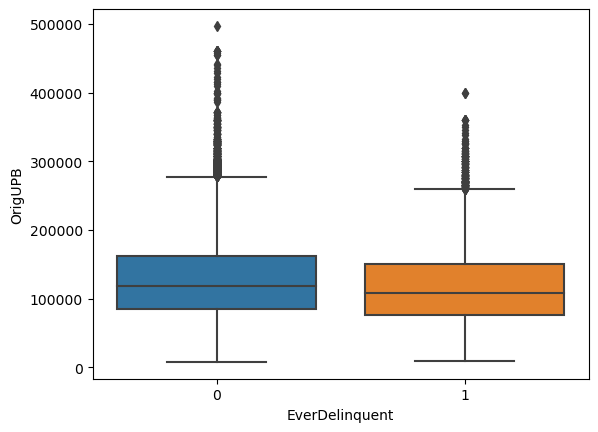

In [53]:
sns.boxplot(df['EverDelinquent'],df['OrigUPB'])

### Observations:
The median OrigUPB for non-delinquent borrowers is 1,10,000

The median OrigUPB for delinquent borrowers is less than 1,10,000

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='PPM', ylabel='OrigInterestRate'>

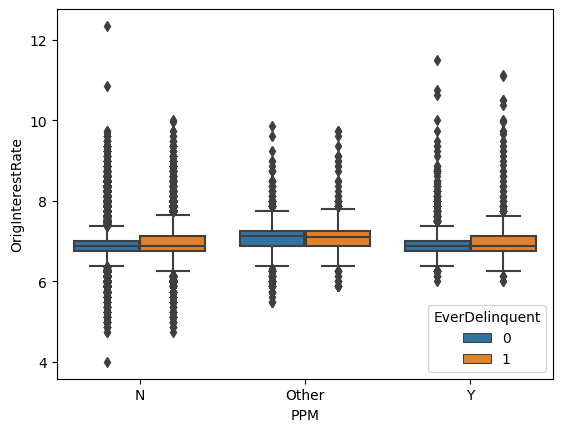

In [54]:
sns.boxplot(df['PPM'],df['OrigInterestRate'],hue=df['EverDelinquent'])

### Observations:
The median interest rate for non-delinquent borrowers when there is no penalty is equal to that of when there is penalty

The median interest rate for delinquent borrowers when there is no penalty is equal to that of when there is penalty

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='DTI', ylabel='Density'>

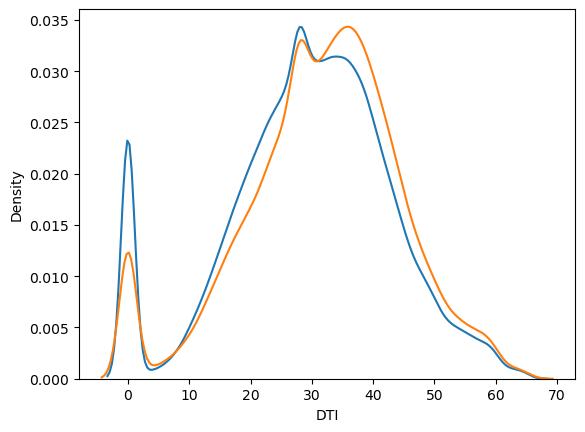

In [55]:
sns.distplot(df[df['EverDelinquent']==0]['DTI'],hist=False)
sns.distplot(df[df['EverDelinquent']==1]['DTI'],hist=False)

### Observations:
 When DTI is between 0-10, probability of delinquency rates are higher, this implies that prepayment risk is low
 
 When DTI is between 10-30, probability of delinquency rates are lower, this implies that prepayment risk is high
 
 When DTI is between 30-70, probability of delinquency rates are higher, this implies that prepayment risk is low

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='LTV', ylabel='Density'>

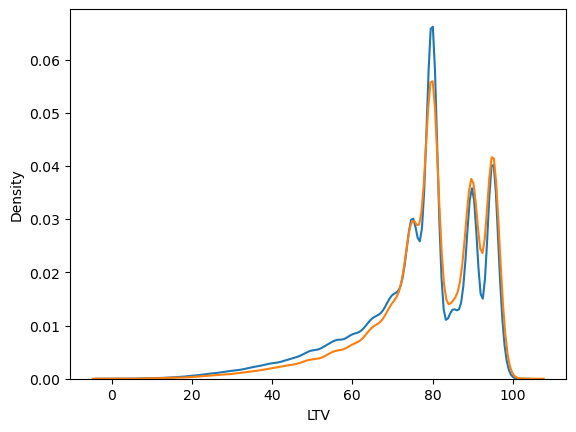

In [56]:
sns.distplot(df[df['EverDelinquent']==0]['LTV'],hist=False)
sns.distplot(df[df['EverDelinquent']==1]['LTV'],hist=False)

### Observations:
When LTV is between 0-80, probability for non-delinquent rates are high

When LTV is between 80-100, probability for delinquent rates are high

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='MIP', ylabel='Density'>

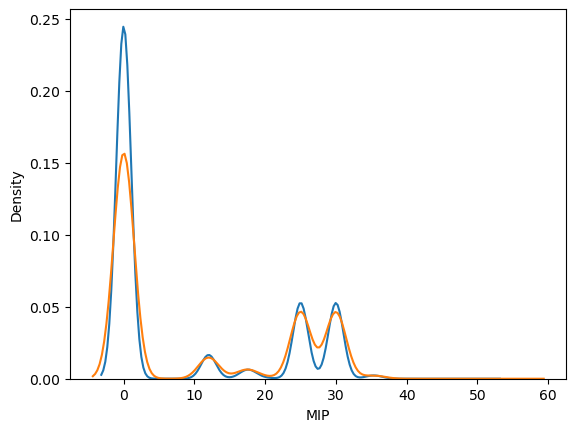

In [57]:
sns.distplot(df[df['EverDelinquent']==0]['MIP'],hist=False)
sns.distplot(df[df['EverDelinquent']==1]['MIP'],hist=False)

### Observations:
When MIP is between 0-10 and 10-20, probability for delinquent rates are high

When MIP is 20-30, probability for non-delinquent rates are high

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='OrigInterestRate', ylabel='Density'>

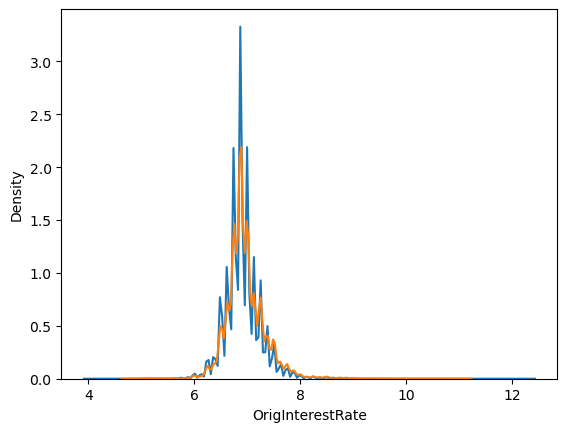

In [58]:
sns.distplot(df[df['EverDelinquent']==0]['OrigInterestRate'],hist=False)
sns.distplot(df[df['EverDelinquent']==1]['OrigInterestRate'],hist=False)

### Observations:
When interest rates are between 6%-8%, probability for non-delinquent rates are high

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='CreditScore', ylabel='Density'>

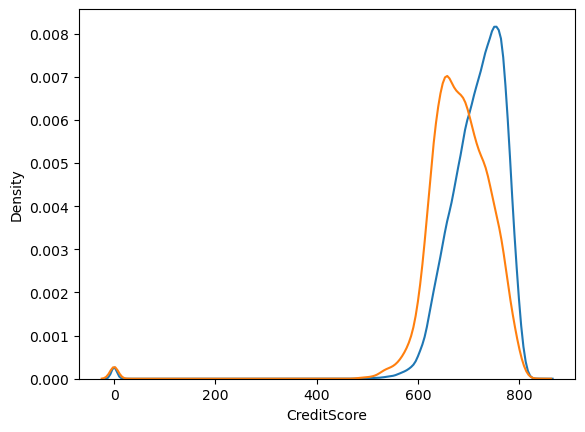

In [59]:
sns.distplot(df[df['EverDelinquent']==0]['CreditScore'],hist=False)
sns.distplot(df[df['EverDelinquent']==1]['CreditScore'],hist=False)

### Observations:
When credit score is between 400-700 points, probability for delinquent rates are high

When credit score is between 700-800 points, probability for non-delinquent rates are high

In [60]:
pd.crosstab(df['EverDelinquent'],df['LoanPurpose'])

LoanPurpose,C,N,P
EverDelinquent,,,
0,45710,88008,100070
1,12301,22028,23334


### Observations:
The delinquency rates are lowest in cash refinancing and highest in purchasing a property

In [61]:
pd.crosstab(df['EverDelinquent'],df['Occupancy'])

Occupancy,I,O,S
EverDelinquent,,,
0,6714,221756,5318
1,2020,54375,1268


### Observations:
Delinquency rates are lowest in Second home and highest in Owner Occupied

<AxesSubplot:xlabel='Channel', ylabel='EverDelinquent'>

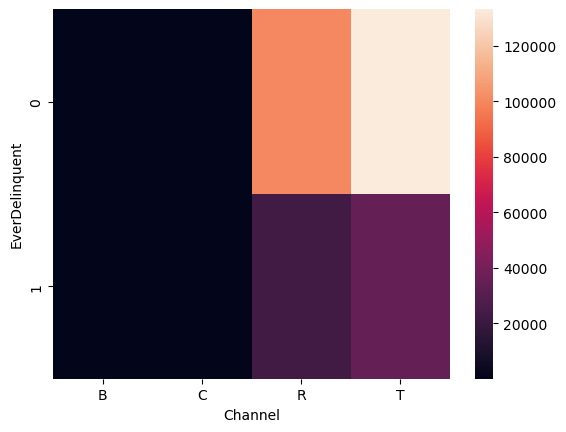

In [62]:
sns.heatmap(pd.crosstab(df['EverDelinquent'],df['Channel']))

### Observations:
The delinquency rates are low in channel B and C, moderately high in channel R and highest in channel T

In [63]:
pd.crosstab(df['EverDelinquent'],df['PPM'])

PPM,N,Other,Y
EverDelinquent,,,
0,226091,4389,3308
1,56034,1016,613


### Observations:
When there is no penalty the number of non-delinquent borrowers are more than the delinquent ones

When there is penalty the number of non-delinquent borrowers are more than the delinquent ones

In [64]:
pd.crosstab(df['EverDelinquent'],df['NumBorrowers'])

NumBorrowers,1,2,Other
EverDelinquent,,,
0,79235,154264,289
1,24542,33071,50


### Observations:
Number of non-delinquent borrowers are more when there are 2 borrowers
Number of delinquent borrowers are also more when there are 2 borrowers

Text(0.5, 0, 'Percentage of delinquent borrowers')

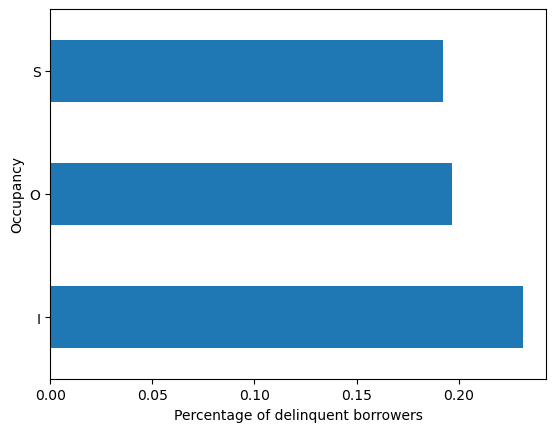

In [65]:
df.groupby('Occupancy')['EverDelinquent'].mean().plot(kind='barh')
plt.xlabel('Percentage of delinquent borrowers')

### Observations:
On an average the percentage of delinquent borrowers is the highest in Investment property followed by Owner occupied and lowest in Second home

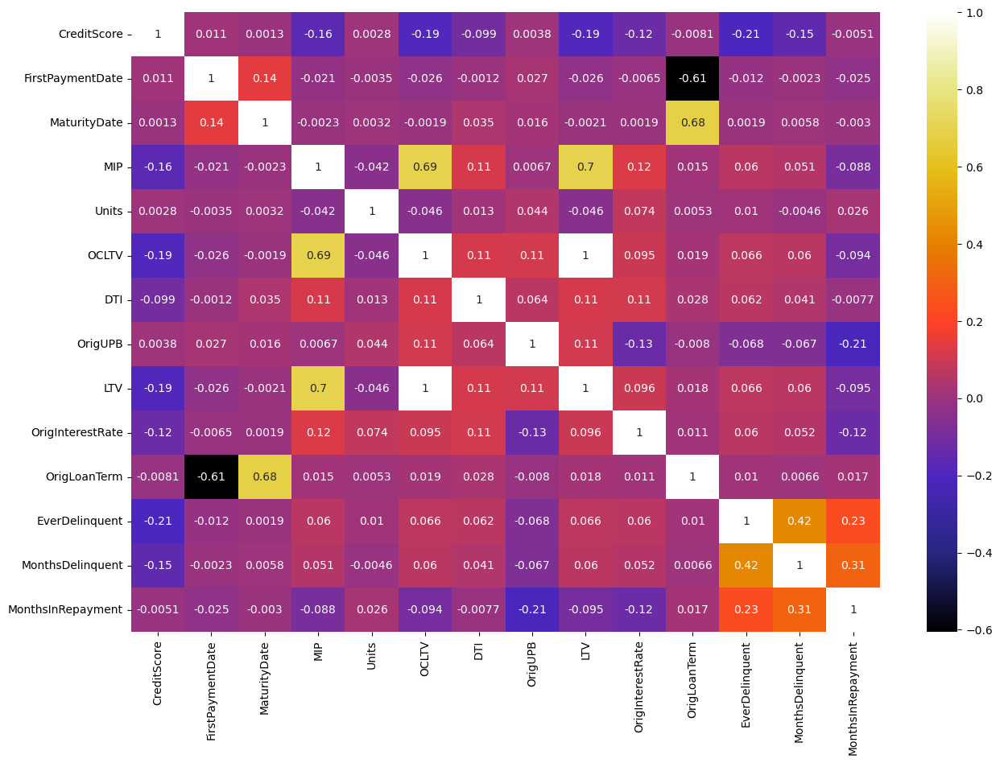

In [66]:
plt.figure(figsize=(15,10))
corr=df.corr()
sns.heatmap(corr,annot=True,cmap=plt.cm.CMRmap)
plt.show()

### Observations:
1. There is very high correlation between MIP and LTV
2. There is very high correlation between OrigLoanterm and maturity date
3. There is very high correlation between OCLTV and MIP
4. Highest correlated features with EverDelinquent are MonthsDelinquent and MonthsRepayment
5. Correlation is moderately high between MonthsRepayment and MonthsDelinquent

### Data Preprocessing

### Handling Outliers

In [67]:
## Function for removing outliers with 85th percentile and 5th percentile
def remove_outliers(df,variable):
    
    upper_limit=df[variable].quantile(0.85)
    lower_limit=df[variable].quantile(0.15)
    df[variable]=np.where(df[variable]<=upper_limit,upper_limit,
                         np.where(df[variable]>=lower_limit,lower_limit,
                                 df[variable])) ## We want values lower than upper limit and larger than lower limit

In [68]:
variables=['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm',
          'MonthsDelinquent','MonthsInRepayment']

for variable in variables:
    remove_outliers(df,variable) ## Loop to remove outliers for the variables in the list

In [69]:
## Function to plot distribution after removing outliers
def distribution_plot(df,variable):
    plt.figure(figsize=(8,6))
    
    plt.subplot(1,2,1)
    df.boxplot(column=variable)
    plt.title('Boxplot after handling outliers')
    
    plt.subplot(1,2,2)
    sns.distplot(df[variable])
    plt.title('Distribution after handling outliers')
    
    plt.show()

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


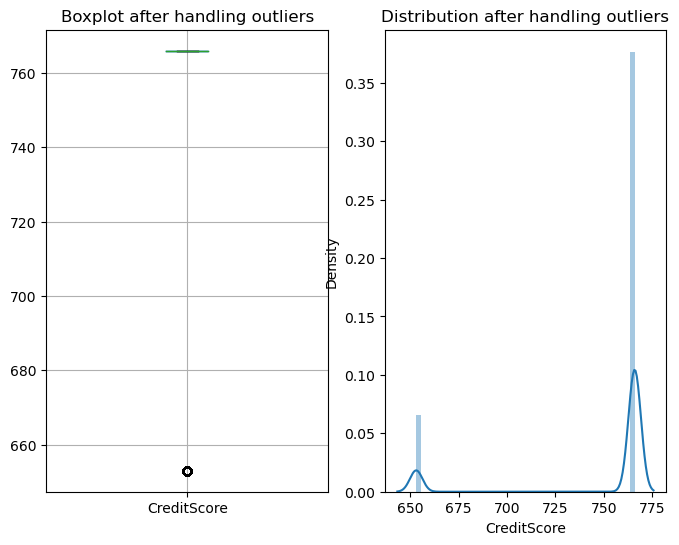

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


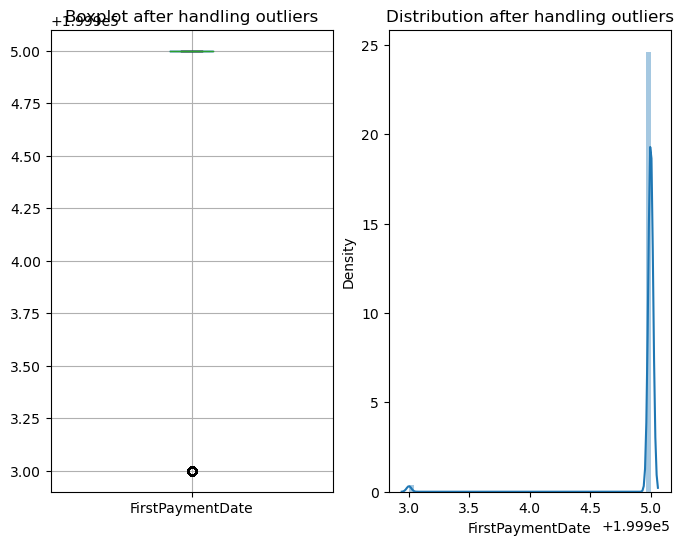

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


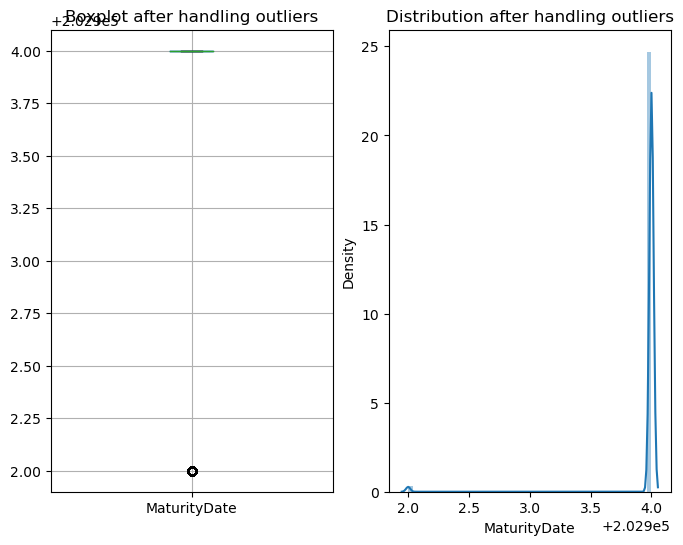

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


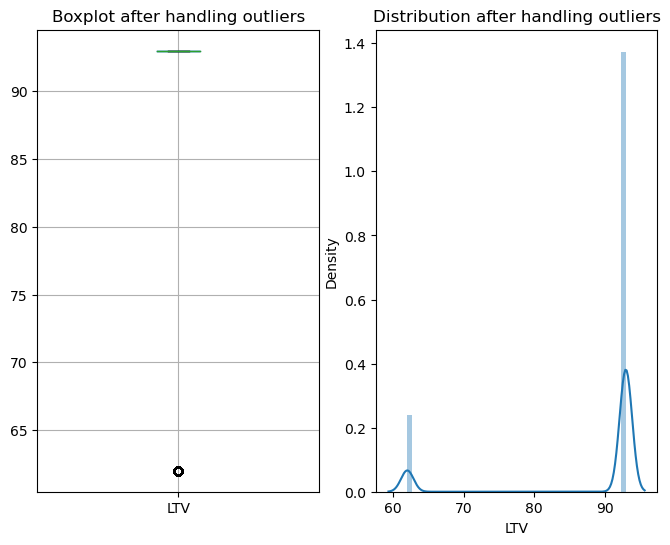

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


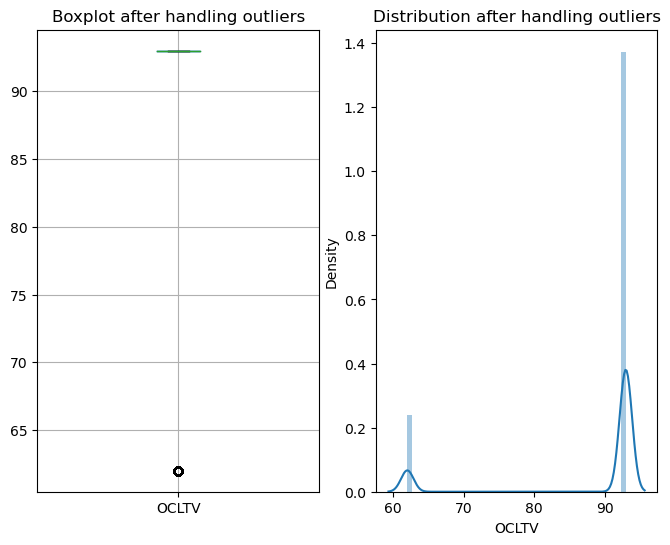

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


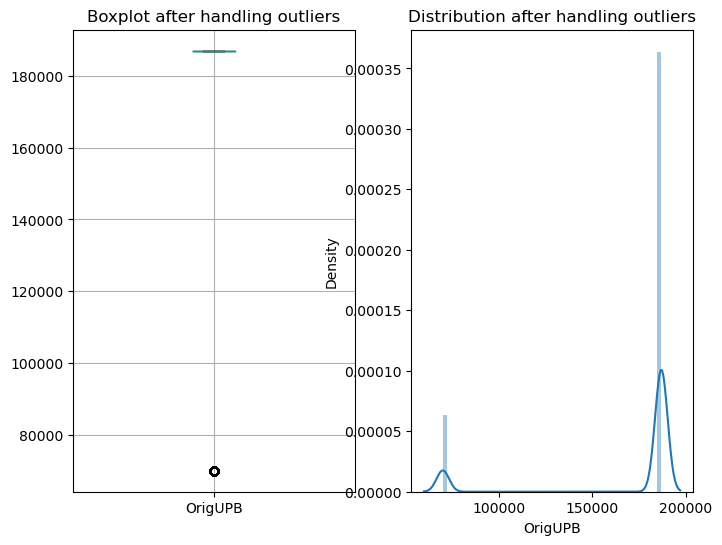

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


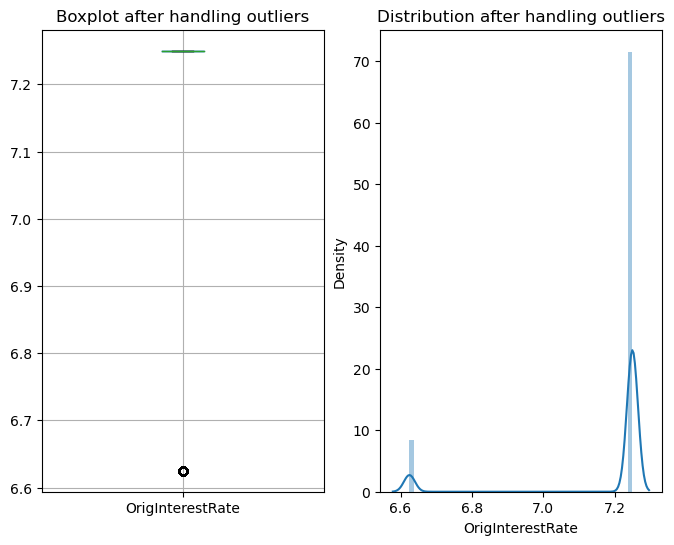

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


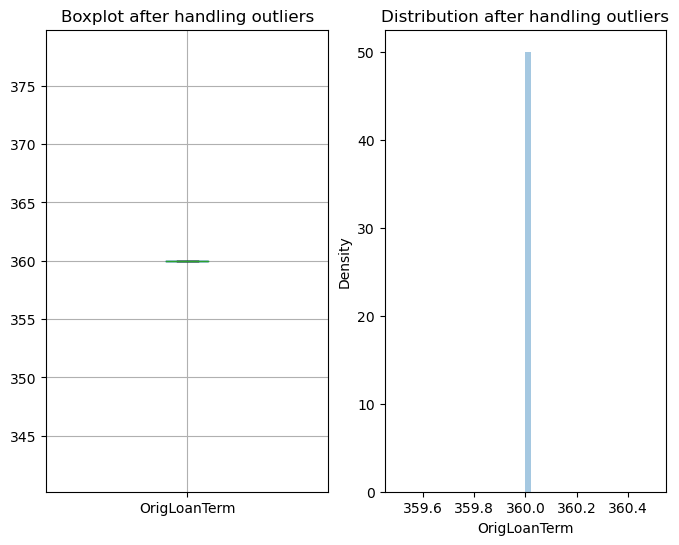

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


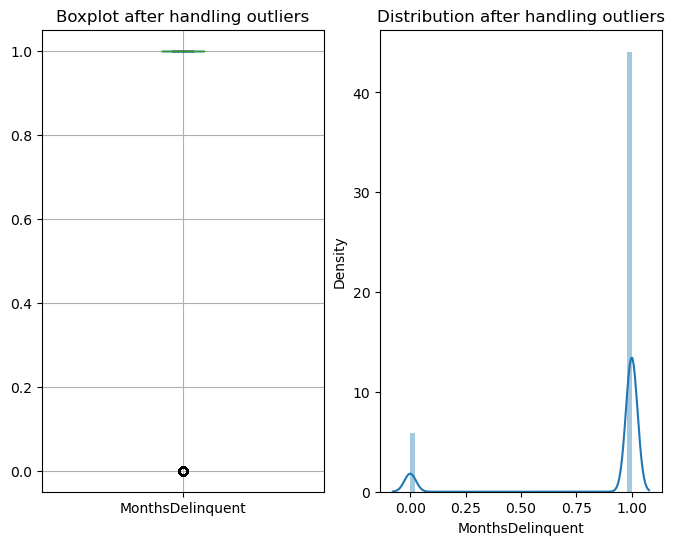

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


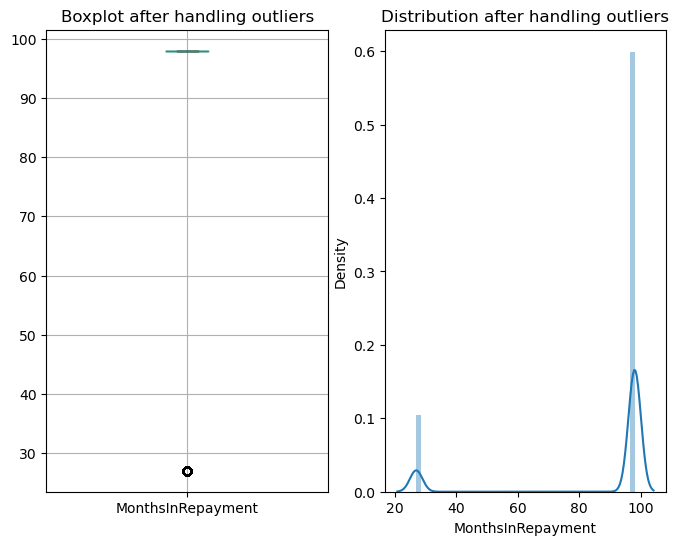

In [70]:
variables=['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm',
          'MonthsDelinquent','MonthsInRepayment']

for variable in variables:
    distribution_plot(df,variable)

### Observations:
We can see that after capping outliers, the original distribution of the variables is preserved.

In some variables the outliers are removed while in other the outliers are capped to store relevant information

### Categorical Encoding

In [71]:
for var in ['Occupancy','Channel','PPM','LoanPurpose','NumBorrowers','FirstTimeHomebuyer']:
    ordinal_mapping={k:i for i,k in enumerate(df[var].unique(),0)} ## Assigning labels starting from 0
    df[var]=df[var].map(ordinal_mapping) ## Encoding the variables with the labels assigned through the loop written above

In [72]:
for var in ['PostalCode','ServicerName','MSA']:
    frequency_map=(df[var].value_counts()/len(df)).to_dict() ## Calculating the frequency of the variables and convert them into
    ## a dictionary
    df[var]=df[var].map(frequency_map) ## Encoding with the frequency of the variables through loop

In [73]:
for variable in ['PropertyState','PropertyType']:
    count_map=df[variable].value_counts().to_dict() ## Calculating the number of observations present in each feature
    df[variable]=df[variable].map(count_map) ## Encoding the variables with the count of their observations

In [74]:
df.drop(['SellerName','ProductType','LoanSeqNum'],axis=1,inplace=True) ## Dropping the irrelevant features

In [75]:
df.head()

,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PropertyState,PropertyType,PostalCode,LoanPurpose,OrigLoanTerm,NumBorrowers,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,766.0,199905.0,0,202904.0,0.030094,25,1,0,93.0,27,...,13621,244923,0.003798,0,360.0,0,0.077632,0,1.0,98.0
1,766.0,199905.0,0,202904.0,0.018991,0,1,0,93.0,17,...,10127,244923,0.004203,1,360.0,1,0.018525,0,1.0,27.0
2,766.0,199905.0,0,202904.0,0.000261,0,1,0,93.0,16,...,2321,244923,0.000968,1,360.0,0,0.077632,0,1.0,98.0
3,766.0,199905.0,0,202904.0,0.032040,0,1,0,93.0,14,...,43327,244923,0.001644,1,360.0,0,0.039664,0,1.0,98.0
4,766.0,199905.0,0,202904.0,0.014253,0,1,0,93.0,18,...,7457,244923,0.000947,1,360.0,0,0.039664,0,1.0,98.0


In [76]:
for var in ['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigLoanTerm','MonthsInRepayment']:
    df[var]=df[var].round(1).astype(int) ## rounding off the values to 1 decimal point to simplify the process

In [77]:
df['FirstPaymentDate']=df['FirstPaymentDate'].astype(str) ## converting the feature into string
df['FirstPaymentDate']=pd.to_datetime(df['FirstPaymentDate'],format="%Y%m") ## converting to appropriate date-time format 
## using year and month

In [78]:
df['MaturityDate']=df['MaturityDate'].astype(str)
df['MaturityDate']=pd.to_datetime(df['MaturityDate'],format="%Y%m")

In [79]:
df.head()

,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PropertyState,PropertyType,PostalCode,LoanPurpose,OrigLoanTerm,NumBorrowers,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,766,1999-05-01,0,2029-04-01,0.030094,25,1,0,93,27,...,13621,244923,0.003798,0,360,0,0.077632,0,1.0,98
1,766,1999-05-01,0,2029-04-01,0.018991,0,1,0,93,17,...,10127,244923,0.004203,1,360,1,0.018525,0,1.0,27
2,766,1999-05-01,0,2029-04-01,0.000261,0,1,0,93,16,...,2321,244923,0.000968,1,360,0,0.077632,0,1.0,98
3,766,1999-05-01,0,2029-04-01,0.032040,0,1,0,93,14,...,43327,244923,0.001644,1,360,0,0.039664,0,1.0,98
4,766,1999-05-01,0,2029-04-01,0.014253,0,1,0,93,18,...,7457,244923,0.000947,1,360,0,0.039664,0,1.0,98


In [80]:
df['FirstPaymentYear']=df['FirstPaymentDate'].dt.year ## extracting year from firstpaymentdate
df['FirstPaymentMonth']=df['FirstPaymentDate'].dt.month ## extracting month from firstpaymentdate
df['MaturityYear']=df['MaturityDate'].dt.year ## extracting year from maturitydate
df['MaturityMonth']=df['MaturityDate'].dt.month ## extracting month from maturitydate

In [81]:
df.head()

,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,OrigLoanTerm,NumBorrowers,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment,FirstPaymentYear,FirstPaymentMonth,MaturityYear,MaturityMonth
0,766,1999-05-01,0,2029-04-01,0.030094,25,1,0,93,27,...,360,0,0.077632,0,1.0,98,1999,5,2029,4
1,766,1999-05-01,0,2029-04-01,0.018991,0,1,0,93,17,...,360,1,0.018525,0,1.0,27,1999,5,2029,4
2,766,1999-05-01,0,2029-04-01,0.000261,0,1,0,93,16,...,360,0,0.077632,0,1.0,98,1999,5,2029,4
3,766,1999-05-01,0,2029-04-01,0.032040,0,1,0,93,14,...,360,0,0.039664,0,1.0,98,1999,5,2029,4
4,766,1999-05-01,0,2029-04-01,0.014253,0,1,0,93,18,...,360,0,0.039664,0,1.0,98,1999,5,2029,4


In [82]:
df.drop(['FirstPaymentDate','MaturityDate'],axis=1,inplace=True) ## dropping the firstpaymentdate and maturitydate

### Feature Transformation

In [83]:
## Function is to check the normality of the variables
import scipy.stats as stats
def transformation_plot(df,variable):
    plt.figure(figsize=(6,6)) ## figure size= 6,6
    
    plt.subplot(1,2,1) ## 1  row, 2 columns and 1st chart
    df[variable].hist(bins=30)
    plt.title('Histogram of {}'.format(variable))
    
    plt.subplot(1,2,2) ## 1 row, 2 columns and 2nd chart
    stats.probplot(df[variable],dist='norm',plot=plt) ## distribution is normal and plotting is matplotlib
    plt.title('Q-Q Plot of {}'.format(variable))
    
    plt.show() ## Function to plot the histogram and q-q plot after handling outliers

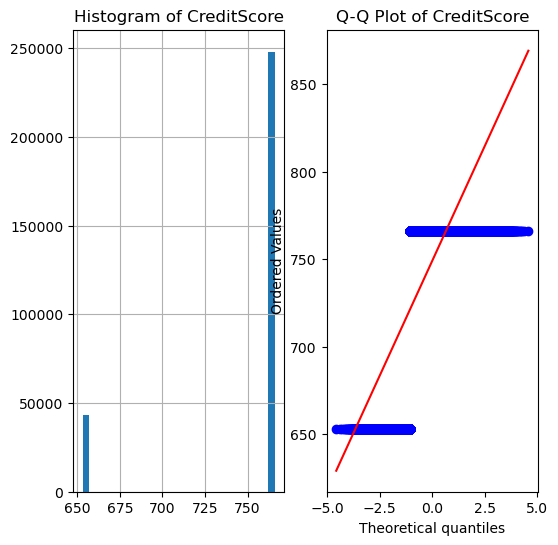

In [84]:
transformation_plot(df,'CreditScore')

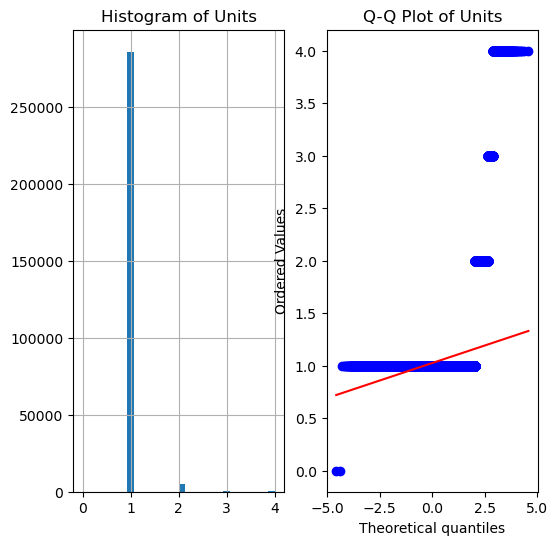

In [85]:
transformation_plot(df,'Units')

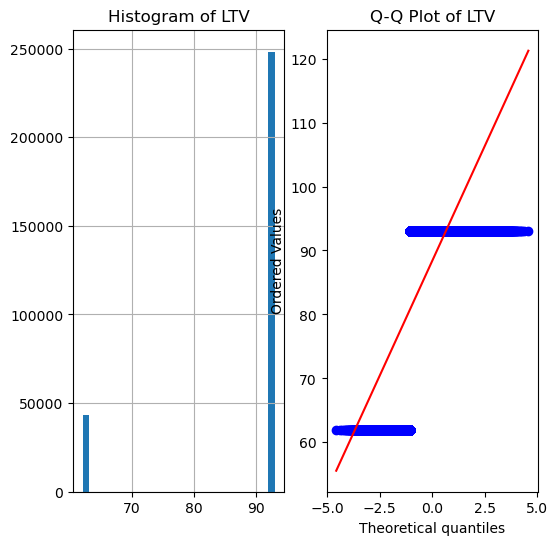

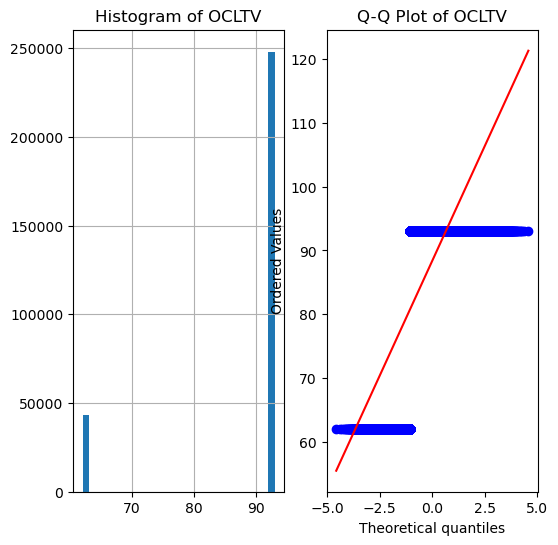

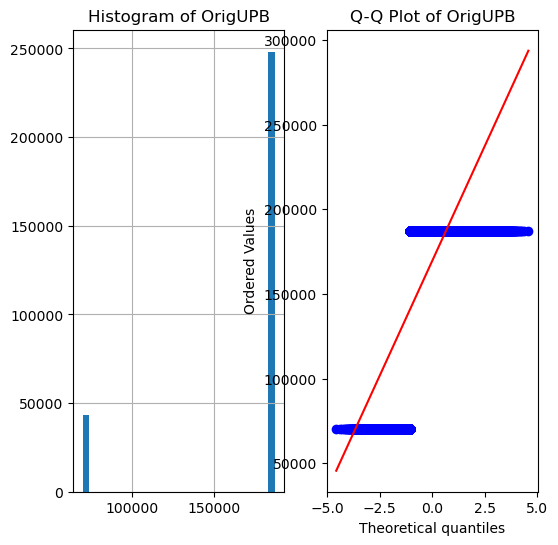

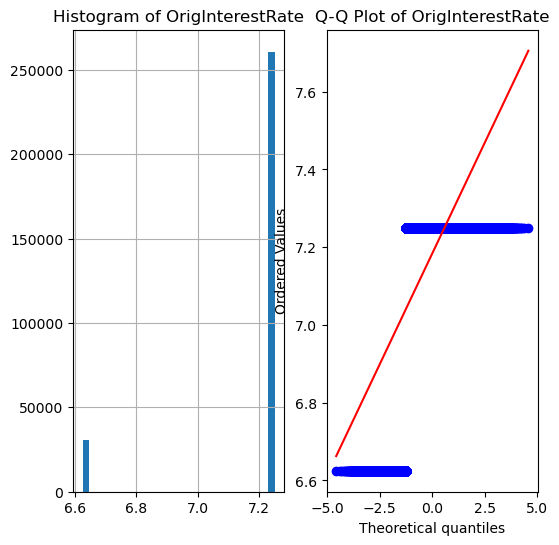

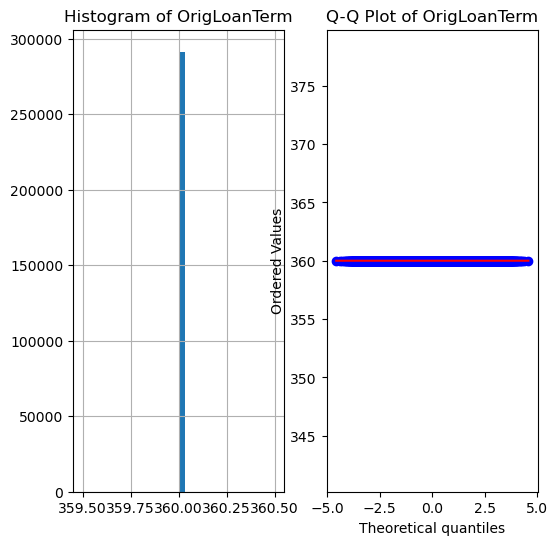

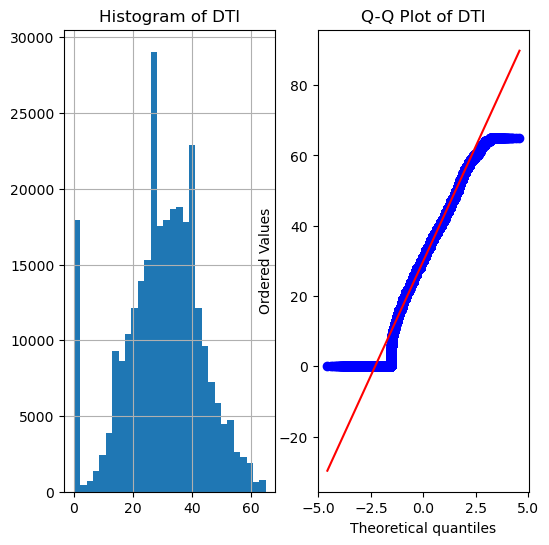

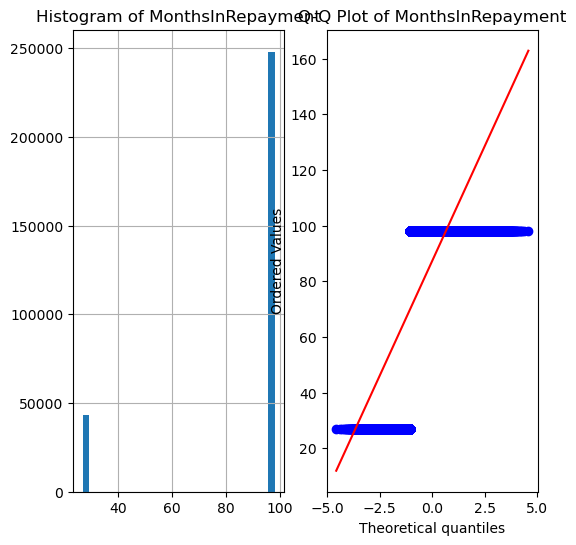

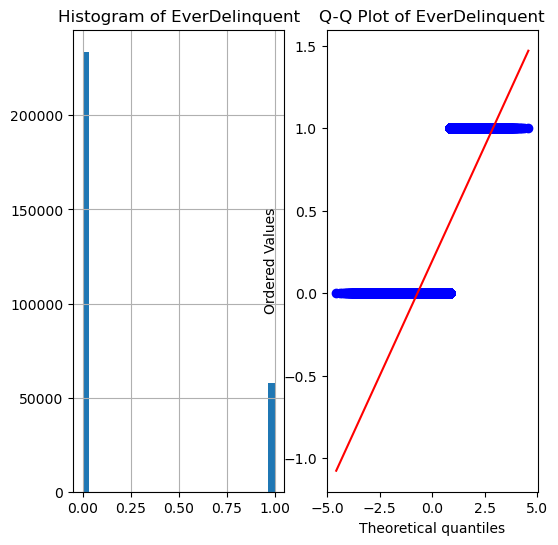

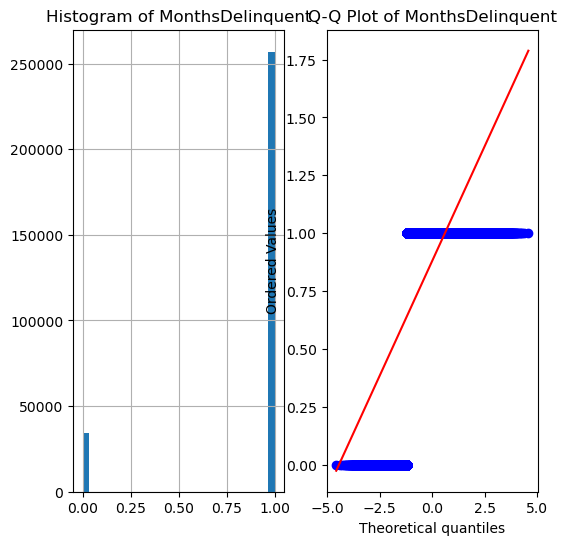

In [86]:
for variable in ['LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm','DTI','MonthsInRepayment','EverDelinquent',
           'MonthsDelinquent']:
    transformation_plot(df,variable)

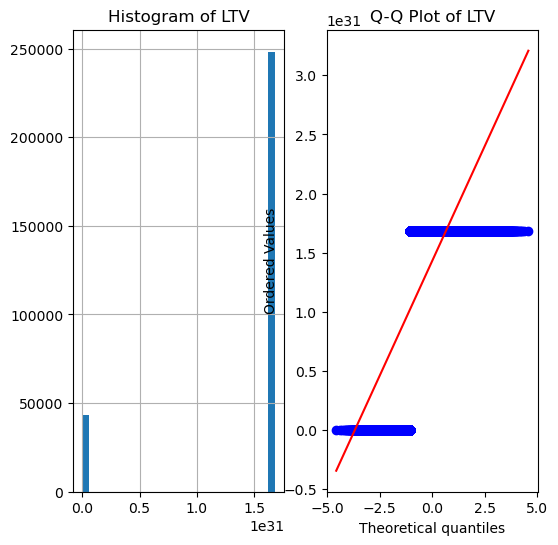

In [87]:
df['LTV'],param=stats.boxcox(df['LTV']) ## box-cox transformation with the parameter
transformation_plot(df,'LTV')

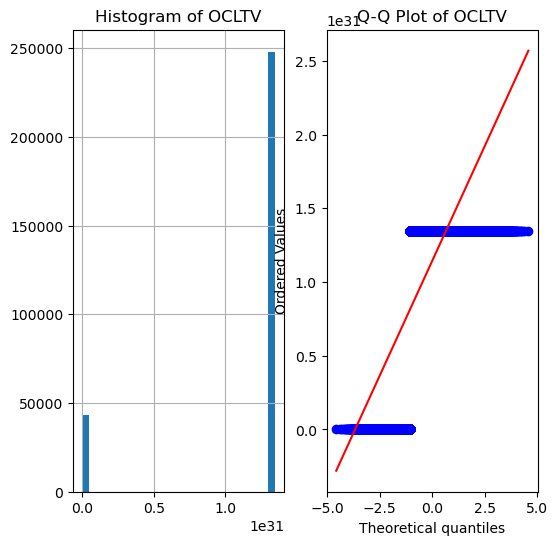

In [88]:
df['OCLTV'],param=stats.boxcox(df['OCLTV'])
transformation_plot(df,'OCLTV')

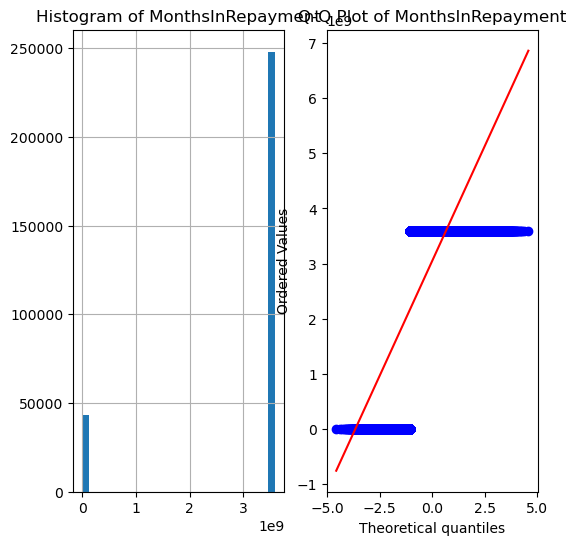

In [89]:
df['MonthsInRepayment'],param=stats.boxcox(df['MonthsInRepayment'])
transformation_plot(df,'MonthsInRepayment')

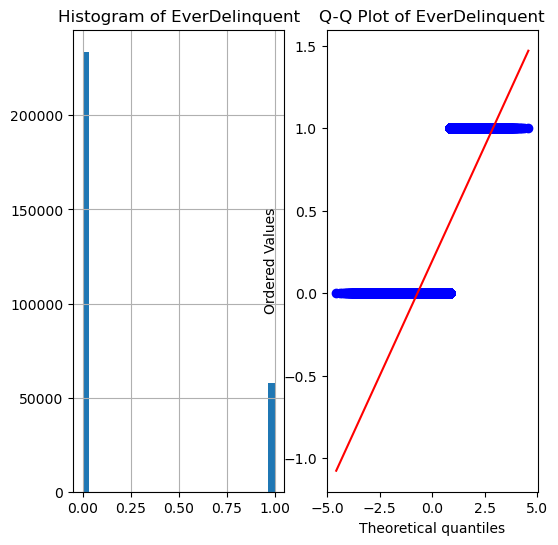

In [90]:
df['EverDelinquent']=np.sqrt(df['EverDelinquent'])
transformation_plot(df,'EverDelinquent')

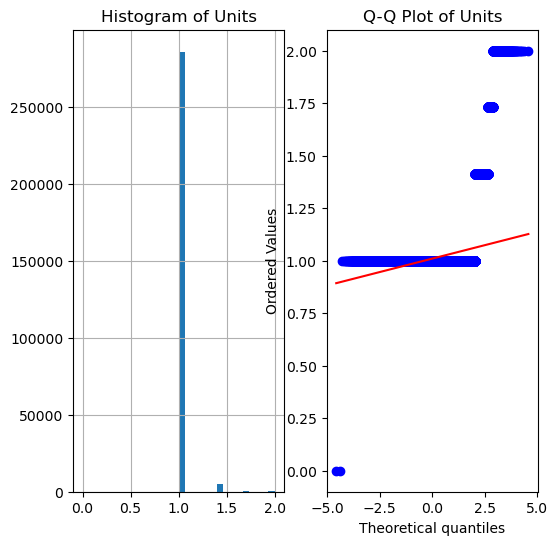

In [91]:
df['Units']=np.sqrt(df['Units'])
transformation_plot(df,'Units')

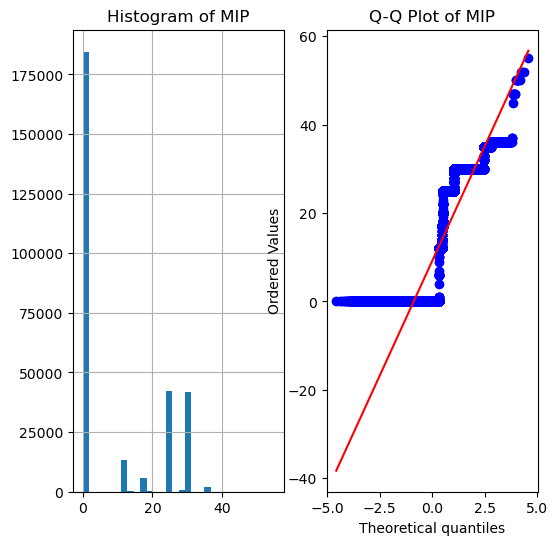

In [92]:
transformation_plot(df,'MIP')

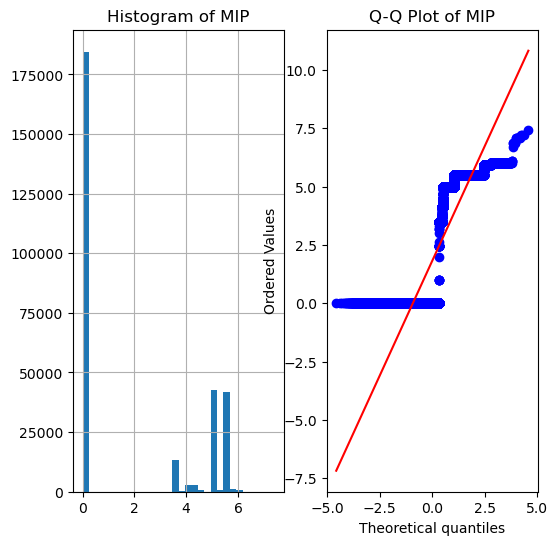

In [93]:
df['MIP']=np.sqrt(df['MIP'])
transformation_plot(df,'MIP')

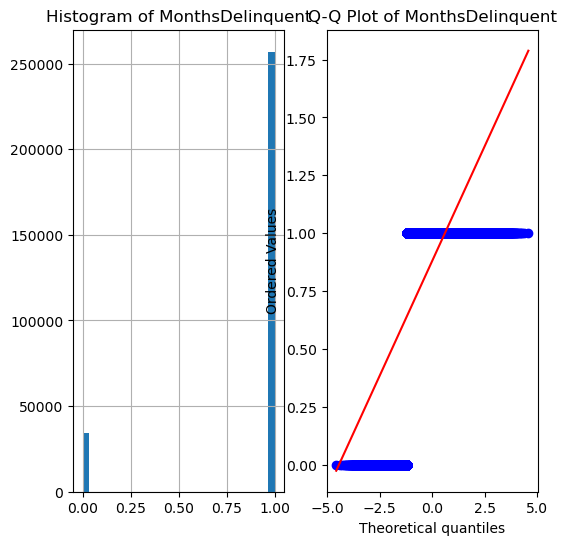

In [94]:
transformation_plot(df,'MonthsDelinquent')

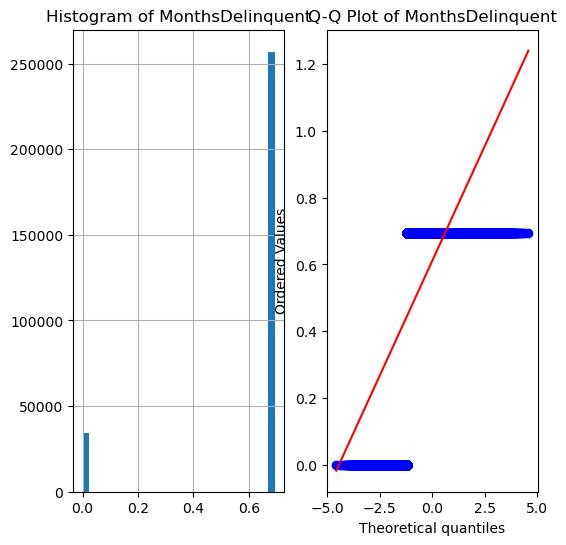

In [95]:
df['MonthsDelinquent']=np.log(df['MonthsDelinquent']+1)
transformation_plot(df,'MonthsDelinquent')

### Observations:
We have transformed some variables into normal distribution using various techniques such as box-cox transformation, square root trnasformation and logarithmic transformation. We can see that the after transformation the distribution is distributed around mean

### Feature Scaling

In [96]:
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler

X=df.drop('EverDelinquent',axis=1) ## independent variables
y=df['EverDelinquent'] ## dependent variable

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0) ## 20% data is for test and 80% goes to
## training
X_train.shape,X_test.shape

((233160, 26), (58291, 26))

In [97]:
scaler=StandardScaler() ## object for standardscaler
X_train=scaler.fit_transform(X_train) ## fitting the standardscaler object in train set
X_test=scaler.transform(X_test) ## fitting the scaler object in test set

### Feature Selection

### Principal Component Analysis to find the optimum number of components that explain maximum amount of variance in the data

In [98]:
from sklearn.decomposition import PCA
pca=PCA(n_components=10) ## top 10 features that has most of the information

In [99]:
## fitting our data into the dimensional space 
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [100]:
pca.explained_variance_
## Eigenvalues( Information explained by each eigenvalue in the original dataset)

array([2.8855637 , 1.91879802, 1.6118321 , 1.3162989 , 1.2630382 ,
       1.22055558, 1.18500908, 1.02592144, 1.01085821, 0.96737252])

In [101]:
pca.components_
## Eigenvectors

array([[ 1.09779741e-01,  1.38777878e-17, -1.32189014e-02,
         4.66298317e-01, -4.54130630e-02, -4.52933232e-02,
        -5.44313284e-01,  9.21592178e-02,  5.50155847e-02,
        -5.44280391e-01, -7.16737978e-02,  4.83655431e-02,
         1.79814070e-03, -8.75438884e-02, -5.54946620e-02,
        -6.60178624e-02, -3.58531724e-01,  0.00000000e+00,
         4.34668145e-02, -5.48816975e-03, -4.94318339e-02,
         6.57822647e-02,  0.00000000e+00,  3.50253144e-02,
         0.00000000e+00,  3.38227597e-02],
       [ 7.30015876e-03,  2.22044605e-16,  7.10663643e-02,
         8.65889067e-03,  1.28186119e-02,  1.95959276e-02,
        -7.72432459e-03,  4.00805947e-02,  4.79992007e-03,
        -7.79421525e-03, -1.31905312e-01,  1.01893579e-01,
         2.31192539e-02, -2.33427085e-02,  1.50924140e-02,
        -6.77720735e-02, -3.55664862e-02,  0.00000000e+00,
        -2.10984257e-02,  1.08669988e-01,  5.24913725e-03,
         2.13718403e-02,  0.00000000e+00, -6.89073806e-01,
         0.00

In [102]:
pca.explained_variance_ratio_ ## percentage of information explained by each component in the data

array([0.13116142, 0.08721772, 0.07326478, 0.05983151, 0.05741058,
       0.05547956, 0.05386382, 0.04663259, 0.0459479 , 0.04397129])

In [103]:
## Visualize PCA in 2-d
pca=PCA(n_components=2) ## top 2 features that have maximum information
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [104]:
pca.explained_variance_

array([2.88556367, 1.91879598])

In [105]:
pca.components_

array([[ 1.09770906e-01, -3.46944695e-18, -1.32472044e-02,
         4.66296991e-01, -4.53889681e-02, -4.53044103e-02,
        -5.44309451e-01,  9.21511839e-02,  5.49813829e-02,
        -5.44276562e-01, -7.16869125e-02,  4.83791254e-02,
         1.77735215e-03, -8.75645671e-02, -5.54996028e-02,
        -6.60346476e-02, -3.58541079e-01,  0.00000000e+00,
         4.34822626e-02, -5.48012708e-03, -4.94267831e-02,
         6.57822164e-02,  0.00000000e+00,  3.50265366e-02,
         0.00000000e+00,  3.38249240e-02],
       [ 7.33029926e-03, -0.00000000e+00,  7.13904512e-02,
         8.70196725e-03,  1.24828261e-02,  1.97475054e-02,
        -7.71528986e-03,  4.00154069e-02,  5.05195419e-03,
        -7.78531481e-03, -1.31752452e-01,  1.01915726e-01,
         2.34253256e-02, -2.31796348e-02,  1.52165964e-02,
        -6.75767971e-02, -3.55199791e-02, -0.00000000e+00,
        -2.12284065e-02,  1.08436634e-01,  4.82970706e-03,
         2.16636524e-02, -0.00000000e+00, -6.89088618e-01,
        -0.00

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Second Component')

C:\Users\prath\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


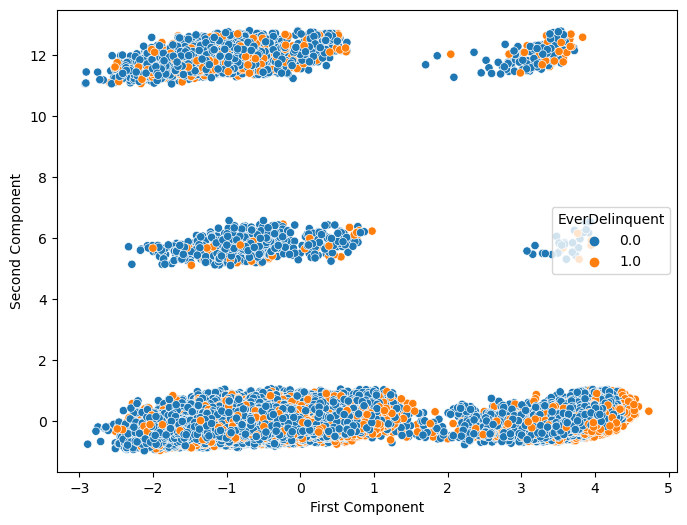

In [106]:
plt.figure(figsize=(8,6))
sns.scatterplot(X_train_trf[:,0],X_train_trf[:,1],hue=y_train)
plt.xlabel('First Component')
plt.ylabel('Second Component')

### Observations:
We are not getting a clear visualization with 2 components because many points are getting overlapped

In [107]:
## Finding the optimum number of components
pca=PCA(n_components=None) ## Principal components equal to the number of variables in the data
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [108]:
pca.explained_variance_.shape

(26,)

In [109]:
pca.components_.shape ## 27 vectors in 27 dimensional space

(26, 26)

In [110]:
pca.explained_variance_ratio_

array([1.31161424e-01, 8.72177178e-02, 7.32647814e-02, 5.98315118e-02,
       5.74105809e-02, 5.54795614e-02, 5.38638185e-02, 4.66325963e-02,
       4.59479037e-02, 4.39712904e-02, 4.12938529e-02, 4.01198906e-02,
       3.94437690e-02, 3.75738750e-02, 3.49194306e-02, 3.39408004e-02,
       3.32092342e-02, 2.95434152e-02, 2.91893406e-02, 2.06631523e-02,
       5.24357911e-03, 7.84738041e-05, 2.96034424e-33, 7.79567954e-34,
       7.79567954e-34, 7.79567954e-34])

In [111]:
np.cumsum(pca.explained_variance_ratio_) ## cumulative percentages of eigenvectors

array([0.13116142, 0.21837914, 0.29164392, 0.35147543, 0.40888602,
       0.46436558, 0.5182294 , 0.56486199, 0.6108099 , 0.65478119,
       0.69607504, 0.73619493, 0.7756387 , 0.81321257, 0.848132  ,
       0.8820728 , 0.91528204, 0.94482545, 0.97401479, 0.99467795,
       0.99992153, 1.        , 1.        , 1.        , 1.        ,
       1.        ])

Text(0, 0.5, '% of variance explained')

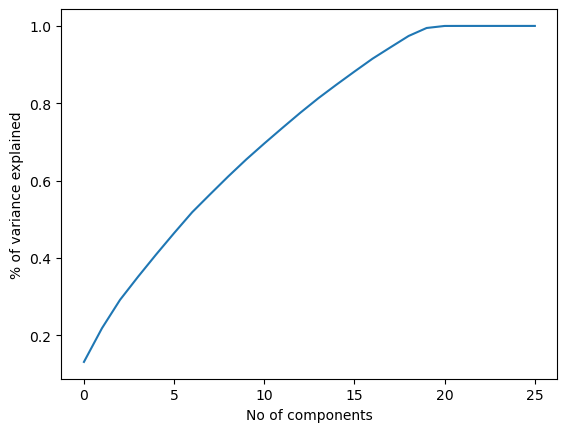

In [112]:
plt.plot(np.cumsum(pca.explained_variance_ratio_)) ## plotting the cumulative distribution function
plt.xlabel('No of components')
plt.ylabel('% of variance explained')

### Observations:
We infer that to explain 90% of the explained variance in the data,the optimum number of principal components is 15

### SelectKBest algorithm for feature selection

In [113]:
from sklearn.feature_selection import SelectKBest ## Selectkbest algorithm for feature selection
from sklearn.feature_selection import f_classif ## F-score

In [114]:
ordered_rank_features=SelectKBest(score_func=f_classif,k=20) ## This will give the top 15 features according to their F-score
ordered_feature=ordered_rank_features.fit(X,y) ## Fitting the algorithm to the dataset. Higher the F-score, more relevant
## is the feature with the target

C:\Users\prath\anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [ 1 17] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\prath\anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


In [115]:
ordered_feature.scores_ ## p-values corresponding to each F-score. Lower the p-value, more relevant the feature is with the
## target

array([ 4.13482800e+03,             nan,  1.44284263e+02,  1.12841258e+03,
        3.43515667e+01,  9.28418315e+00,  3.03368776e+02,  1.12863054e+03,
        4.44657439e+02,  3.05342158e+02,  7.79444405e+02,  1.50731189e+02,
        4.41601389e+01,  4.09147347e+02,  2.65499372e+02,  5.26881050e+02,
        1.37182588e+02,             nan,  1.47871719e+03,  2.74514068e+02,
        3.48262088e+05,  9.52421394e+03, -2.91449000e+05,  7.36917098e+01,
       -2.91449000e+05,  3.09711886e+01])

In [116]:
datascores=pd.DataFrame(ordered_feature.scores_) ## converting the F-scores numpy array to a dataframe
datacolumns=pd.DataFrame(X.columns) ## Converting the independent features array to a dataframe

In [117]:
features_rank=pd.concat([datacolumns,datascores],axis=1) ## merging the two dataframes
features_rank.columns=['Features','Scores'] ## naming the columns
features_rank

,Features,Scores
0,CreditScore,4134.828000
1,FirstTimeHomebuyer,NaN
2,MSA,144.284263
3,MIP,1128.412582
4,Units,34.351567
5,Occupancy,9.284183
6,OCLTV,303.368776
7,DTI,1128.630544
8,OrigUPB,444.657439
9,LTV,305.342158


In [118]:
features_rank.nlargest(20,'Scores') ## We need only 20features to explain the maximum amount of variance in the data

,Features,Scores
20,MonthsDelinquent,348262.088188
21,MonthsInRepayment,9524.213937
0,CreditScore,4134.828000
18,NumBorrowers,1478.717191
7,DTI,1128.630544
3,MIP,1128.412582
10,OrigInterestRate,779.444405
15,PostalCode,526.881050
8,OrigUPB,444.657439
13,PropertyState,409.147347


### Observations:
We get the top 20 features which are required to explain the maximum amount of information in the data. This was achieved through principal component analysis. With this we can remove the other features which are not relevant with the target variable EverDelinquent in our further analysis

### Correlation Analysis to find the best features

In [119]:
X=df.drop('EverDelinquent',axis=1) ## independent variables
y=df['EverDelinquent'] ## dependent variable

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0) ## 20% data is for test and 80% goes to
## training
X_train.shape,X_test.shape

((233160, 26), (58291, 26))

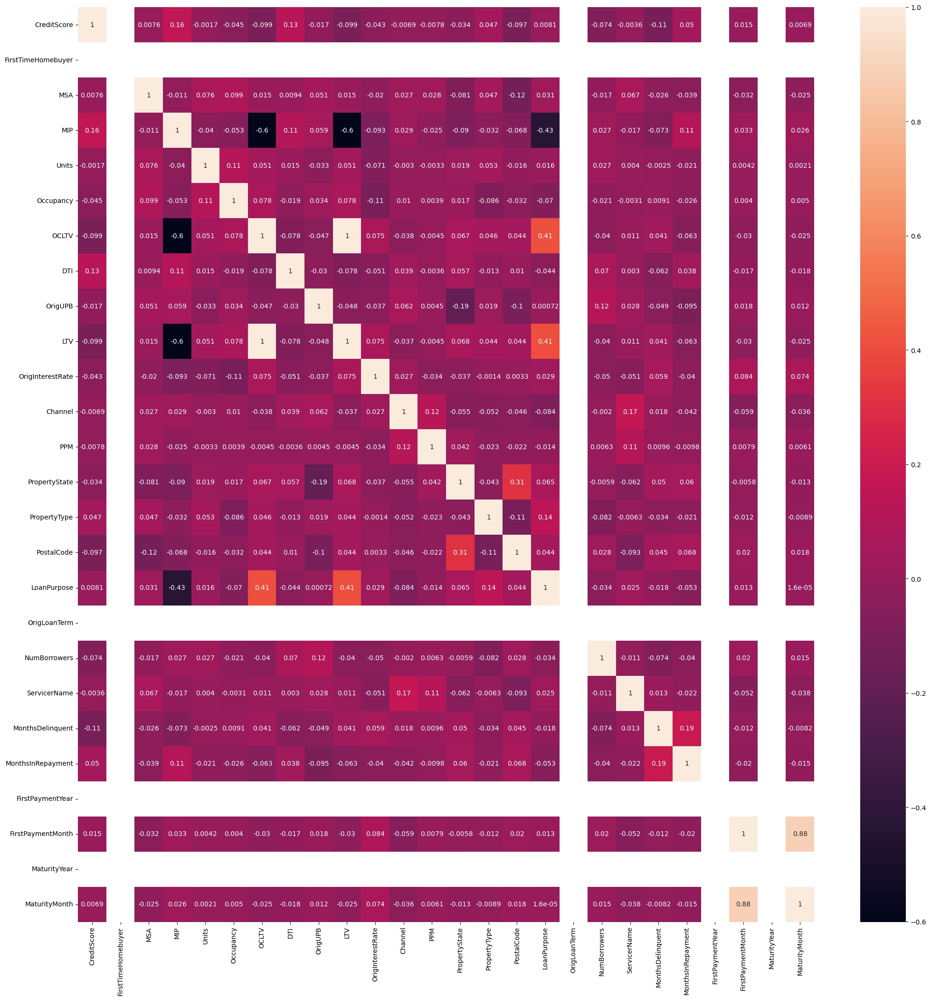

In [120]:
plt.figure(figsize=(25,25))
cor=X_train.corr()
sns.heatmap(cor,annot=True)
plt.show()

In [121]:
def correlation(data,threshold):
    corr_col=set()
    corr_matrix=data.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i,j])>threshold:
                colname=corr_matrix.columns[i]
                corr_col.add(colname)

    return corr_col

In [122]:
corr_features=correlation(X_train,0.8)
len(set(corr_features))

2

In [123]:
corr_features

{'LTV', 'MaturityMonth'}

### Mutual Information Gain for feature selection

In [124]:
from sklearn.feature_selection import mutual_info_classif

In [125]:
mutual_info=mutual_info_classif(X,y)

<AxesSubplot:>

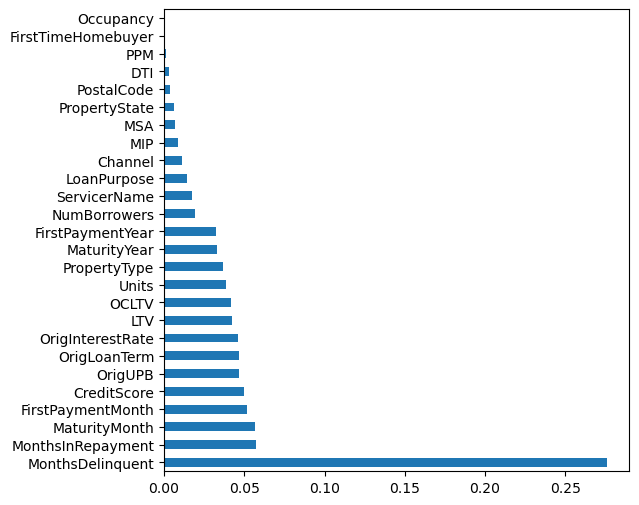

In [126]:
mutual_info=pd.Series(mutual_info,index=X.columns)
mutual_info.sort_values(ascending=False).plot(kind='barh',figsize=(6,6))

In [127]:
mutual_info.sort_values(ascending=False)

MonthsDelinquent      0.275926
MonthsInRepayment     0.057444
MaturityMonth         0.056833
FirstPaymentMonth     0.051916
CreditScore           0.050067
OrigUPB               0.046831
OrigLoanTerm          0.046628
OrigInterestRate      0.046351
LTV                   0.042167
OCLTV                 0.041515
Units                 0.038617
PropertyType          0.036469
MaturityYear          0.032783
FirstPaymentYear      0.032540
NumBorrowers          0.019162
ServicerName          0.017377
LoanPurpose           0.014268
Channel               0.011175
MIP                   0.008611
MSA                   0.006594
PropertyState         0.006021
PostalCode            0.003928
DTI                   0.003289
PPM                   0.000898
FirstTimeHomebuyer    0.000000
Occupancy             0.000000
dtype: float64

### Model building

In [128]:
X=df[['MonthsDelinquent','CreditScore','MaturityMonth','FirstPaymentMonth','OrigLoanTerm','OrigInterestRate',
     'OrigUPB','Units','PropertyType','MaturityYear','FirstPaymentYear','DTI','MIP']]
y=df['EverDelinquent']

In [129]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)
X_train.shape,X_test.shape

((204015, 13), (87436, 13))

### XGboost Classifier

In [130]:
from xgboost import XGBClassifier

In [131]:
xgb=XGBClassifier()
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [132]:
y_pred=xgb.predict(X_test)

In [133]:
from sklearn.metrics import accuracy_score,classification_report
score=accuracy_score(y_pred,y_test)
score

0.920707717644906

In [134]:
learning_rate=[0.05,0.1,0.2,0.001]
max_depth=[1,2,3,4]
min_child_weight=[10,20,50,100]
subsample=[0.1,0.3,0.5,0.7]
gamma=[0.0,0.1,0.2,0.3,0.4]
colsample_bytree=[0.3,0.5,0.4,0.7]

In [135]:
param_grid={'learning_rate':learning_rate,
           'max_depth':max_depth,
           'min_child_weight':min_child_weight,
           'subsample':subsample,
           'gamma':gamma,
           'colsample_bytree':colsample_bytree}

In [136]:
from sklearn.model_selection import RandomizedSearchCV

In [137]:
xgb_grid=RandomizedSearchCV(xgb,param_distributions=param_grid,n_iter=5,scoring='roc_auc',n_jobs=-1,cv=5,verbose=3)
xgb_grid.fit(X,y)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=None, ...),
                   n_iter=5, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.3, 0.5, 0.4,
                                                             0.7],
                                        'gamma': [0.0, 0.1, 0.2, 0.3, 0.4],
                                        'learning_rate': [0.05, 0.1, 0.2,
                                                          0.001],
                                        'max_depth': [1, 2, 3, 4],
                                        'min_child_weight': [10, 20, 50, 100],
                                        'subsample': [0.1, 0.3, 0.5, 0.7]},
                   scoring='roc_auc', verbose=3)

In [138]:
xgb_grid.best_params_

{'subsample': 0.5,
 'min_child_weight': 10,
 'max_depth': 4,
 'learning_rate': 0.05,
 'gamma': 0.3,
 'colsample_bytree': 0.3}

In [139]:
xgb_grid.fit(X_train,y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=None, ...),
                   n_iter=5, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.3, 0.5, 0.4,
                                                             0.7],
                                        'gamma': [0.0, 0.1, 0.2, 0.3, 0.4],
                                        'learning_rate': [0.05, 0.1, 0.2,
                                                          0.001],
                                        'max_depth': [1, 2, 3, 4],
                                        'min_child_weight': [10, 20, 50, 100],
                                        'subsample': [0.1, 0.3, 0.5, 0.7]},
                   scoring='roc_auc', verbose=3)

In [140]:
xgb=XGBClassifier(subsample=0.5,min_child_weight=20,max_depth=2,learning_rate=0.1,gamma=0.0,colsample_bytree=0.4)
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.4, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=20, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [141]:
y_pred=xgb.predict(X_test)

In [142]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(xgb,X,y,cv=10)

In [143]:
score

array([0.95560283, 0.95093498, 0.94187682, 0.9350832 , 0.92691714,
       0.91799623, 0.90962429, 0.89915938, 0.88780237, 0.88032253])

In [144]:
np.mean(score)

0.920531975972458

In [145]:
accuracy=accuracy_score(y_pred,y_test)
accuracy

0.9207305915183677

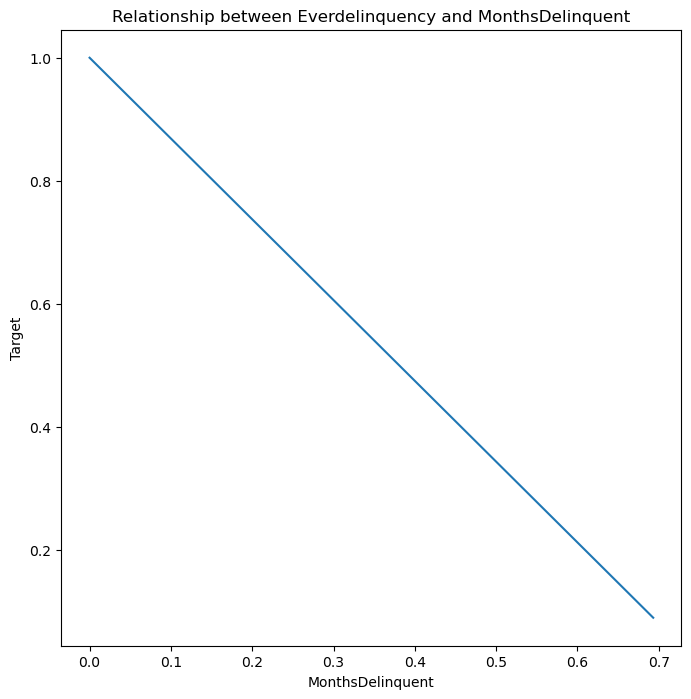

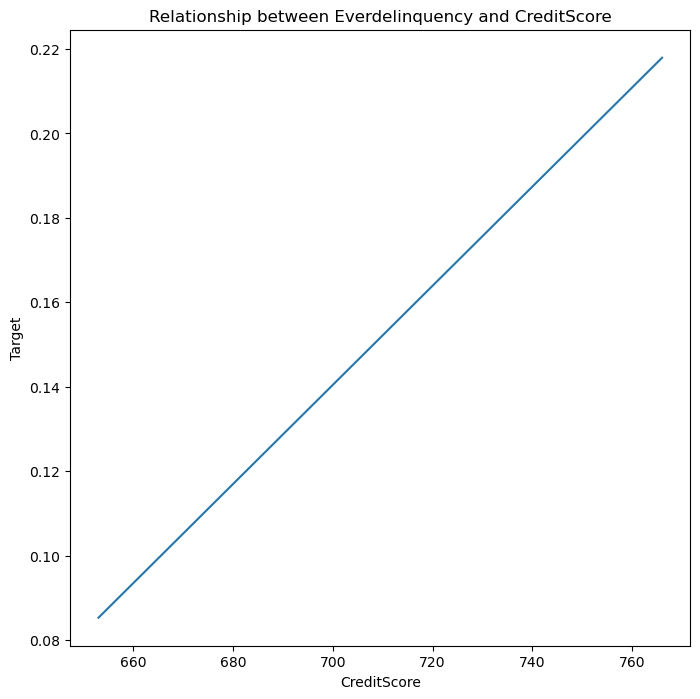

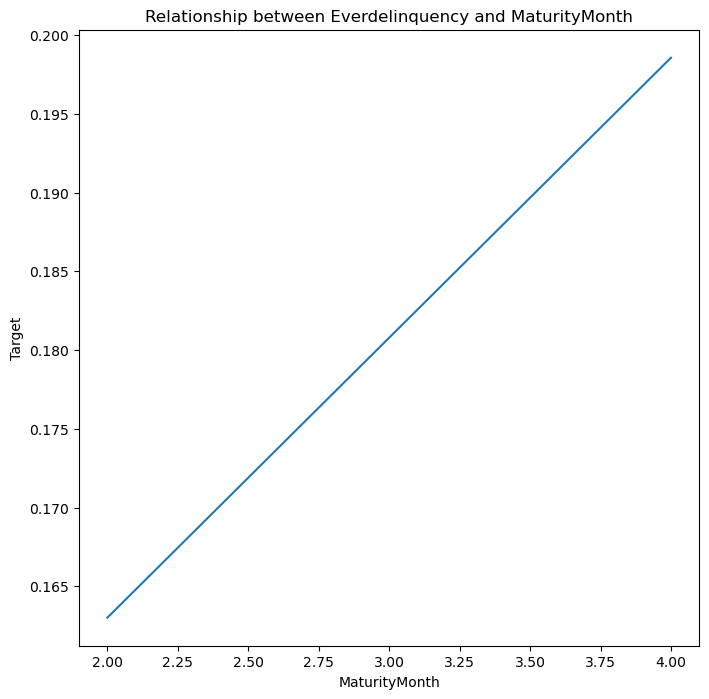

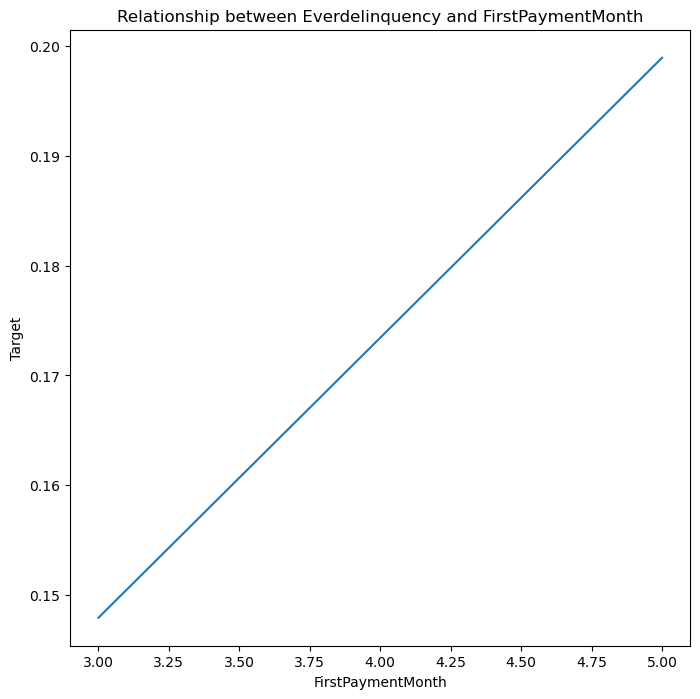

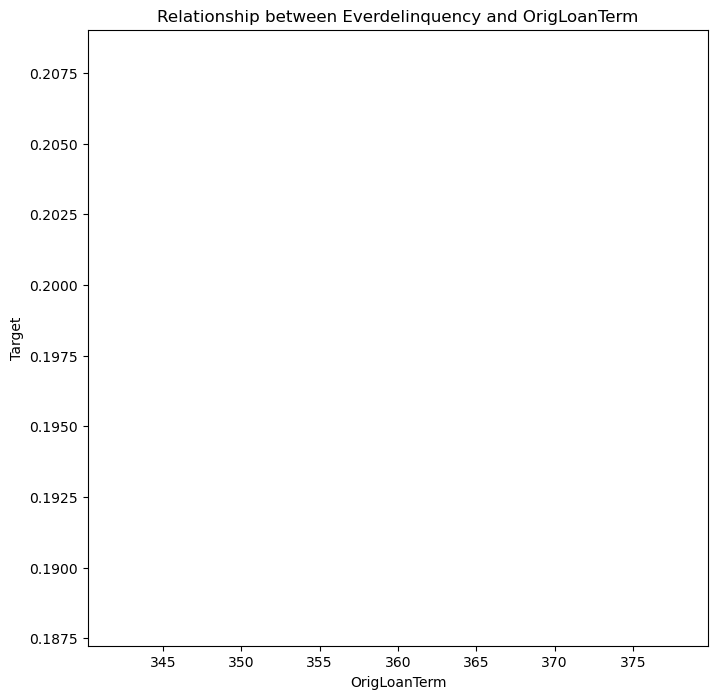

...

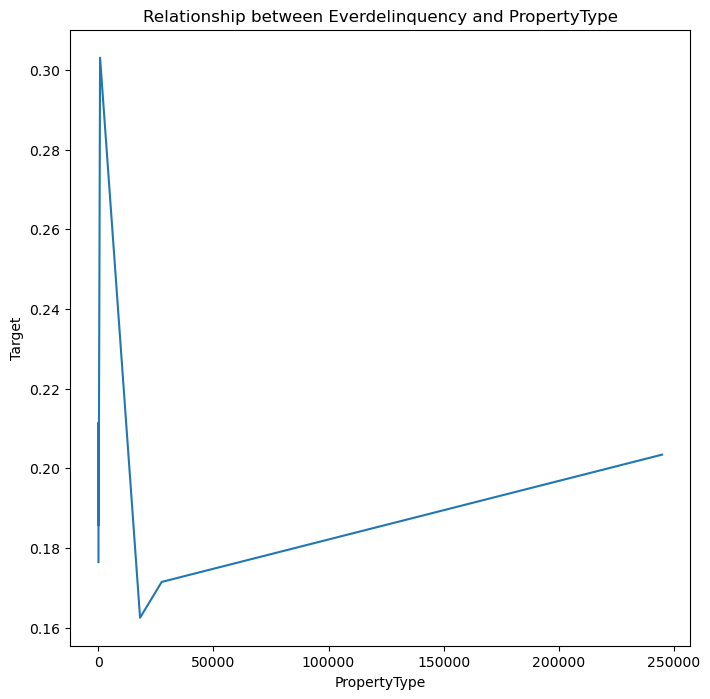

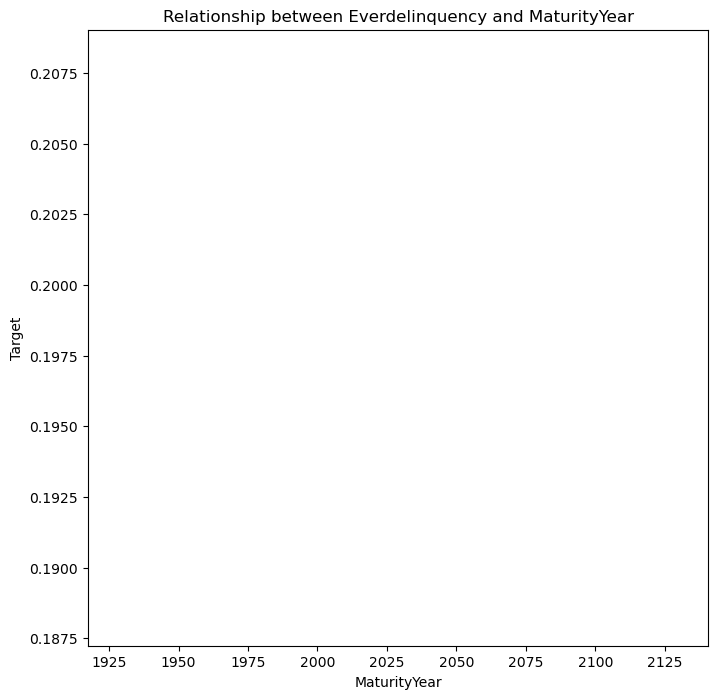

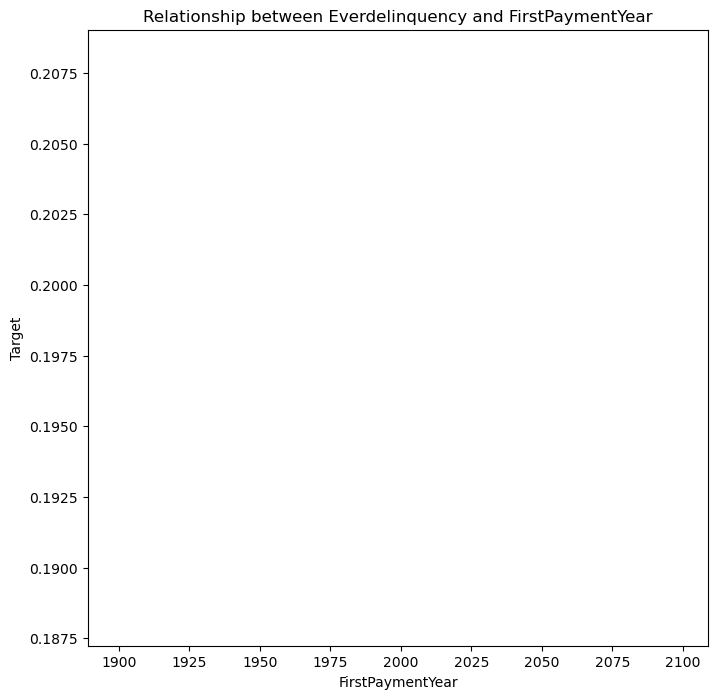

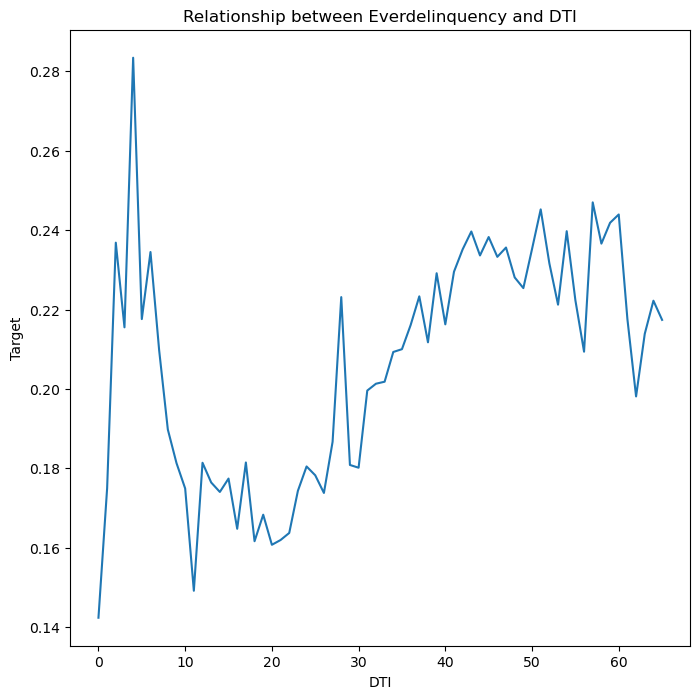

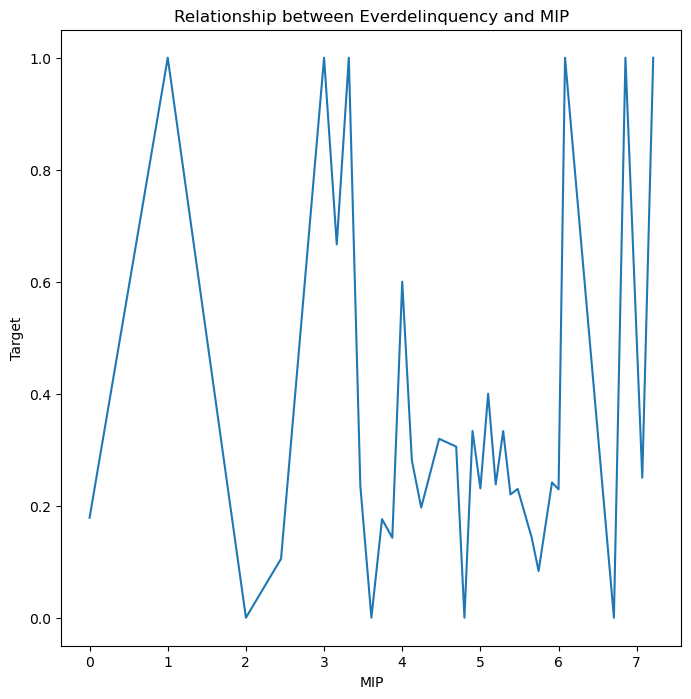

In [146]:
for var in ['MonthsDelinquent','CreditScore','MaturityMonth','FirstPaymentMonth','OrigLoanTerm','OrigInterestRate',
     'OrigUPB','Units','PropertyType','MaturityYear','FirstPaymentYear','DTI','MIP']:
    plt.figure(figsize=(8,8))
    fig=y_train.groupby(X_train[var]).mean().plot()
    fig.set_xlabel(var)
    fig.set_ylabel('Target')
    fig.set_title('Relationship between Everdelinquency and {}'.format(var))
    plt.show()

In [147]:
X=df.drop('EverDelinquent',axis=1)
y=df['EverDelinquent']

In [148]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0) ## 20% data is for test and 80% goes to
## training
X_train.shape,X_test.shape

((204015, 26), (87436, 26))

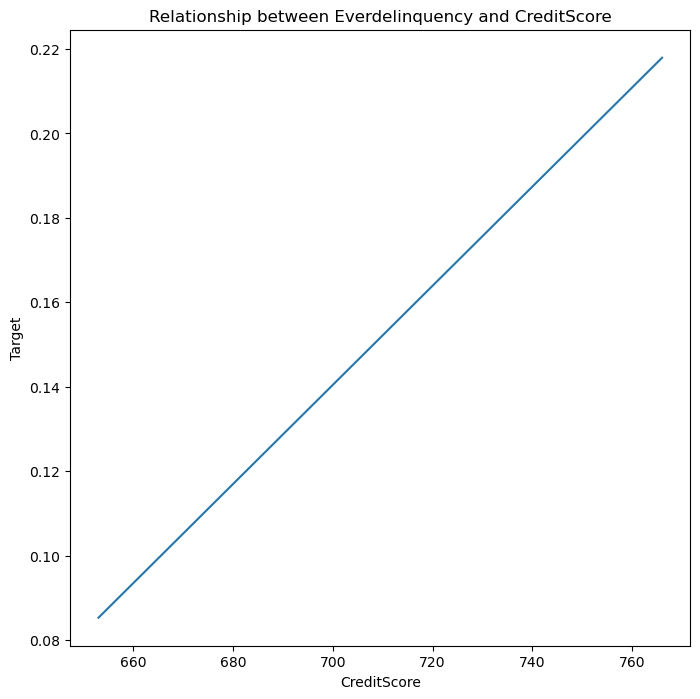

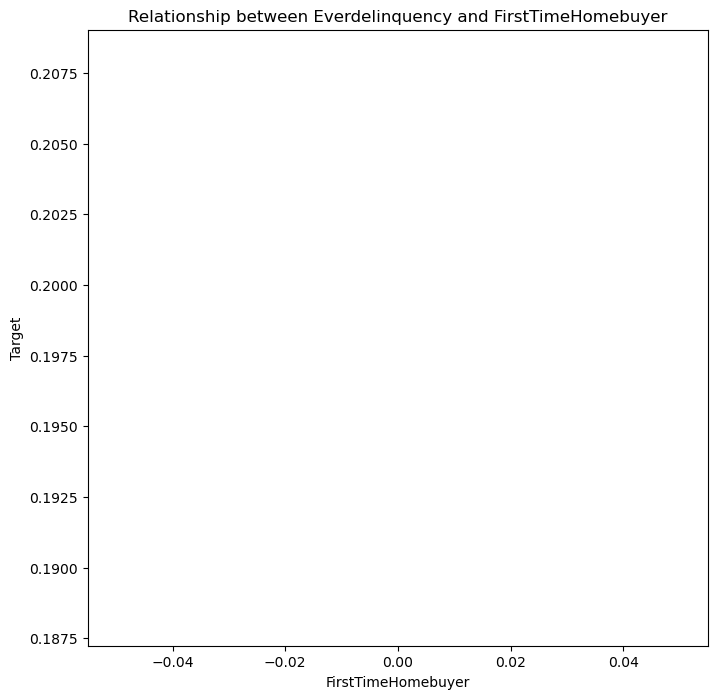

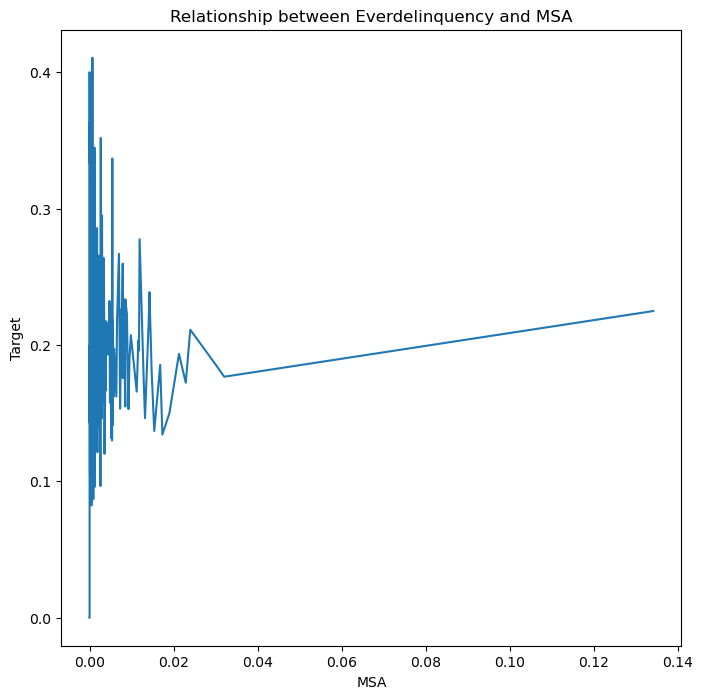

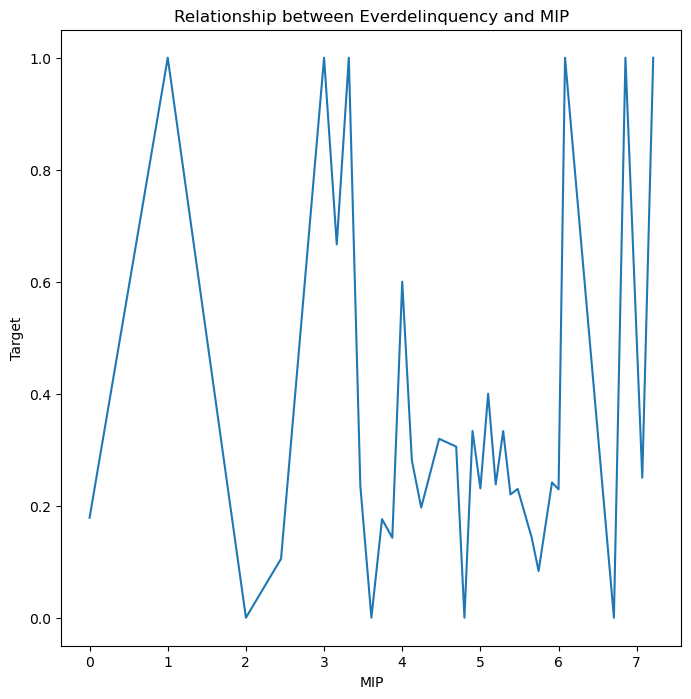

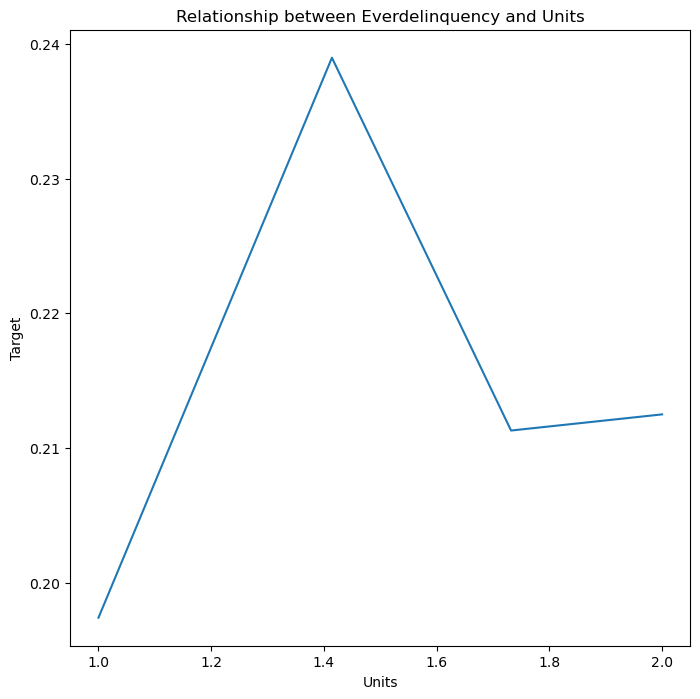

...

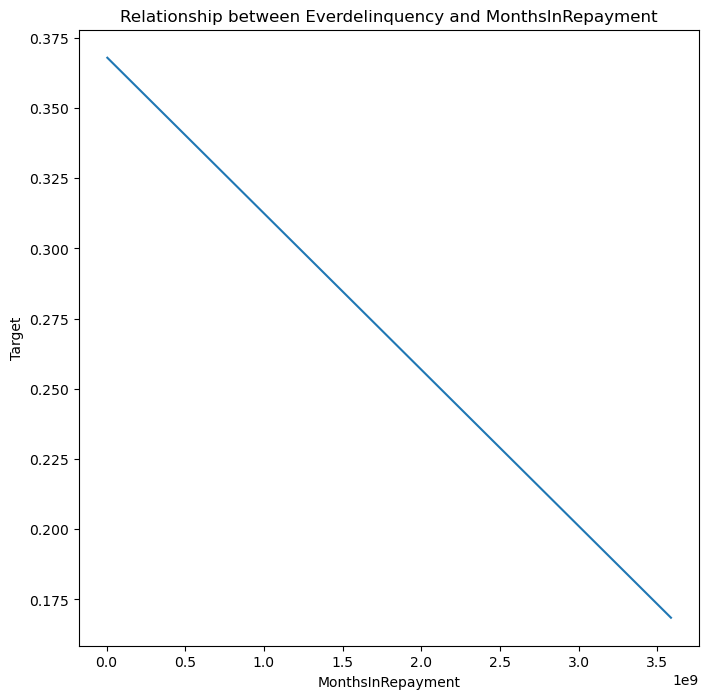

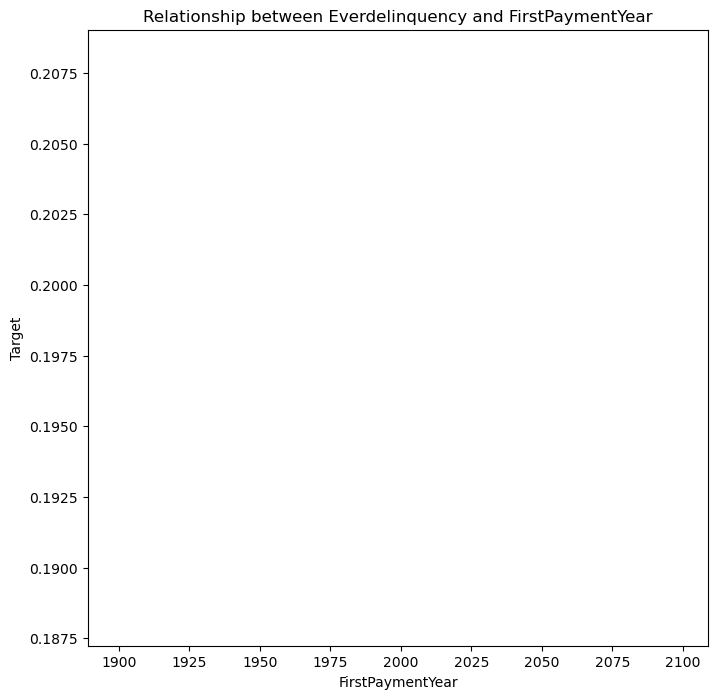

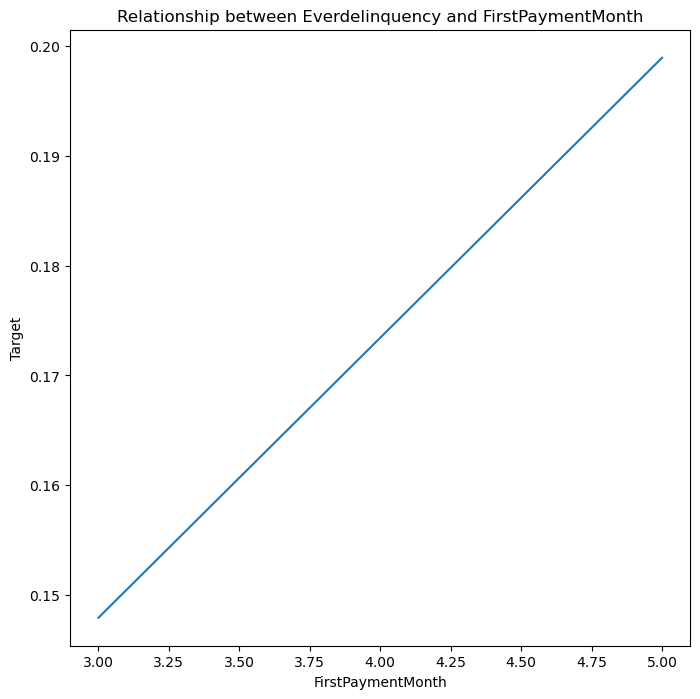

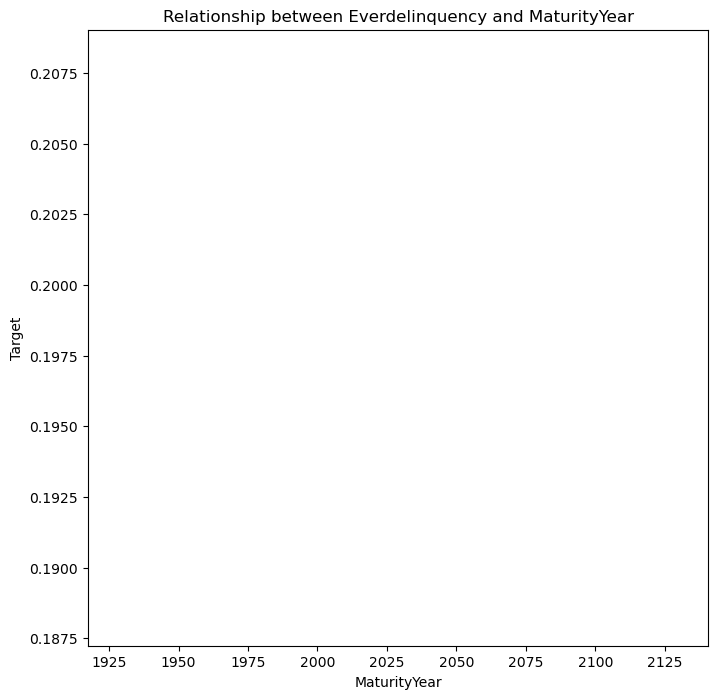

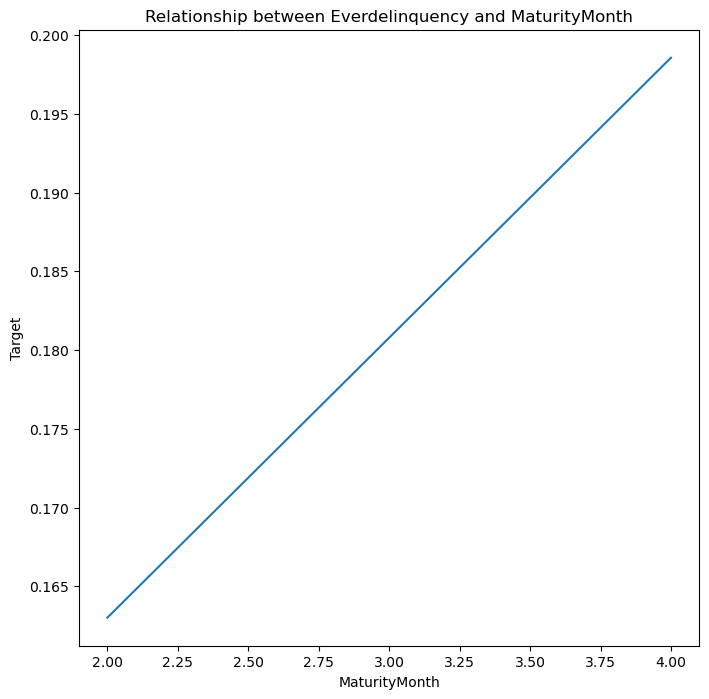

In [149]:
for var in X.columns:
    plt.figure(figsize=(8,8))
    fig=y_train.groupby(X_train[var]).mean().plot()
    fig.set_xlabel(var)
    fig.set_ylabel('Target')
    fig.set_title('Relationship between Everdelinquency and {}'.format(var))
    plt.show()

In [150]:
X=df[['CreditScore','MSA','MIP','Units','Occupancy','DTI','OrigInterestRate','OrigUPB',
     'Channel','PPM','PropertyState','PropertyType','PostalCode','LoanPurpose','NumBorrowers','ServicerName',
     'MonthsDelinquent','FirstPaymentYear','FirstPaymentMonth','MaturityMonth']]
y=df['EverDelinquent']

In [151]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0) ## 20% data is for test and 80% goes to
## training
X_train.shape,X_test.shape

((204015, 20), (87436, 20))

In [152]:
xgb=XGBClassifier()
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [153]:
y_pred=xgb.predict(X_test)

In [154]:
score=accuracy_score(y_pred,y_test)
score

0.920707717644906

In [155]:
xgb=XGBClassifier(subsample=0.5,min_child_weight=20,max_depth=2,learning_rate=0.1,gamma=0.0,colsample_bytree=0.4)
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.4, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=20, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [156]:
y_pred=xgb.predict(X_test)

In [157]:
score=accuracy_score(y_pred,y_test)
score

0.9207305915183677

In [158]:
print(classification_report(y_pred,y_test))

              precision    recall  f1-score   support

           0       1.00      0.91      0.95     77126
           1       0.60      1.00      0.75     10310

    accuracy                           0.92     87436
   macro avg       0.80      0.96      0.85     87436
weighted avg       0.95      0.92      0.93     87436



In [159]:
from sklearn.metrics import confusion_matrix

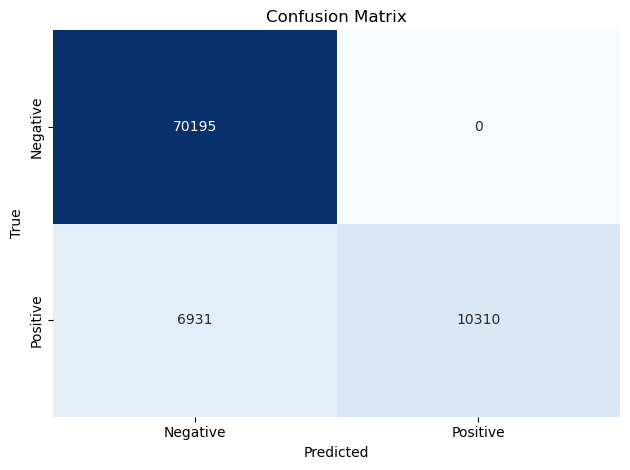

In [160]:
cm=confusion_matrix(y_test,y_pred)
fig,ax=plt.subplots()
sns.heatmap(cm,annot=True,fmt='d',cmap='Blues',cbar=False)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['Negative', 'Positive'])
ax.yaxis.set_ticklabels(['Negative', 'Positive'])
plt.tight_layout()
plt.show()

In [161]:
from sklearn.metrics import roc_curve,auc

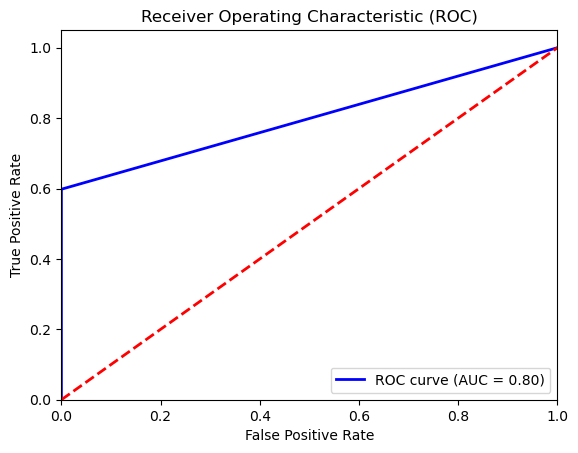

In [162]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

### Gradient Boosting Classifier

In [163]:
X=df[['MonthsDelinquent','CreditScore','MaturityMonth','FirstPaymentMonth','OrigLoanTerm','OrigInterestRate',
     'OrigUPB','Units','PropertyType','MaturityYear','FirstPaymentYear','DTI','MIP']]
y=df['EverDelinquent']

In [164]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)
X_train.shape,X_test.shape

((204015, 13), (87436, 13))

In [165]:
from sklearn.ensemble import GradientBoostingClassifier
gbc=GradientBoostingClassifier()
gbc.fit(X_train,y_train)

GradientBoostingClassifier()

In [166]:
y_pred=gbc.predict(X_test)

In [167]:
print('Gradient Boosting Classifier Metrics:')
print('Accuracy:',accuracy_score(y_pred,y_test))
print('Classification Report:',classification_report(y_pred,y_test))

Gradient Boosting Classifier Metrics:
Accuracy: 0.9207305915183677
Classification Report:               precision    recall  f1-score   support

         0.0       1.00      0.91      0.95     77126
         1.0       0.60      1.00      0.75     10310

    accuracy                           0.92     87436
   macro avg       0.80      0.96      0.85     87436
weighted avg       0.95      0.92      0.93     87436



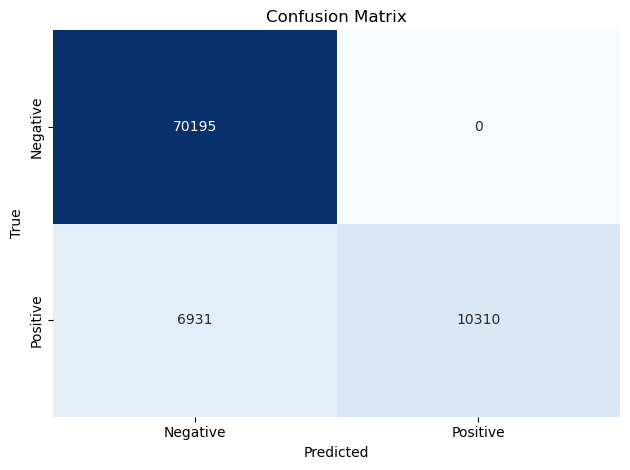

In [168]:
## Confusion Matrix
cm=confusion_matrix(y_test,y_pred)
fig,ax=plt.subplots()
sns.heatmap(cm,annot=True,fmt='d',cmap='Blues',cbar=False)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['Negative', 'Positive'])
ax.yaxis.set_ticklabels(['Negative', 'Positive'])
plt.tight_layout()
plt.show()

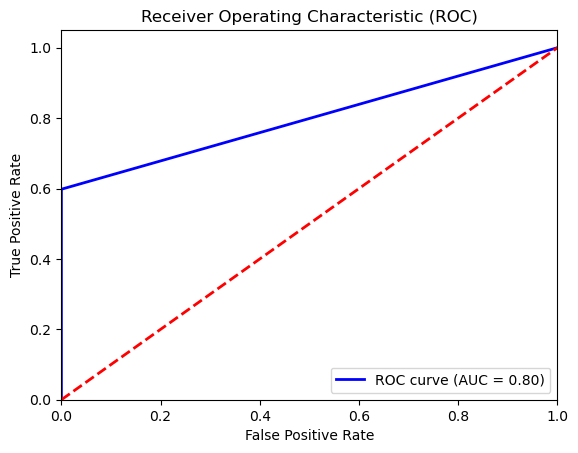

In [169]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

### Prepayment Risk Prediction

In [170]:
data=pd.read_csv('C:\\Python\\LoanExport.csv')
data.head()

C:\Users\prath\AppData\Local\Temp\ipykernel_8320\825696754.py:1: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  data=pd.read_csv('C:\\Python\\LoanExport.csv')


,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PostalCode,LoanSeqNum,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,0,199902,N,202901,16974,25,1,O,89,27,...,60400,F199Q1268030,P,360,2,FL,WASHINGTONMUTUALBANK,0,0,52
1,0,199902,N,202901,19740,0,1,O,73,17,...,80200,F199Q1015092,N,360,1,FT,CHASEHOMEFINANCELLC,0,0,144
2,0,199902,N,202901,29940,0,1,O,75,16,...,66000,F199Q1266886,N,360,2,FL,WASHINGTONMUTUALBANK,0,0,67
3,0,199902,N,202901,31084,0,1,O,76,14,...,90700,F199Q1178167,N,360,2,GM,GMACMTGECORP,0,0,35
4,0,199902,N,202901,35644,0,1,O,78,18,...,7600,F199Q1178517,N,360,2,GM,GMACMTGECORP,0,0,54


In [171]:
from sklearn.preprocessing import MinMaxScaler

data['PrepaymentRisk'] = data['CreditScore'] * data['DTI']

# Scale the prepayment risk values between 0 and 1
scaler = MinMaxScaler()
data['PrepaymentRisk'] = scaler.fit_transform(data[['PrepaymentRisk']])

In [172]:
for var in ['MSA','PropertyType','NumBorrowers']: ## Loop containing variables used for handling nan values
    data[var]=data[var].str.strip() ## Removing the white space using str.strip()
    data[var]=data[var].replace('X','Other') ## Replacing nan values with a category "Other"

In [173]:
for var in ['FirstTimeHomebuyer','SellerName']:
    mode=data[var].mode()
    data[var]=data[var].fillna(mode)[0]

In [174]:
data['PPM']=data['PPM'].replace('X','Other') ## Replacing nan values with "Other"

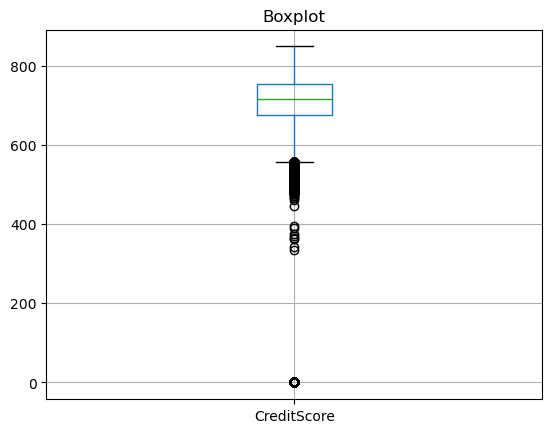

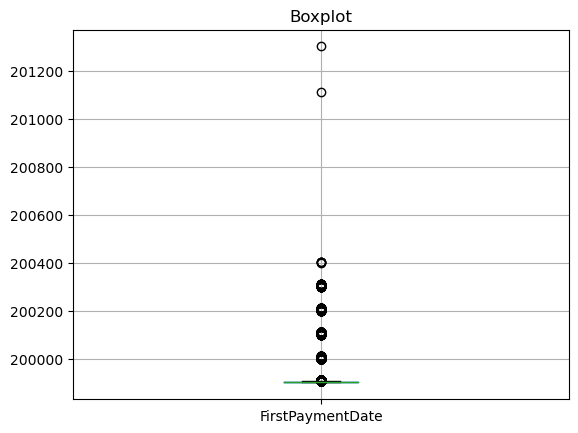

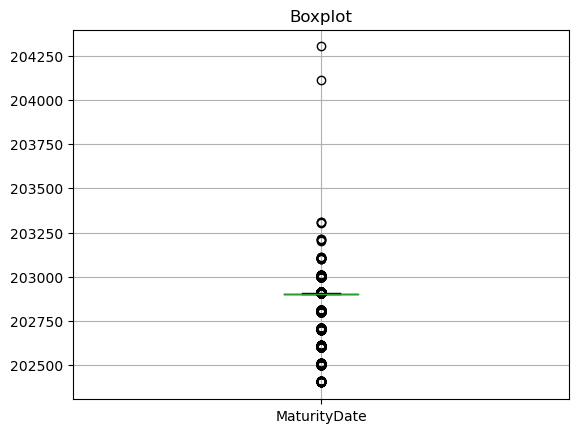

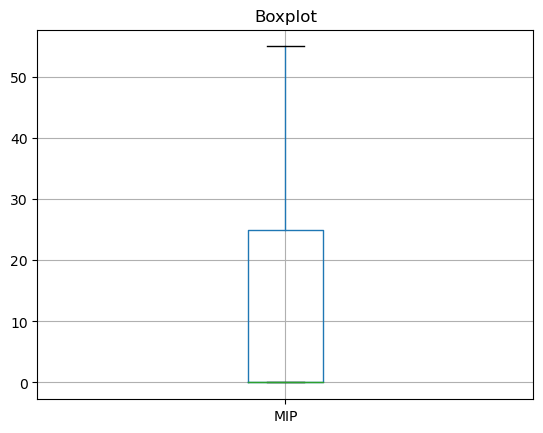

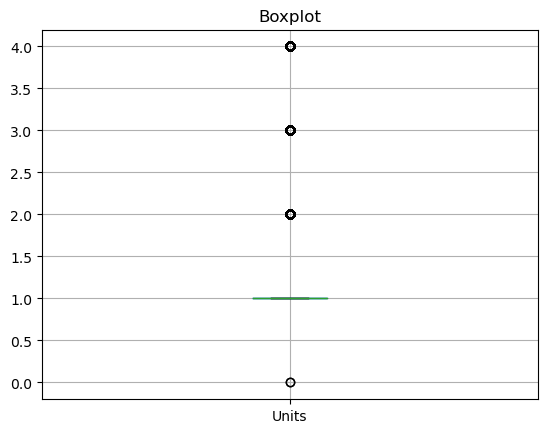

...

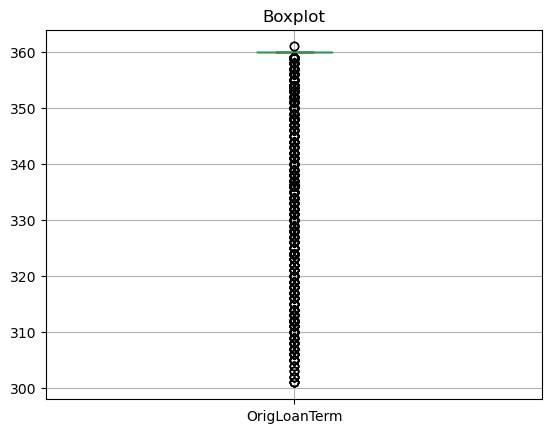

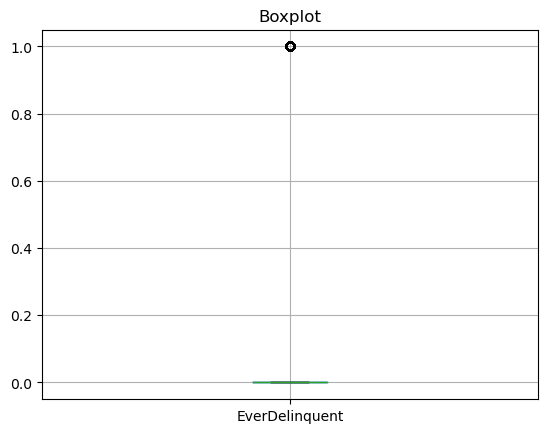

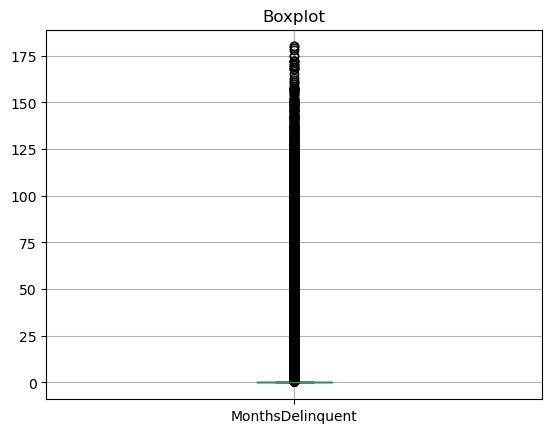

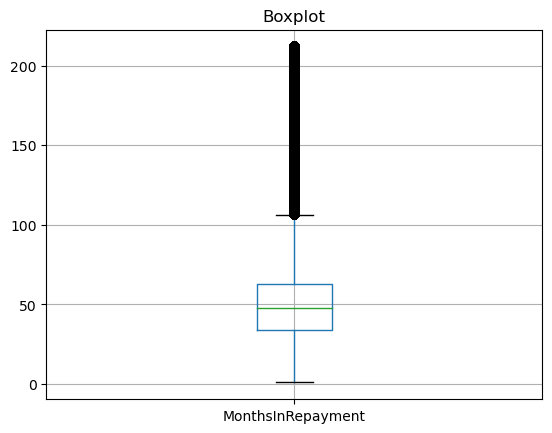

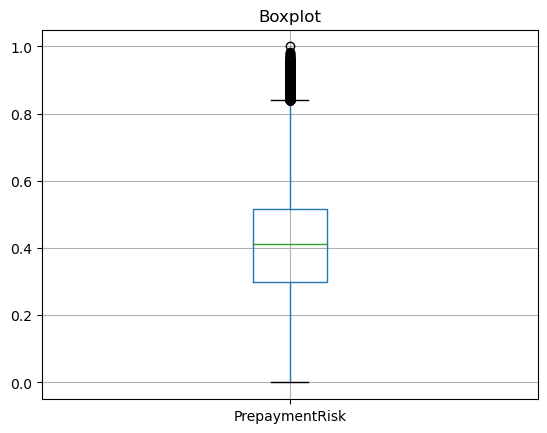

In [175]:
for var in data.select_dtypes(exclude='O'): ## Loop which contains only numerical variables
    data.boxplot(var) 
    plt.title('Boxplot')
    plt.show() ## Creating a boxplot for all the numerical variables`

In [176]:
## Function for capping outliers with 85th percentile and 15th percentile
def cap_outliers(data,variable):
    
    upper_limit=data[variable].quantile(0.85)
    lower_limit=data[variable].quantile(0.15)
    data[variable]=np.where(data[variable]>=upper_limit,upper_limit,
                         np.where(data[variable]<=lower_limit,lower_limit,
                                 data[variable])) ## We want values larger than upper limit and lower than lower limit

In [177]:
variables=['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm',
          'MonthsDelinquent','MonthsInRepayment']

for variable in variables:
    cap_outliers(data,variable) ## Loop to cap outliers for the variables in the list

In [178]:
## Function to plot distribution after removing outliers
def distribution_plot(data,variable):
    plt.figure(figsize=(8,6))
    
    plt.subplot(1,2,1)
    data.boxplot(column=variable)
    plt.title('Boxplot after handling outliers')
    
    plt.subplot(1,2,2)
    sns.distplot(data[variable])
    plt.title('Distribution after handling outliers')
    
    plt.show()

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


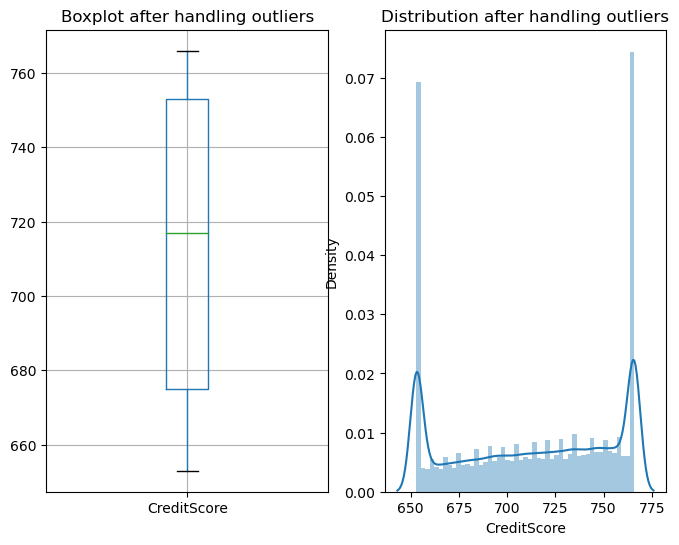

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


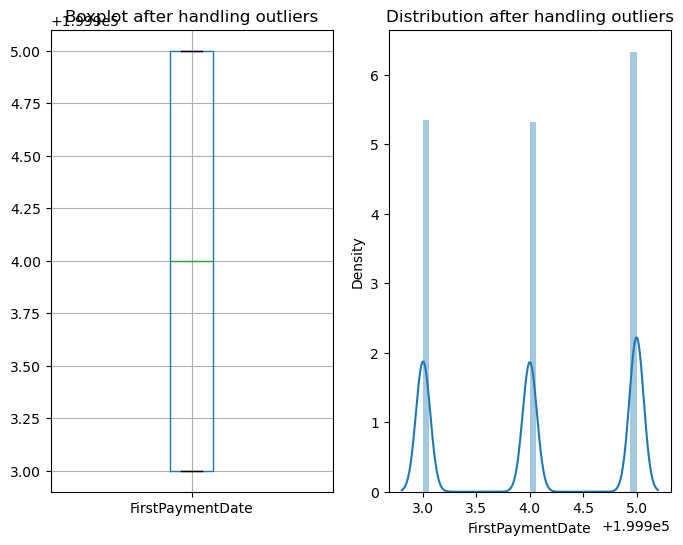

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


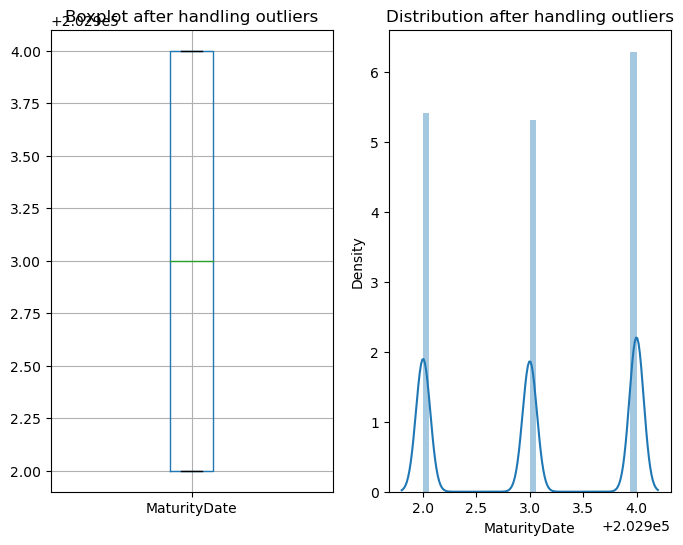

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


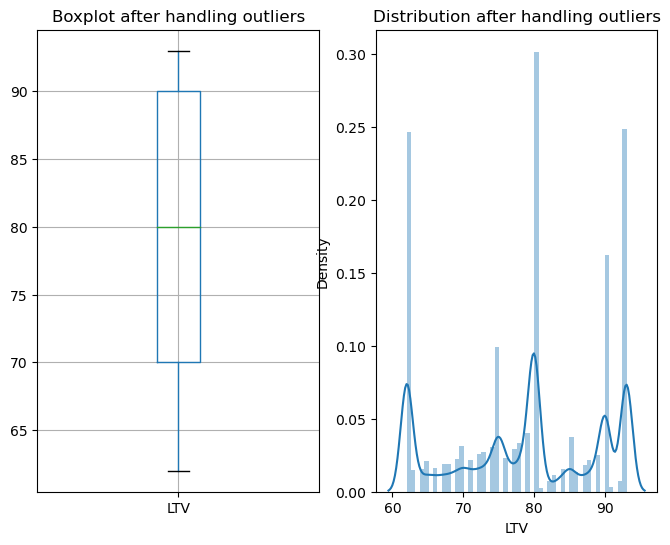

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


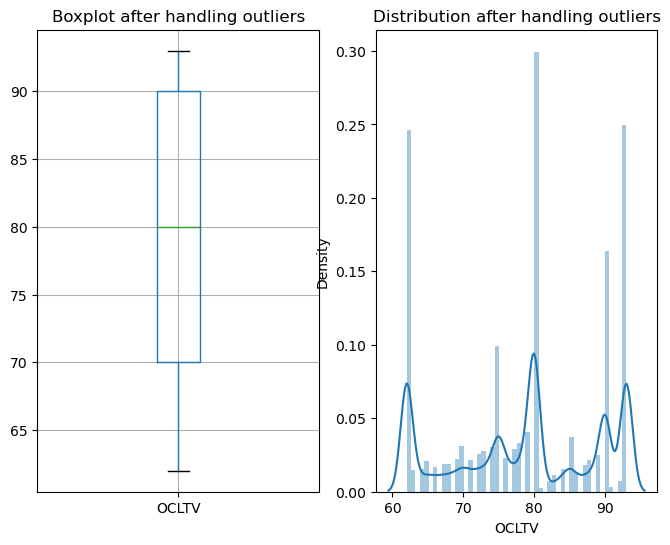

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


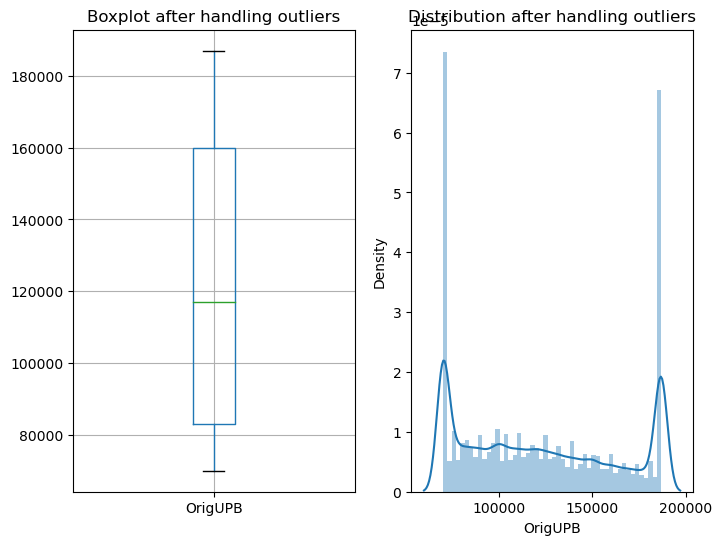

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


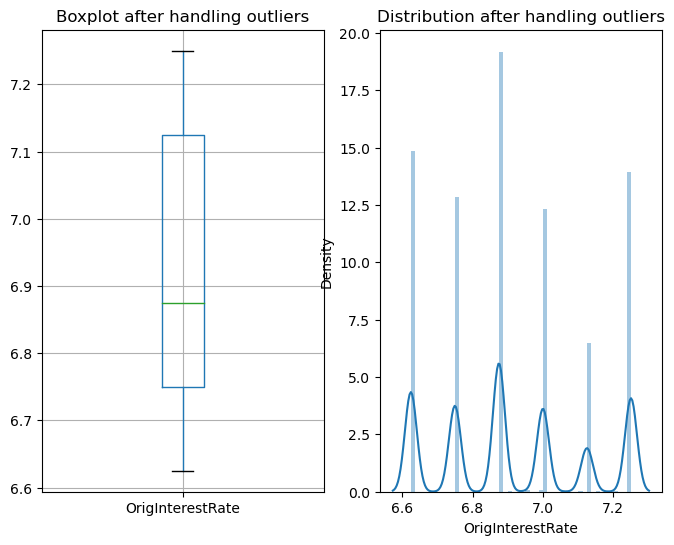

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


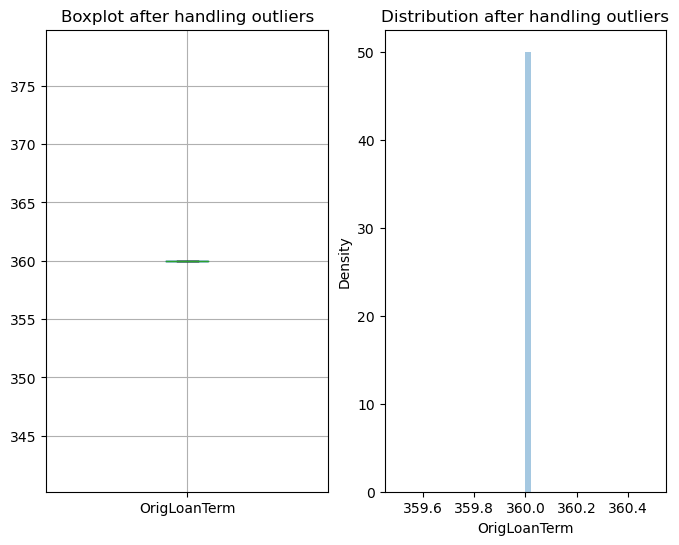

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


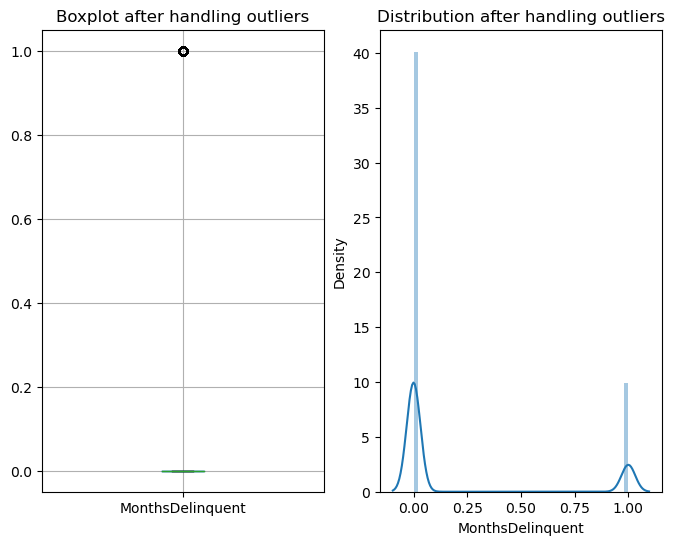

C:\Users\prath\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


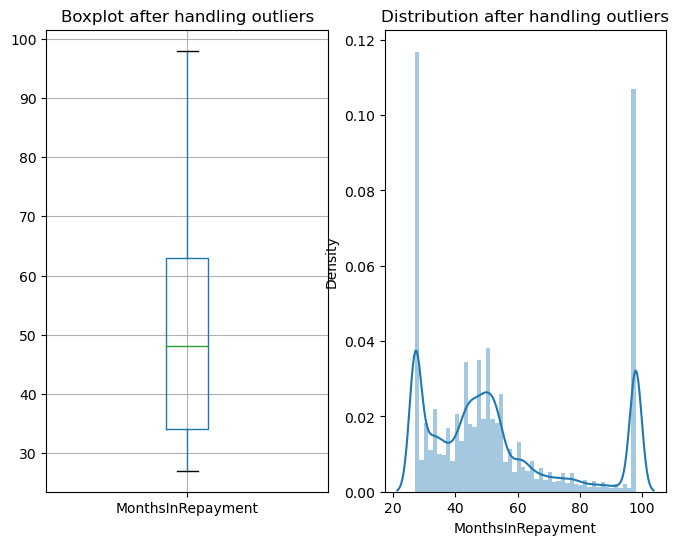

In [179]:
variables=['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm',
          'MonthsDelinquent','MonthsInRepayment']

for variable in variables:
    distribution_plot(data,variable)

In [180]:
for var in ['Occupancy','Channel','PPM','LoanPurpose','NumBorrowers','FirstTimeHomebuyer']:
    ordinal_mapping={k:i for i,k in enumerate(data[var].unique(),0)} ## Assigning labels starting from 0
    data[var]=data[var].map(ordinal_mapping) ## Encoding the variables with the labels assigned through the loop written above

In [181]:
for var in ['PostalCode','ServicerName','MSA']:
    frequency_map=(data[var].value_counts()/len(data)).to_dict() ## Calculating the frequency of the variables and convert them into
    ## a dictionary
    data[var]=data[var].map(frequency_map) ## Encoding with the frequency of the variables through loop

In [182]:
for variable in ['PropertyState','PropertyType']:
    count_map=data[variable].value_counts().to_dict() ## Calculating the number of observations present in each feature
    data[variable]=data[variable].map(count_map) ## Encoding the variables with the count of their observations

In [183]:
data.drop(['SellerName','ProductType','LoanSeqNum'],axis=1,inplace=True) ## Dropping the irrelevant features

In [184]:
for var in ['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigLoanTerm','MonthsInRepayment']:
    data[var]=data[var].round(1).astype(int) ## rounding off the values to 1 decimal point to simplify the process

In [185]:
data['FirstPaymentDate']=data['FirstPaymentDate'].astype(str) ## converting the feature into string
data['FirstPaymentDate']=pd.to_datetime(data['FirstPaymentDate'],format="%Y%m") ## converting to appropriate date-time format 
## using year and month

data['MaturityDate']=data['MaturityDate'].astype(str)
data['MaturityDate']=pd.to_datetime(data['MaturityDate'],format="%Y%m")

In [186]:
data['FirstPaymentYear']=data['FirstPaymentDate'].dt.year ## extracting year from firstpaymentdate
data['FirstPaymentMonth']=data['FirstPaymentDate'].dt.month ## extracting month from firstpaymentdate
data['MaturityYear']=data['MaturityDate'].dt.year ## extracting year from maturitydate
data['MaturityMonth']=data['MaturityDate'].dt.month ## extracting month from maturitydate

In [187]:
data.drop(['FirstPaymentDate','MaturityDate'],axis=1,inplace=True)

In [188]:
## Function is to check the normality of the variables
import scipy.stats as stats
def transformation_plot(data,variable):
    plt.figure(figsize=(6,6)) ## figure size= 6,6
    
    plt.subplot(1,2,1) ## 1  row, 2 columns and 1st chart
    data[variable].hist(bins=30)
    plt.title('Histogram of {}'.format(variable))
    
    plt.subplot(1,2,2) ## 1 row, 2 columns and 2nd chart
    stats.probplot(data[variable],dist='norm',plot=plt) ## distribution is normal and plotting is matplotlib
    plt.title('Q-Q Plot of {}'.format(variable))
    
    plt.show() ## Function to plot the histogram and q-q plot after handling outliers

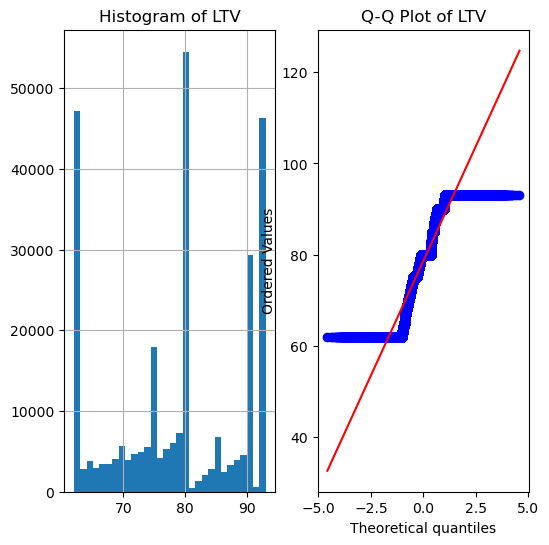

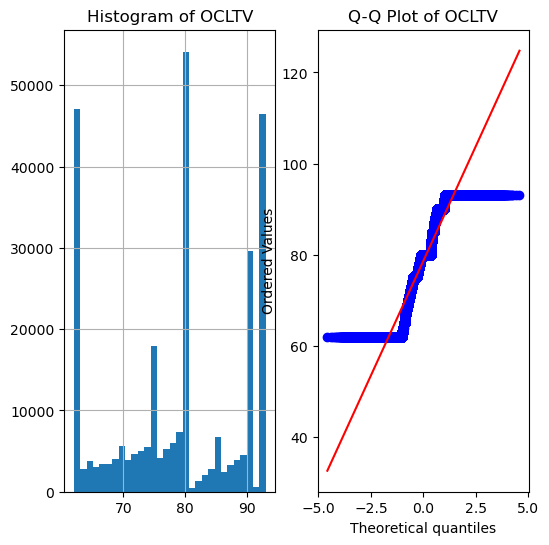

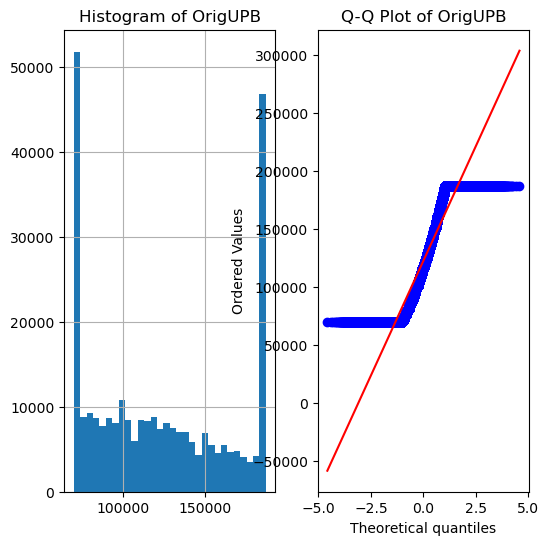

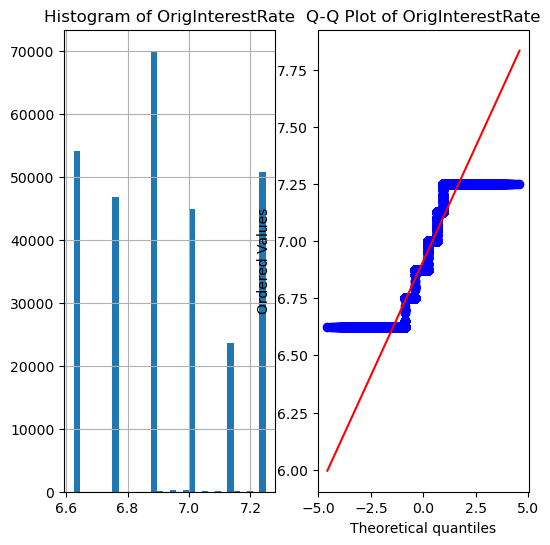

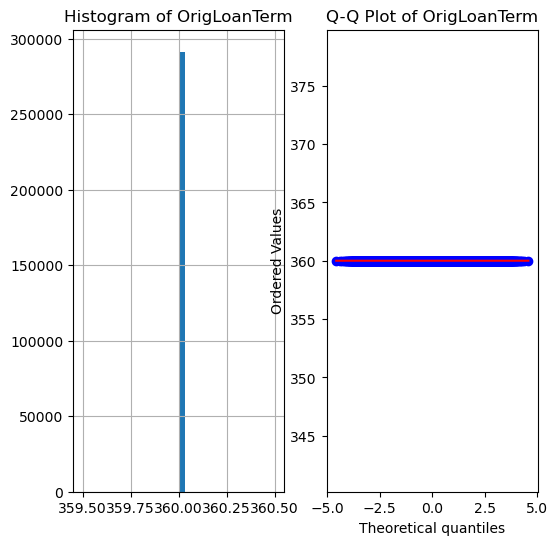

...

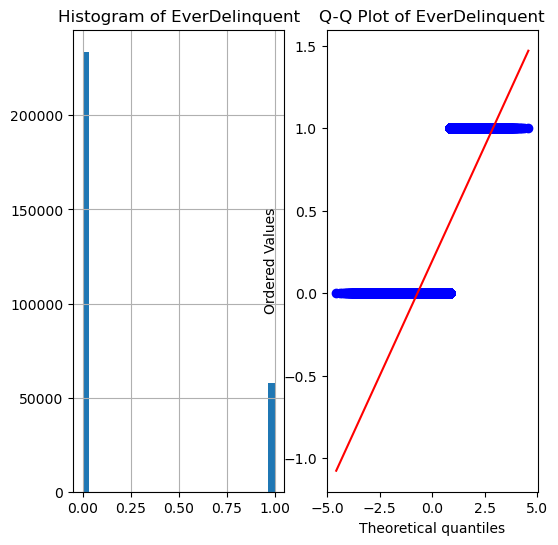

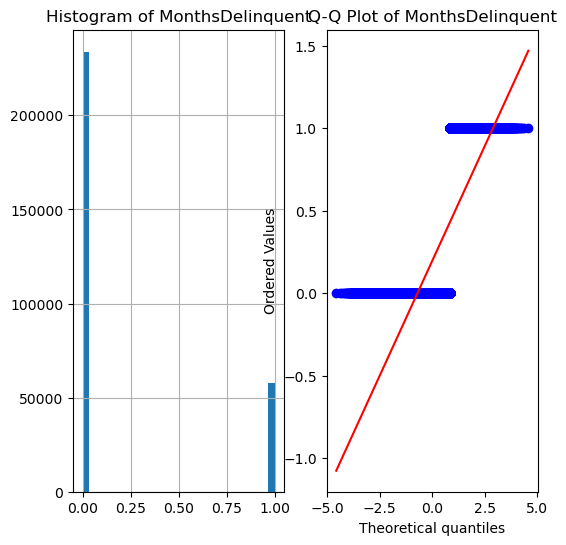

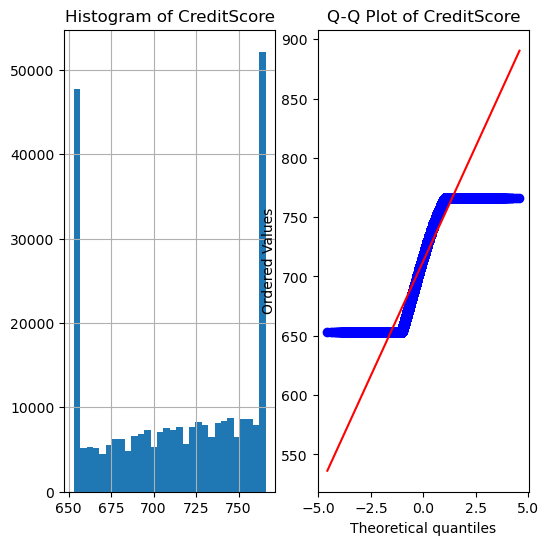

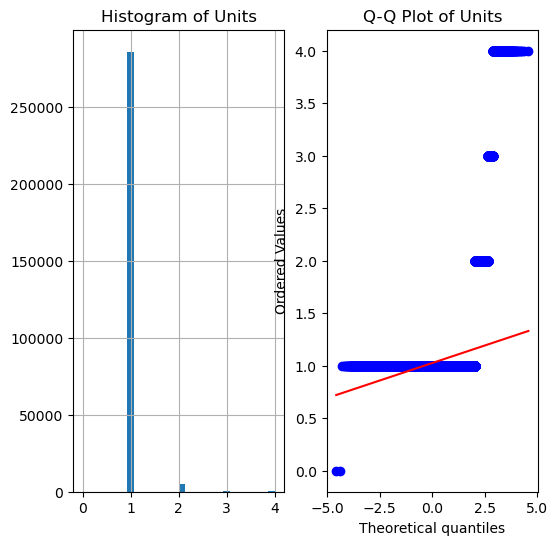

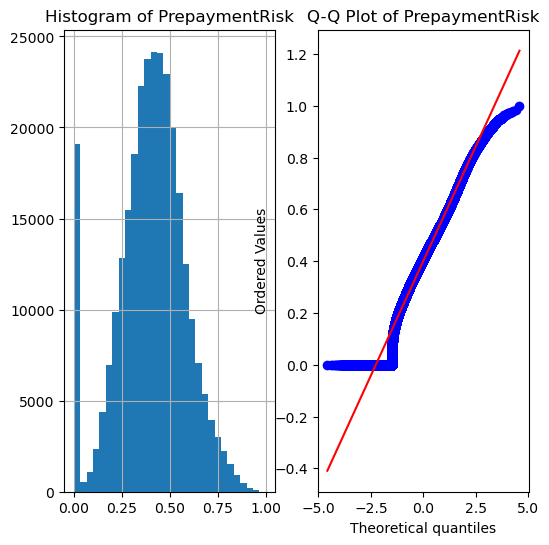

In [189]:
for variable in ['LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm','DTI','MonthsInRepayment','EverDelinquent',
           'MonthsDelinquent','CreditScore','Units','PrepaymentRisk']:
    transformation_plot(data,variable)

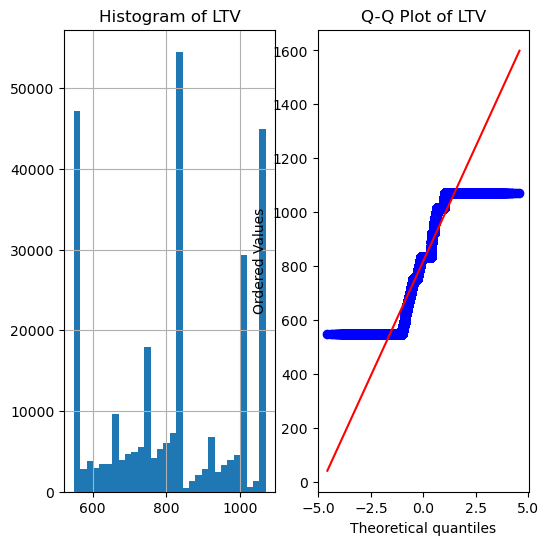

In [190]:
data['LTV'],param=stats.boxcox(data['LTV']) ## box-cox transformation with the parameter
transformation_plot(data,'LTV')

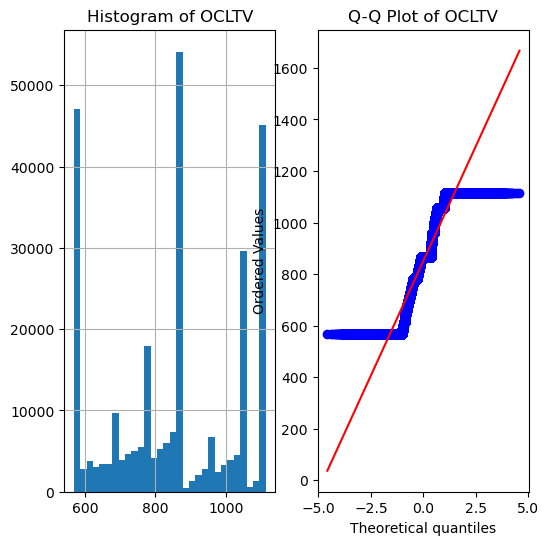

In [191]:
data['OCLTV'],param=stats.boxcox(data['OCLTV'])
transformation_plot(data,'OCLTV')

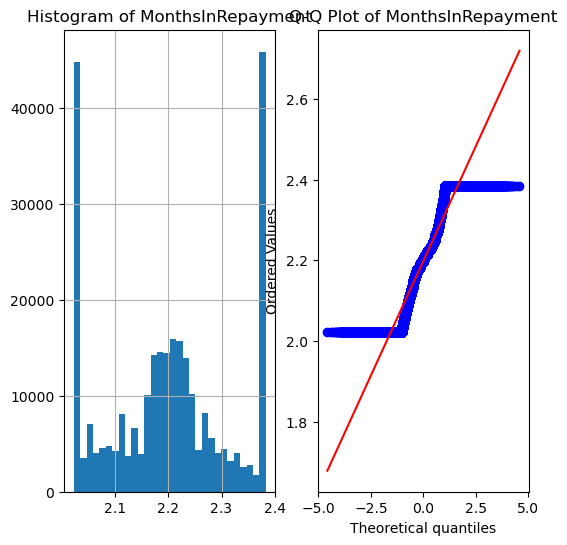

In [192]:
data['MonthsInRepayment'],param=stats.boxcox(data['MonthsInRepayment'])
transformation_plot(data,'MonthsInRepayment')

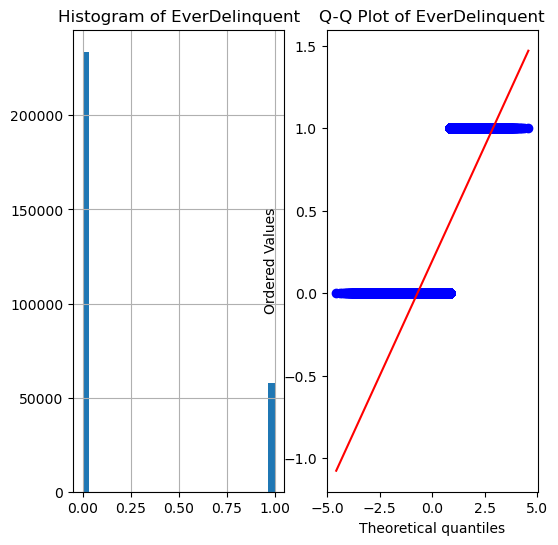

In [193]:
data['EverDelinquent']=np.sqrt(data['EverDelinquent'])
transformation_plot(data,'EverDelinquent')

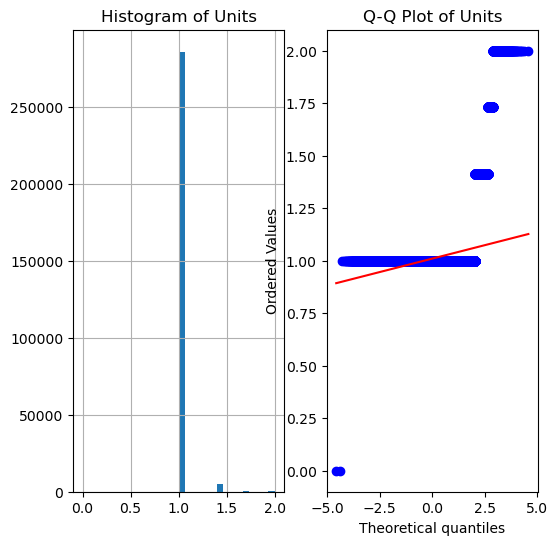

In [194]:
data['Units']=np.sqrt(data['Units'])
transformation_plot(data,'Units')

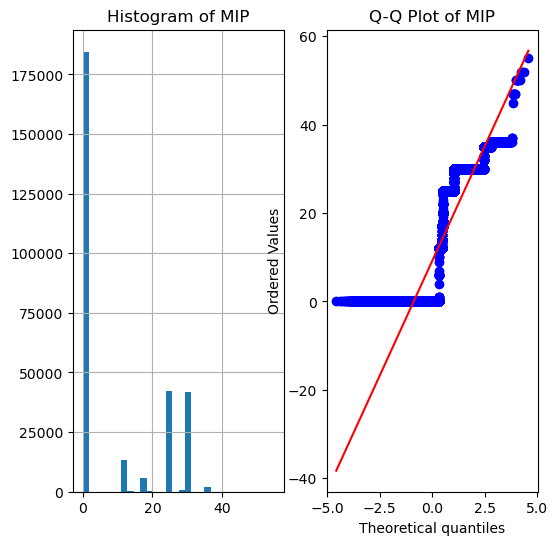

In [195]:
transformation_plot(data,'MIP')

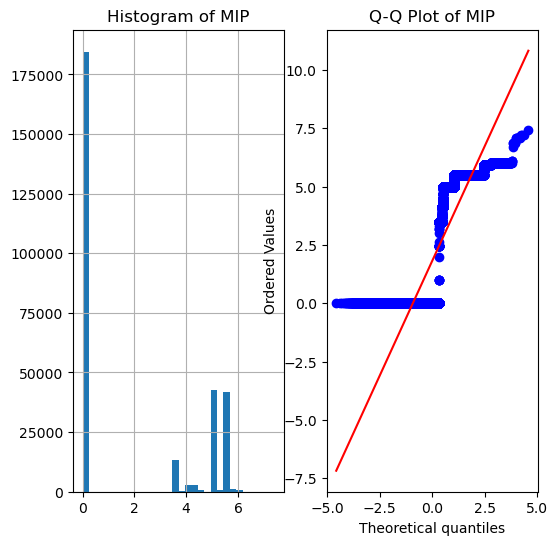

In [196]:
data['MIP']=np.sqrt(data['MIP'])
transformation_plot(data,'MIP')

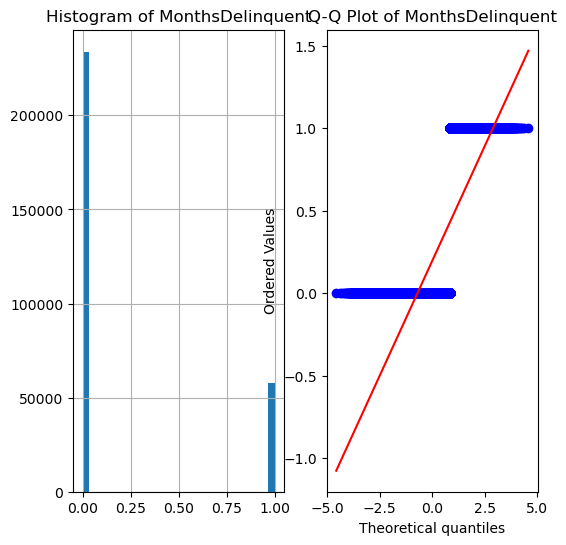

In [197]:
transformation_plot(data,'MonthsDelinquent')

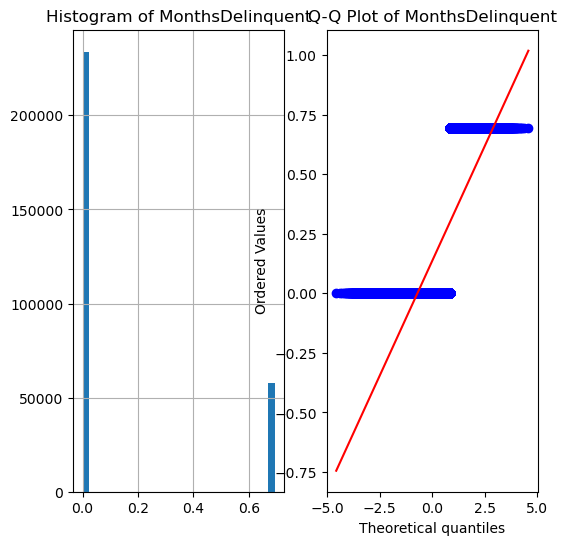

In [198]:
data['MonthsDelinquent']=np.log(data['MonthsDelinquent']+1)
transformation_plot(data,'MonthsDelinquent')

In [199]:
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler

X=data.drop('PrepaymentRisk',axis=1) ## independent variables
y=data['PrepaymentRisk'] ## dependent variable

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0) ## 20% data is for test and 80% goes to
## training
X_train.shape,X_test.shape

((233160, 27), (58291, 27))

In [200]:
scaler=StandardScaler() ## object for standardscaler
X_train=scaler.fit_transform(X_train) ## fitting the standardscaler object in train set
X_test=scaler.transform(X_test) ## fitting the scaler object in test set

In [201]:
from sklearn.decomposition import PCA
## Visualize PCA in 2-d
pca=PCA(n_components=2) ## top 2 features that have maximum information
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

C:\Users\prath\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Second Component')

C:\Users\prath\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


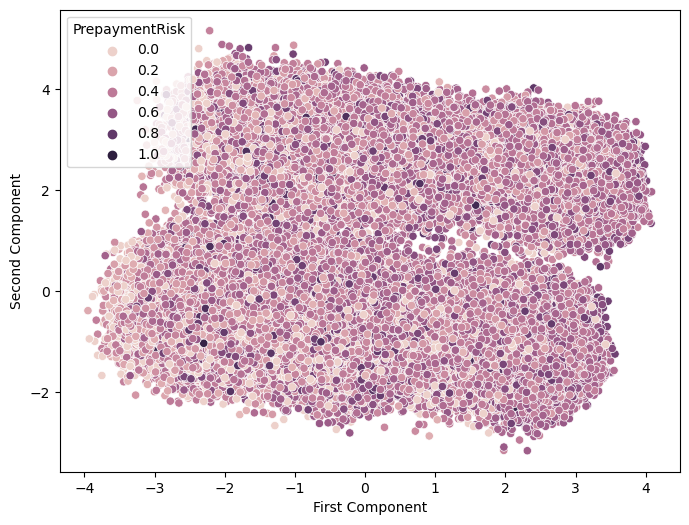

In [202]:
plt.figure(figsize=(8,6))
sns.scatterplot(X_train_trf[:,0],X_train_trf[:,1],hue=y_train)
plt.xlabel('First Component')
plt.ylabel('Second Component')

In [203]:
## Finding the optimum number of components
pca=PCA(n_components=None) ## Principal components equal to the number of variables in the data
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [204]:
np.cumsum(pca.explained_variance_ratio_) ## cumulative percentages of eigenvectors

array([0.14398735, 0.24109816, 0.33206473, 0.40400796, 0.46035353,
       0.51459903, 0.5667069 , 0.61493692, 0.65908371, 0.70029894,
       0.74018515, 0.77855297, 0.81513278, 0.84956295, 0.88217275,
       0.91260799, 0.94142029, 0.9664731 , 0.99044048, 0.99963802,
       0.99995965, 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        ])

Text(0, 0.5, '% of variance explained')

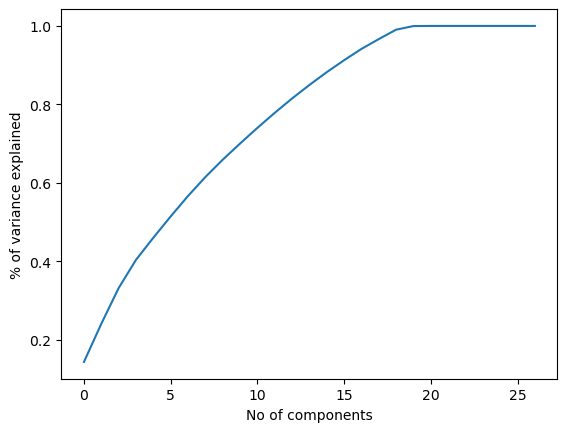

In [205]:
plt.plot(np.cumsum(pca.explained_variance_ratio_)) ## plotting the cumulative distribution function
plt.xlabel('No of components')
plt.ylabel('% of variance explained')

In [206]:
from sklearn.feature_selection import SelectKBest ## Selectkbest algorithm for feature selection
from sklearn.feature_selection import f_regression ## F-score

In [207]:
ordered_rank_features=SelectKBest(score_func=f_regression,k=15) ## This will give the top 15 features according to their F-score
ordered_feature=ordered_rank_features.fit(X,y) ## Fitting the algorithm to the dataset. Higher the F-score, more relevant
## is the feature with the target

In [208]:
ordered_feature.scores_ ## p-values corresponding to each F-score. Lower the p-value, more relevant the feature is with the
## target

array([1.06180755e+02, 0.00000000e+00, 1.06156709e+01, 1.77035292e+03,
       7.31701841e+01, 3.10751604e+01, 1.87596966e+03, 5.35199140e+06,
       1.35628423e+03, 1.85239647e+03, 1.82490808e+03, 4.75369126e+02,
       1.33040009e+00, 1.20214887e+03, 1.39225877e+02, 1.60187709e+02,
       5.43726685e+02, 0.00000000e+00, 1.67232821e+03, 1.48231442e+00,
       8.28359389e+01, 8.28359389e+01, 1.32665294e+02, 0.00000000e+00,
       2.53221547e+03, 0.00000000e+00, 2.60548224e+03])

In [209]:
datascores=pd.DataFrame(ordered_feature.scores_) ## converting the F-scores numpy array to a dataframe
datacolumns=pd.DataFrame(X.columns) ## Converting the independent features array to a dataframe

In [210]:
features_rank=pd.concat([datacolumns,datascores],axis=1) ## merging the two dataframes
features_rank.columns=['Features','Scores'] ## naming the columns
features_rank

,Features,Scores
0,CreditScore,1.061808e+02
1,FirstTimeHomebuyer,0.000000e+00
2,MSA,1.061567e+01
3,MIP,1.770353e+03
4,Units,7.317018e+01
5,Occupancy,3.107516e+01
6,OCLTV,1.875970e+03
7,DTI,5.351991e+06
8,OrigUPB,1.356284e+03
9,LTV,1.852396e+03


In [211]:
features_rank.nlargest(15,'Scores') ## We need only 15 features to explain the maximum amount of variance in the data

,Features,Scores
7,DTI,5.351991e+06
26,MaturityMonth,2.605482e+03
24,FirstPaymentMonth,2.532215e+03
6,OCLTV,1.875970e+03
9,LTV,1.852396e+03
10,OrigInterestRate,1.824908e+03
3,MIP,1.770353e+03
18,NumBorrowers,1.672328e+03
8,OrigUPB,1.356284e+03
13,PropertyState,1.202149e+03


### Linear Regression

In [212]:
X=data[['DTI','MaturityMonth','FirstPaymentMonth','OCLTV','LTV','OrigInterestRate','MIP','NumBorrowers','OrigUPB',
     'PropertyState','LoanPurpose','Channel','PostalCode','PropertyType','MonthsInRepayment','CreditScore']]
y=data['PrepaymentRisk']

In [213]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)
X_train.shape,X_test.shape

((204015, 16), (87436, 16))

In [214]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

In [215]:
lin=LinearRegression()
lin.fit(X_train,y_train)

LinearRegression()

In [216]:
y_pred=lin.predict(X_test)

In [217]:
print('Linear Regression Metrics:')
print('R2 Score:',r2_score(y_pred,y_test))
print('Mean Squared Error:',mean_squared_error(y_pred,y_test))
print('Mean Absolute Error:',mean_absolute_error(y_pred,y_test))

Linear Regression Metrics:
R2 Score: 0.9746025018637904
Mean Squared Error: 0.0007942249779697527
Mean Absolute Error: 0.011306746842013844


In [218]:
print('Training Accuracy:',lin.score(X_train,y_train))
print('Test Accuracy:',lin.score(X_test,y_test))

Training Accuracy: 0.9762370099979758
Test Accuracy: 0.9751877799730887


In [219]:
## Feature Importance
importances = np.abs(lin.coef_)
importances=pd.Series(importances,index=X.columns)
importances.sort_values(ascending=False)

PostalCode           5.491488e-01
DTI                  1.355604e-02
OrigInterestRate     1.483621e-03
LoanPurpose          1.210828e-03
MonthsInRepayment    1.104804e-03
CreditScore          7.393897e-04
NumBorrowers         6.250045e-04
Channel              3.184012e-04
FirstPaymentMonth    2.545416e-04
MIP                  2.295226e-04
MaturityMonth        3.894392e-05
LTV                  8.074947e-06
OCLTV                2.097909e-06
PropertyState        4.129662e-08
OrigUPB              3.736998e-09
PropertyType         2.187693e-09
dtype: float64

In [220]:
## Mutual Information Gain
from sklearn.feature_selection import mutual_info_regression

In [221]:
mi_scores=mutual_info_regression(X,y)

<AxesSubplot:>

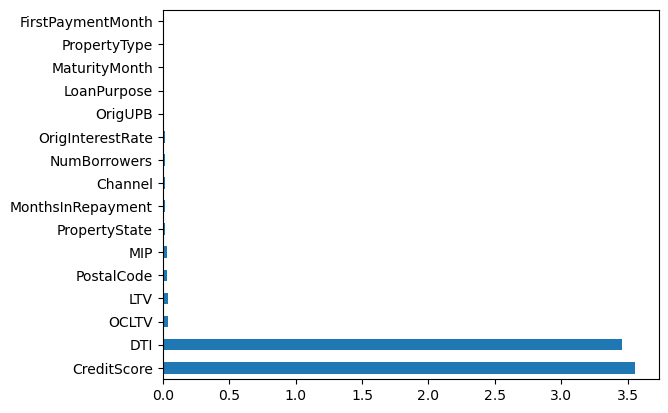

In [222]:
mi_scores=pd.Series(mi_scores,index=X.columns)
mi_scores.sort_values(ascending=False).plot(kind='barh')

In [223]:
X=data[['CreditScore','DTI','LTV','OCLTV','PostalCode','MIP','PropertyState','MonthsInRepayment','Channel','OrigInterestRate']]
y=data['PrepaymentRisk']

In [224]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)

In [225]:
lin=LinearRegression()
lin.fit(X_train,y_train)

LinearRegression()

In [226]:
y_pred=lin.predict(X_test)

In [227]:
print('Linear Regression Metrics:')
print('R2 Score:',r2_score(y_pred,y_test))
print('Mean Squared Error:',mean_squared_error(y_pred,y_test))
print('Mean Absolute Error:',mean_absolute_error(y_pred,y_test))

Linear Regression Metrics:
R2 Score: 0.9745688588865736
Mean Squared Error: 0.0007952496632117908
Mean Absolute Error: 0.011279606302447193


In [228]:
## Feature Importance
importances = np.abs(lin.coef_)
importances=pd.Series(importances,index=X.columns)
importances.sort_values(ascending=False)

PostalCode           5.473671e-01
DTI                  1.355253e-02
OrigInterestRate     1.532304e-03
MonthsInRepayment    8.846329e-04
CreditScore          7.360103e-04
Channel              4.118973e-04
MIP                  2.486515e-04
LTV                  6.480590e-06
OCLTV                2.992220e-06
PropertyState        4.024228e-08
dtype: float64

### Ridge Regression

In [229]:
X=data.drop('PrepaymentRisk',axis=1) ## independent variables
y=data['PrepaymentRisk'] ## dependent variable

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0) ## 20% data is for test and 80% goes to
## training
X_train.shape,X_test.shape

((233160, 27), (58291, 27))

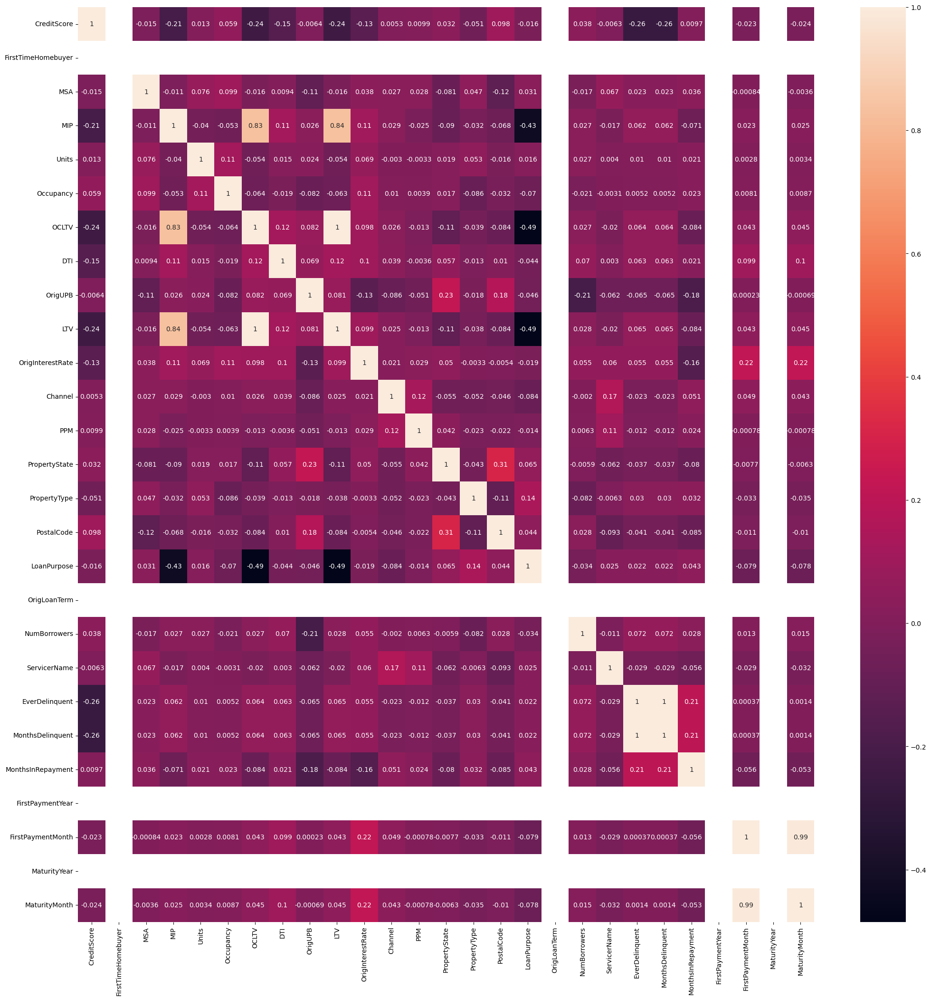

In [230]:
plt.figure(figsize=(25,25))
cor=X_train.corr()
sns.heatmap(cor,annot=True)
plt.show()

In [231]:
def correlation(data,threshold):
    corr_col=set()
    corr_matrix=data.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i,j])>threshold:
                colname=corr_matrix.columns[i]
                corr_col.add(colname)

    return corr_col

In [232]:
corr_features=correlation(X_train,0.7)
len(set(corr_features))

4

In [233]:
corr_features

{'LTV', 'MaturityMonth', 'MonthsDelinquent', 'OCLTV'}

In [234]:
from sklearn.linear_model import Ridge
ridge=Ridge()
ridge.fit(X_train,y_train)

Ridge()

In [235]:
y_pred=ridge.predict(X_test)

In [236]:
print('Ridge Regression Metrics:')
print('R2 Score:',r2_score(y_pred,y_test))
print('Mean Squared Error:',mean_squared_error(y_pred,y_test))
print('Mean Absolute Error:',mean_absolute_error(y_pred,y_test))

Ridge Regression Metrics:
R2 Score: 0.974653019246831
Mean Squared Error: 0.0007895006762229069
Mean Absolute Error: 0.011277208631670331


In [237]:
print('Training Accuracy:',ridge.score(X_train,y_train))
print('Test Accuracy:',ridge.score(X_test,y_test))

Training Accuracy: 0.97608143902589
Test Accuracy: 0.9752603164669503


In [238]:
## Feature Importance
importances = np.abs(ridge.coef_)
importances=pd.Series(importances,index=X.columns)
importances.sort_values(ascending=False)

PostalCode            2.237266e-01
DTI                   1.355341e-02
Units                 1.823831e-03
MSA                   1.464822e-03
OrigInterestRate      1.327048e-03
LoanPurpose           1.238124e-03
ServicerName          1.094697e-03
PPM                   8.710174e-04
CreditScore           7.364795e-04
NumBorrowers          6.473973e-04
EverDelinquent        6.021965e-04
MonthsDelinquent      4.174108e-04
Occupancy             2.885183e-04
Channel               2.865395e-04
MonthsInRepayment     2.460739e-04
MIP                   2.197751e-04
FirstPaymentMonth     1.395320e-04
MaturityMonth         9.503767e-05
LTV                   7.231290e-06
OCLTV                 7.426687e-07
PropertyState         2.944002e-08
OrigUPB               4.780893e-09
PropertyType          7.914915e-10
OrigLoanTerm          0.000000e+00
FirstTimeHomebuyer    0.000000e+00
FirstPaymentYear      0.000000e+00
MaturityYear          0.000000e+00
dtype: float64

### Lasso Regression

In [239]:
X=pd.DataFrame(data.drop(labels=['PrepaymentRisk'],axis=1))
y=pd.DataFrame(data['PrepaymentRisk'])

In [240]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)

C:\Users\prath\AppData\Local\Temp\ipykernel_8320\2592987377.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))


<Figure size 800x800 with 0 Axes>

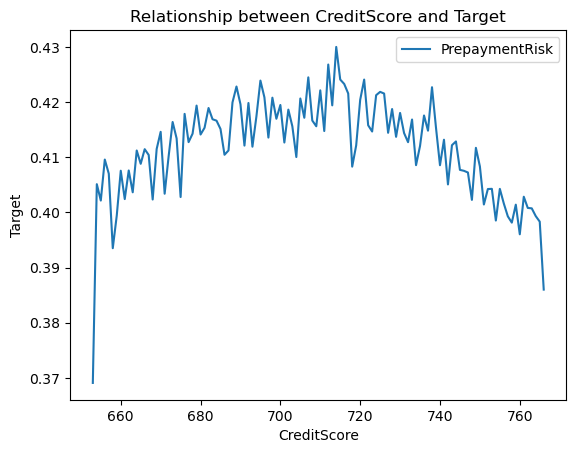

<Figure size 800x800 with 0 Axes>

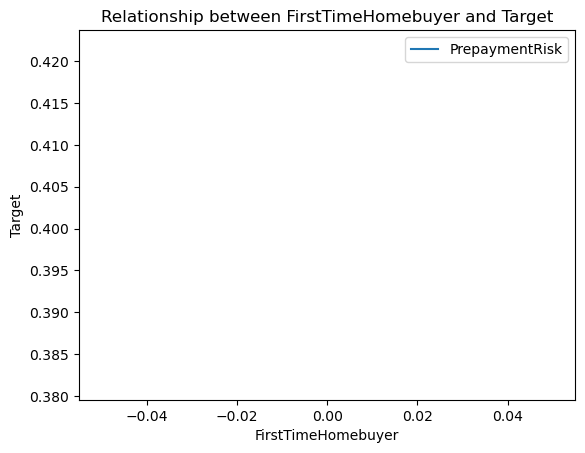

<Figure size 800x800 with 0 Axes>

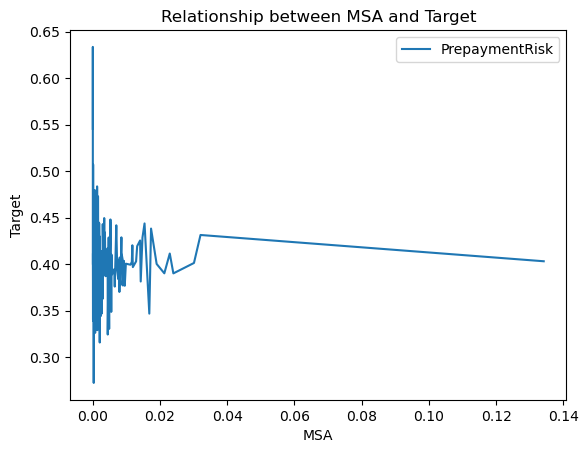

<Figure size 800x800 with 0 Axes>

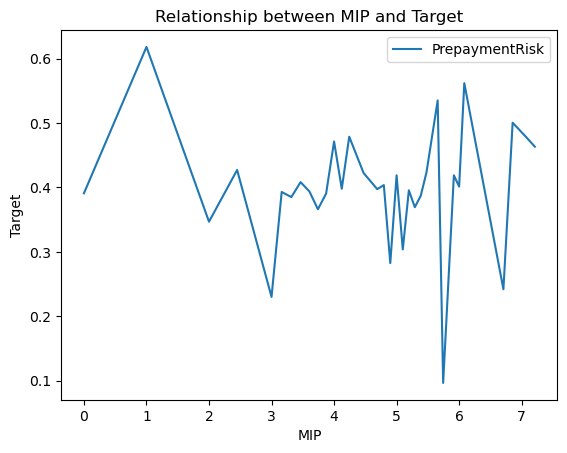

<Figure size 800x800 with 0 Axes>

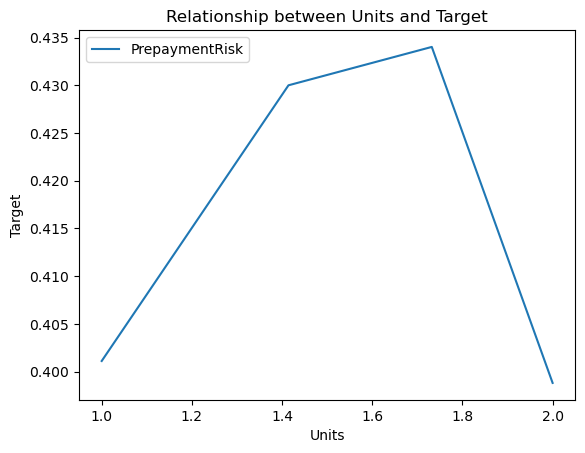

<Figure size 800x800 with 0 Axes>

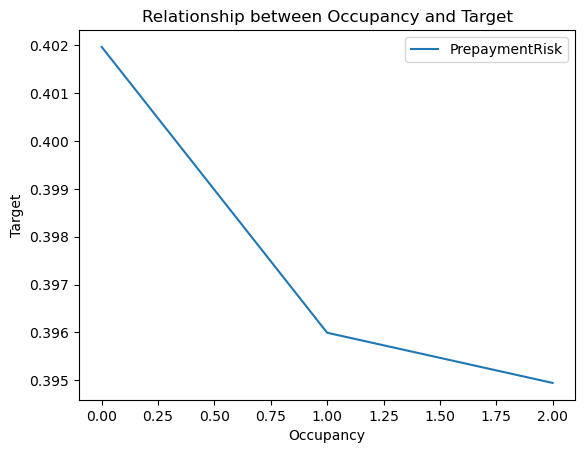

<Figure size 800x800 with 0 Axes>

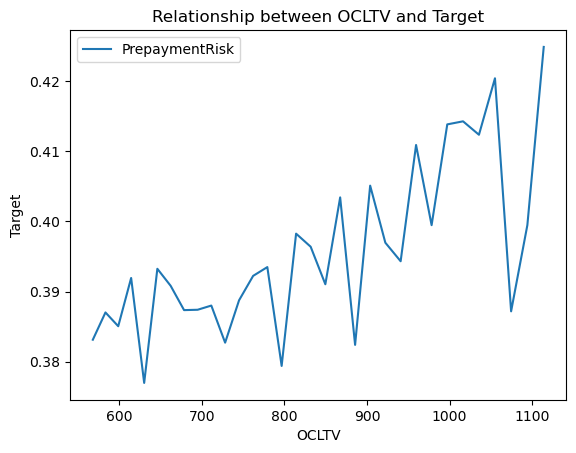

<Figure size 800x800 with 0 Axes>

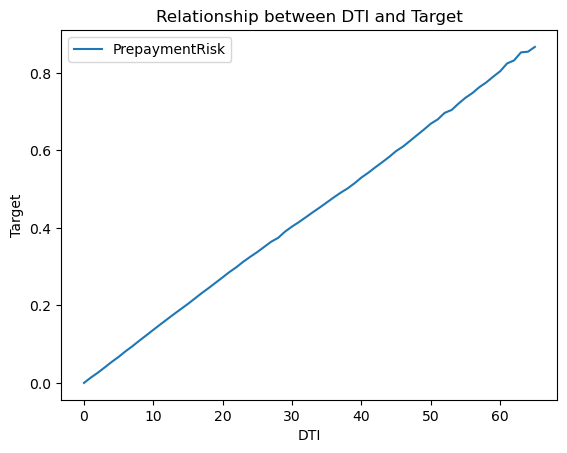

<Figure size 800x800 with 0 Axes>

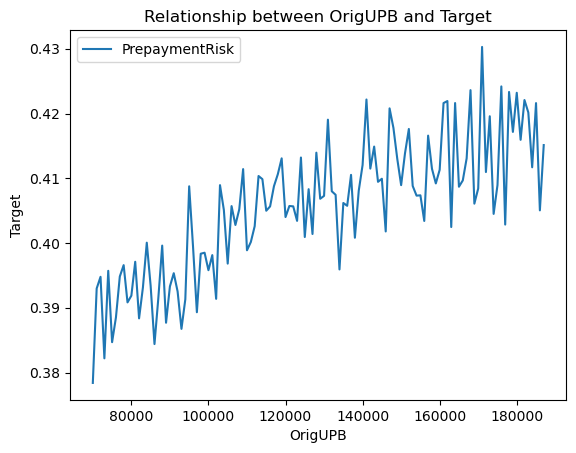

<Figure size 800x800 with 0 Axes>

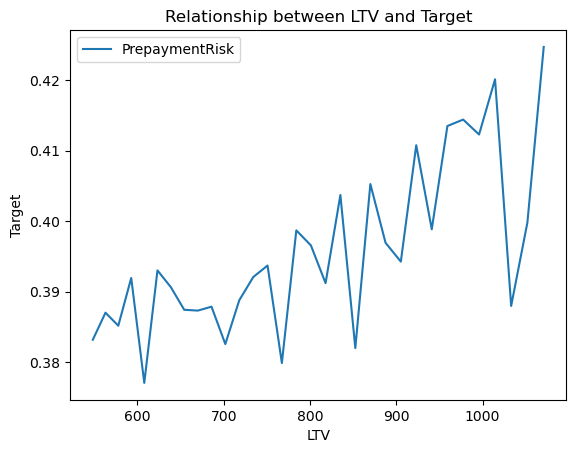

<Figure size 800x800 with 0 Axes>

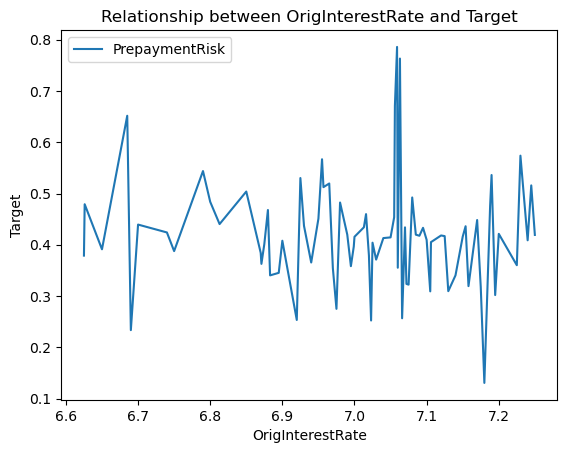

<Figure size 800x800 with 0 Axes>

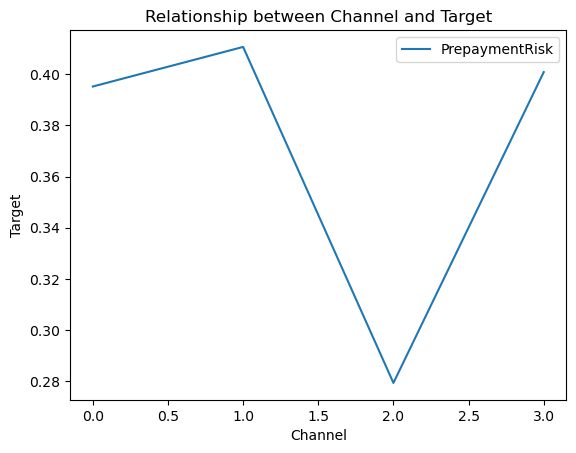

<Figure size 800x800 with 0 Axes>

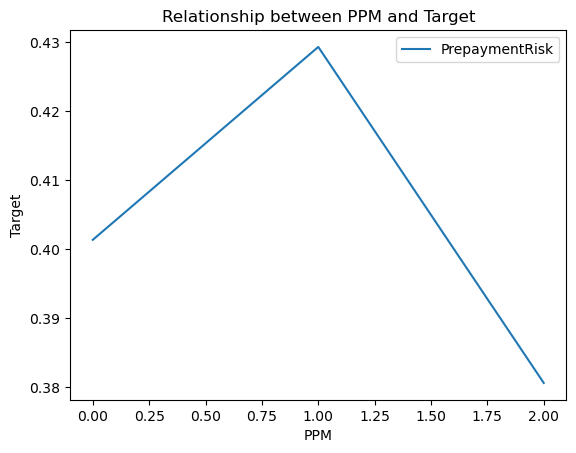

<Figure size 800x800 with 0 Axes>

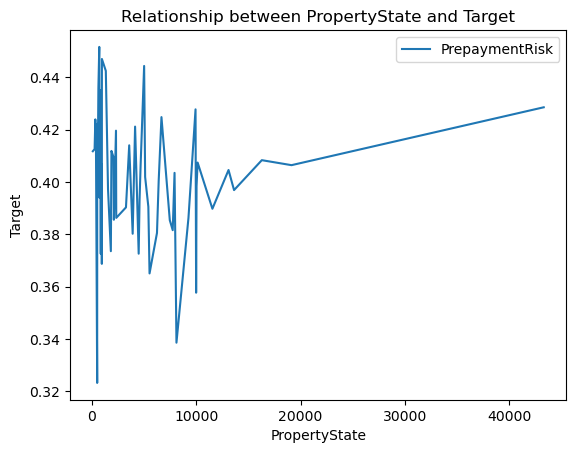

<Figure size 800x800 with 0 Axes>

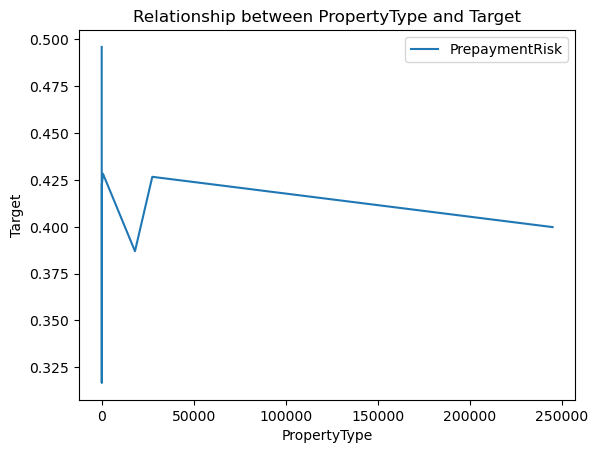

<Figure size 800x800 with 0 Axes>

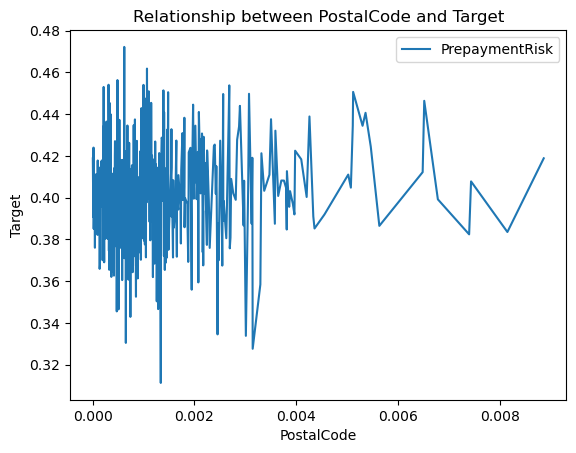

<Figure size 800x800 with 0 Axes>

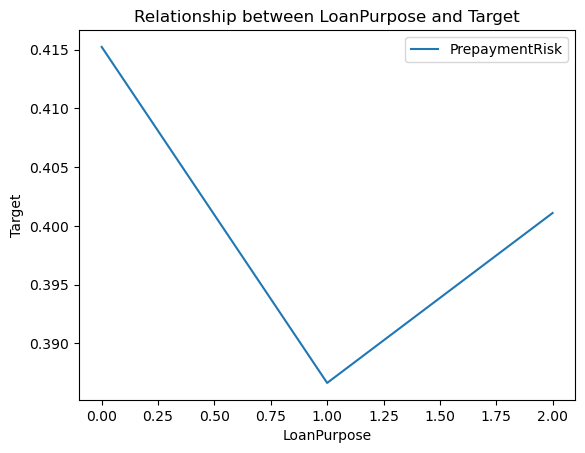

<Figure size 800x800 with 0 Axes>

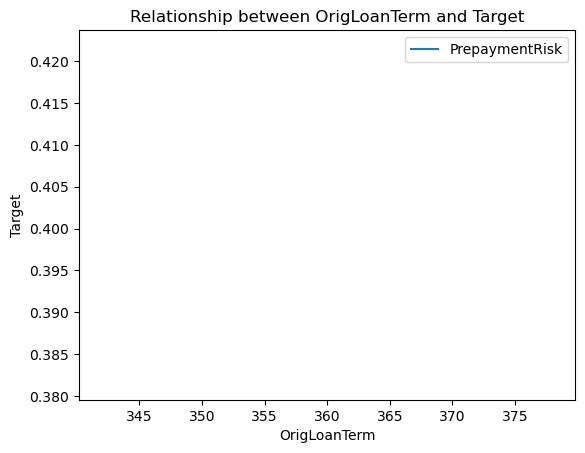

<Figure size 800x800 with 0 Axes>

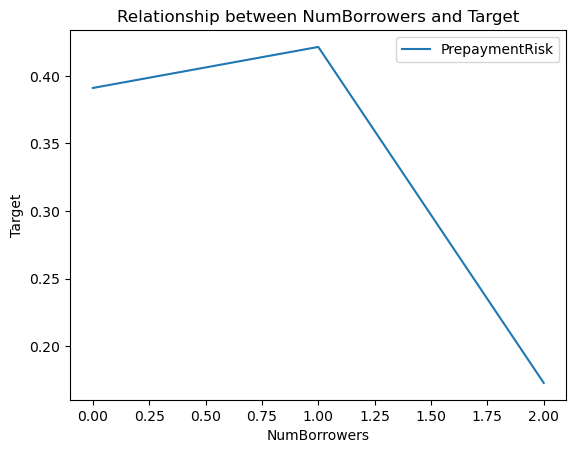

<Figure size 800x800 with 0 Axes>

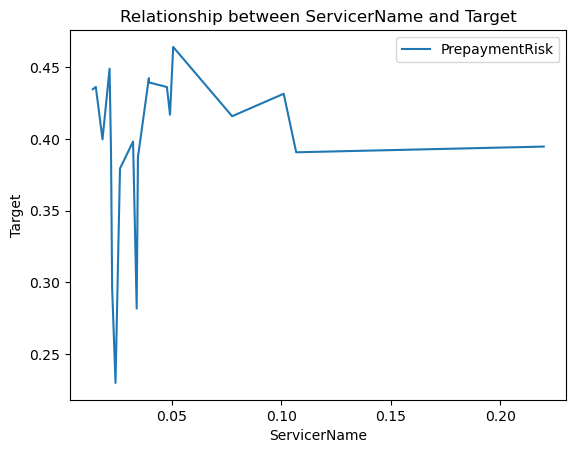

<Figure size 800x800 with 0 Axes>

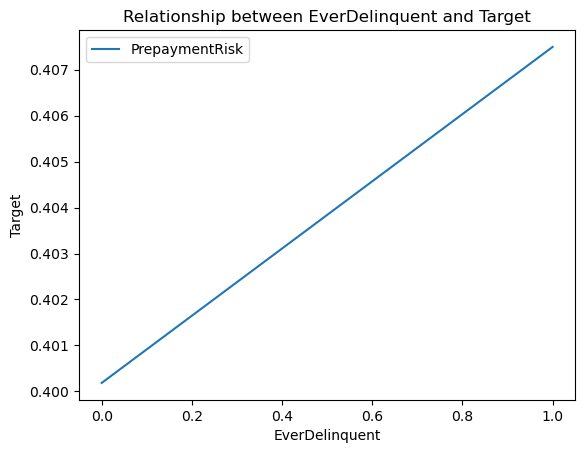

<Figure size 800x800 with 0 Axes>

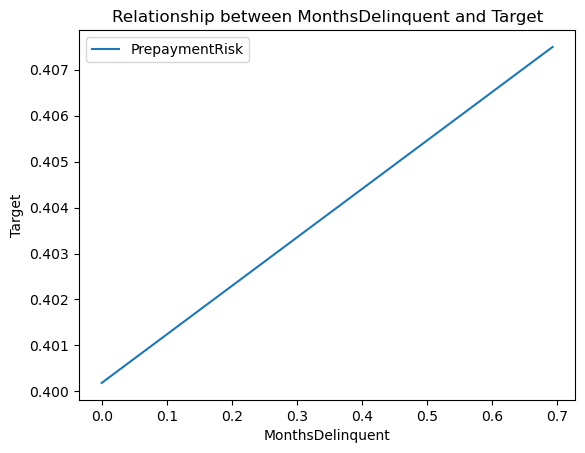

<Figure size 800x800 with 0 Axes>

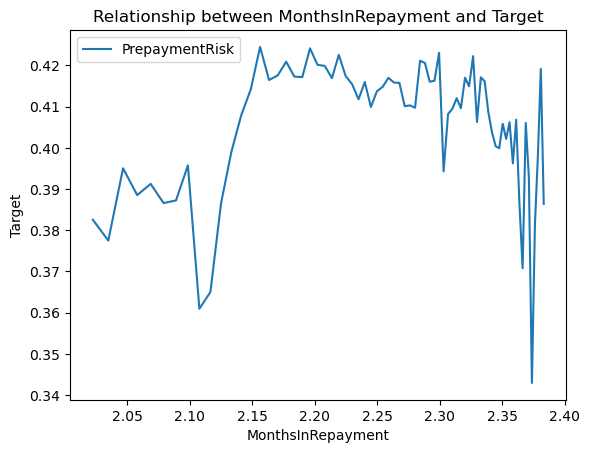

<Figure size 800x800 with 0 Axes>

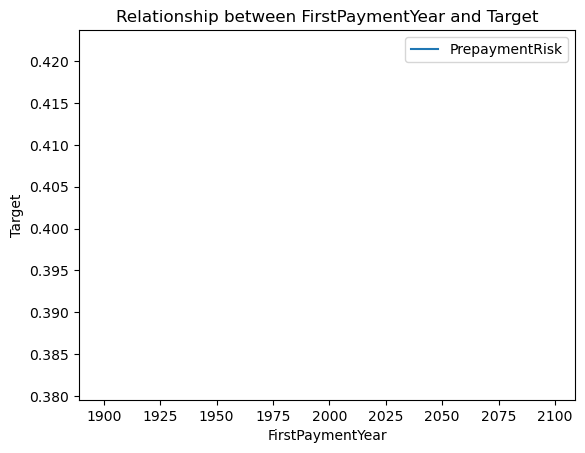

<Figure size 800x800 with 0 Axes>

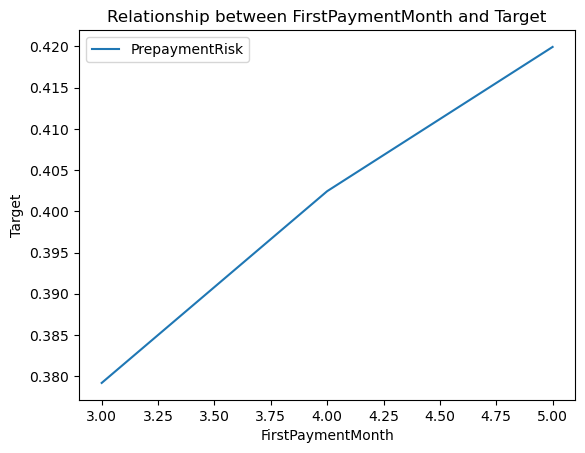

<Figure size 800x800 with 0 Axes>

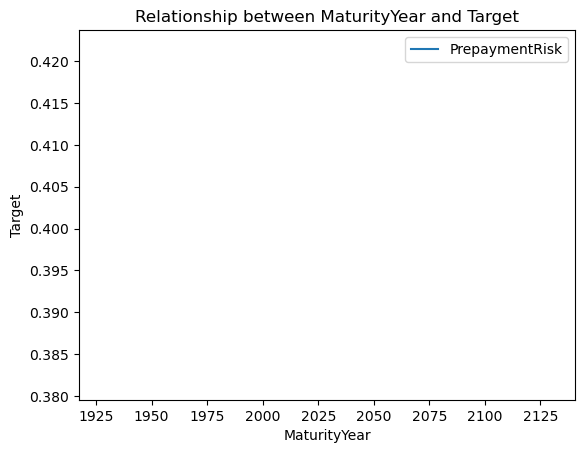

<Figure size 800x800 with 0 Axes>

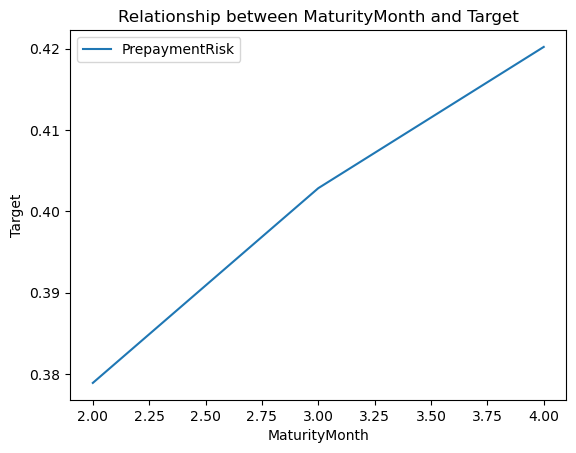

In [241]:
for var in ['CreditScore', 'FirstTimeHomebuyer', 'MSA', 'MIP', 'Units', 'Occupancy',
       'OCLTV', 'DTI', 'OrigUPB', 'LTV', 'OrigInterestRate', 'Channel', 'PPM',
       'PropertyState', 'PropertyType', 'PostalCode', 'LoanPurpose',
       'OrigLoanTerm', 'NumBorrowers', 'ServicerName', 'EverDelinquent',
       'MonthsDelinquent', 'MonthsInRepayment', 'FirstPaymentYear',
       'FirstPaymentMonth', 'MaturityYear', 'MaturityMonth']:
    
    plt.figure(figsize=(8,8))
    fig=y_train.groupby(X_train[var]).mean().plot()
    fig.set_xlabel(var)
    fig.set_ylabel('Target')
    fig.set_title('Relationship between {} and Target'.format(var))

In [242]:
from feature_engine.discretisation import EqualFrequencyDiscretiser

In [243]:
disc=EqualFrequencyDiscretiser(q=10,variables=['CreditScore', 'FirstTimeHomebuyer', 'MSA', 'MIP', 'Units', 'Occupancy',
       'OCLTV', 'DTI', 'OrigUPB', 'LTV', 'OrigInterestRate', 'Channel', 'PPM',
       'PropertyState', 'PropertyType', 'PostalCode', 'LoanPurpose',
       'OrigLoanTerm', 'NumBorrowers', 'ServicerName', 'EverDelinquent',
       'MonthsDelinquent', 'MonthsInRepayment', 'FirstPaymentYear',
       'FirstPaymentMonth', 'MaturityYear', 'MaturityMonth'])
disc.fit(X_train)

EqualFrequencyDiscretiser(variables=['CreditScore', 'FirstTimeHomebuyer', 'MSA',
                                     'MIP', 'Units', 'Occupancy', 'OCLTV',
                                     'DTI', 'OrigUPB', 'LTV',
                                     'OrigInterestRate', 'Channel', 'PPM',
                                     'PropertyState', 'PropertyType',
                                     'PostalCode', 'LoanPurpose',
                                     'OrigLoanTerm', 'NumBorrowers',
                                     'ServicerName', 'EverDelinquent',
                                     'MonthsDelinquent', 'MonthsInRepayment',
                                     'FirstPaymentYear', 'FirstPaymentMonth',
                                     'MaturityYear', 'MaturityMonth'])

In [244]:
disc.binner_dict_

{'CreditScore': [-inf, 664.0, 684.0, 701.0, 717.0, 732.0, 746.0, 760.0, inf],
 'FirstTimeHomebuyer': [inf],
 'MSA': [-inf,
  0.001139128018088804,
  0.0021135628287430822,
  0.003894308134128893,
  0.005856902189390326,
  0.008512580159272056,
  0.012876950156286992,
  0.01732709786550741,
  0.023966292790211733,
  inf],
 'MIP': [-inf, 4.47213595499958, 5.0, 5.477225575051661, inf],
 'Units': [-inf, inf],
 'Occupancy': [-inf, inf],
 'OCLTV': [-inf,
  646.1889542589407,
  762.1671345367954,
  814.17457654539,
  867.5363807726986,
  997.2174873732162,
  1054.972096385724,
  inf],
 'DTI': [-inf, 13.0, 20.0, 24.0, 28.0, 31.0, 34.0, 37.0, 41.0, 46.0, inf],
 'OrigUPB': [-inf,
  76000.0,
  90000.0,
  103000.0,
  117000.0,
  132000.0,
  150000.0,
  172000.0,
  inf],
 'LTV': [-inf,
  623.1645114067754,
  734.2793063055016,
  784.0715867768927,
  835.1405089418015,
  959.1721936936061,
  1014.3784986591407,
  inf],
 'OrigInterestRate': [-inf, 6.75, 6.875, 7.0, 7.125, inf],
 'Channel': [-inf, 1.0

In [245]:
train_t=disc.transform(X_train)
test_t=disc.transform(X_test)

C:\Users\prath\AppData\Local\Temp\ipykernel_8320\4128327095.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))


<Figure size 800x800 with 0 Axes>

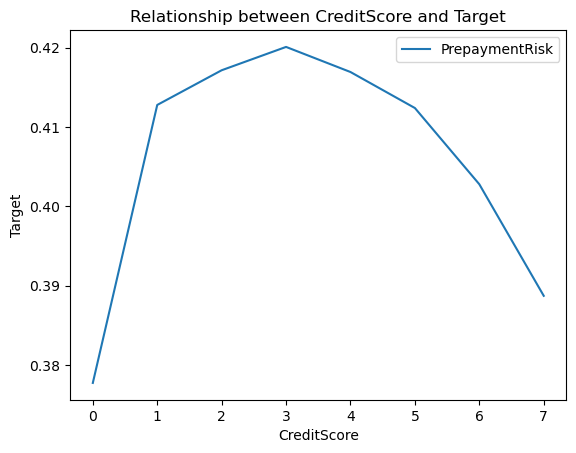

<Figure size 800x800 with 0 Axes>

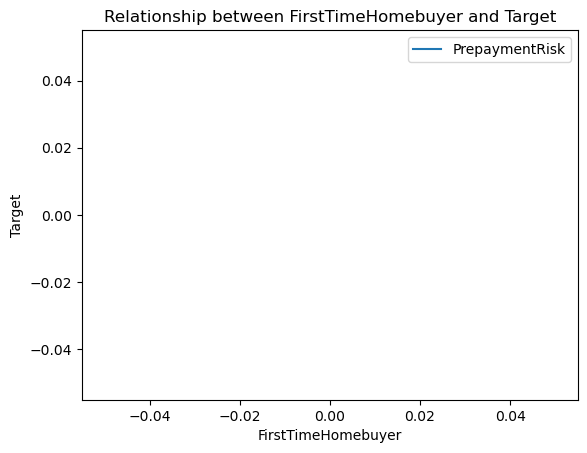

<Figure size 800x800 with 0 Axes>

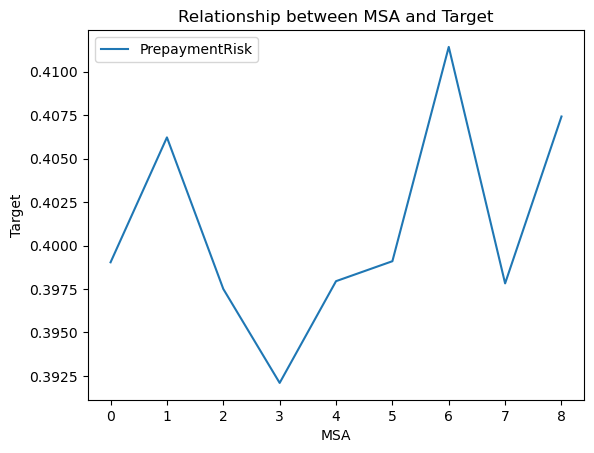

<Figure size 800x800 with 0 Axes>

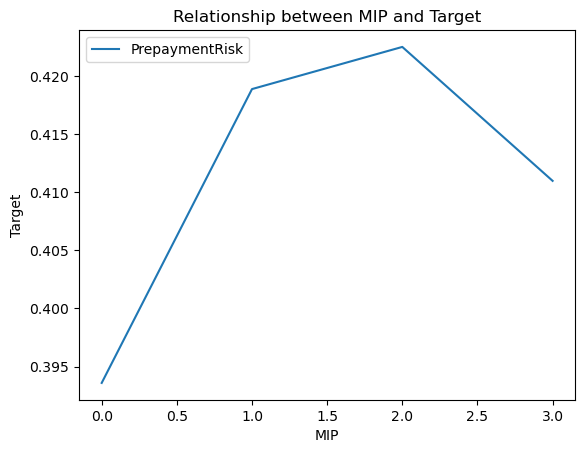

<Figure size 800x800 with 0 Axes>

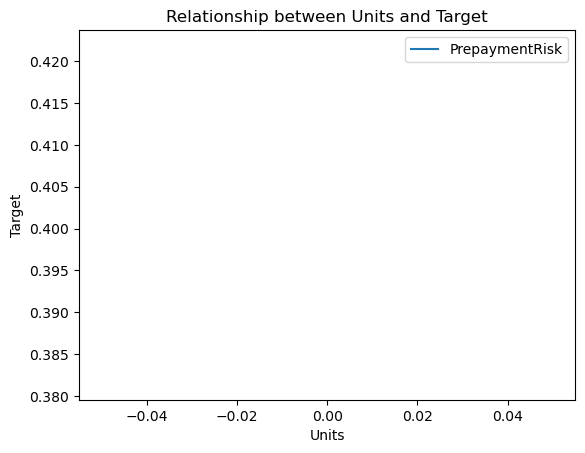

<Figure size 800x800 with 0 Axes>

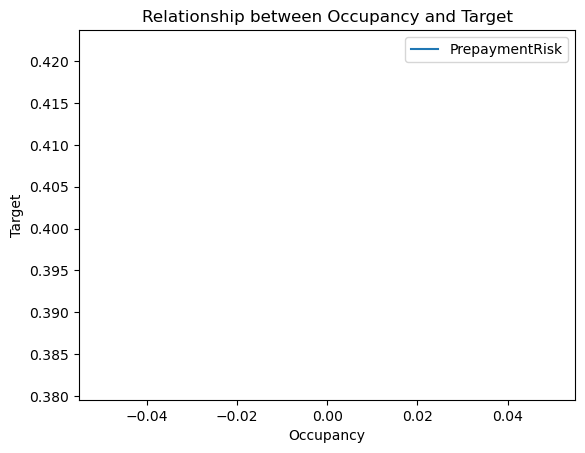

<Figure size 800x800 with 0 Axes>

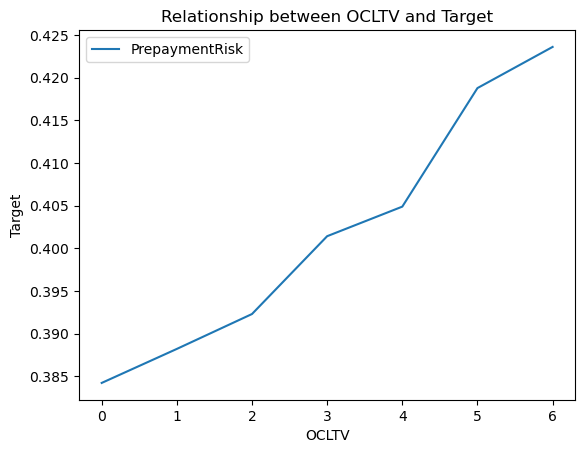

<Figure size 800x800 with 0 Axes>

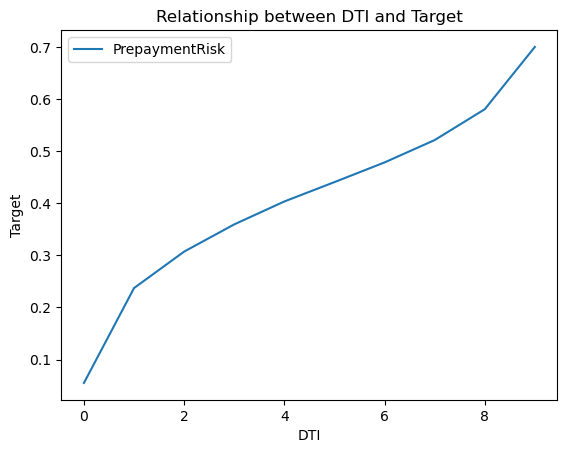

<Figure size 800x800 with 0 Axes>

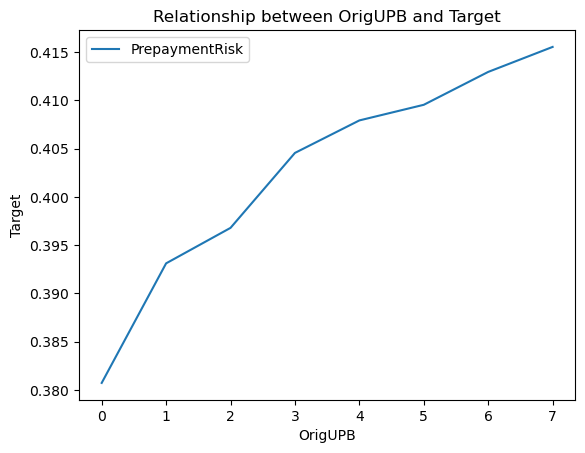

<Figure size 800x800 with 0 Axes>

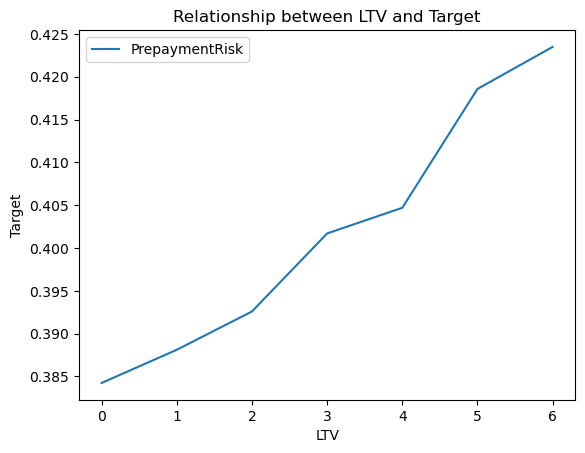

<Figure size 800x800 with 0 Axes>

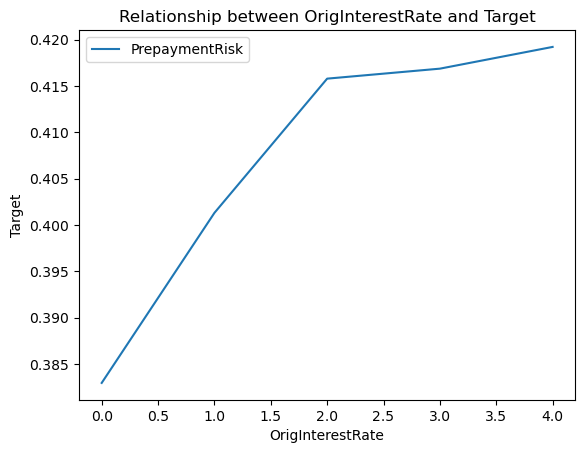

<Figure size 800x800 with 0 Axes>

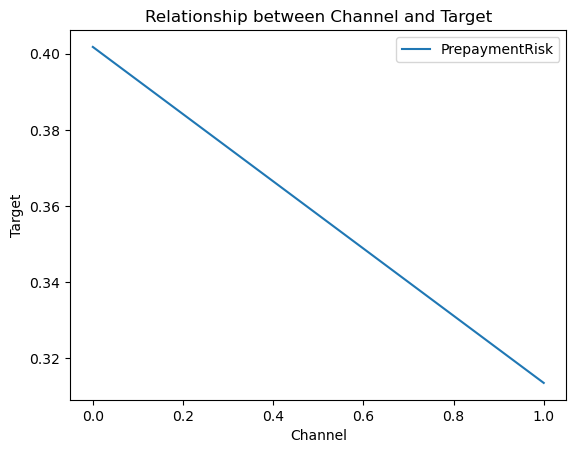

<Figure size 800x800 with 0 Axes>

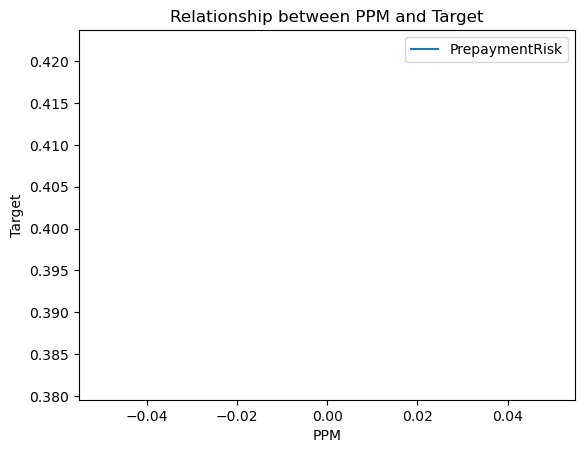

<Figure size 800x800 with 0 Axes>

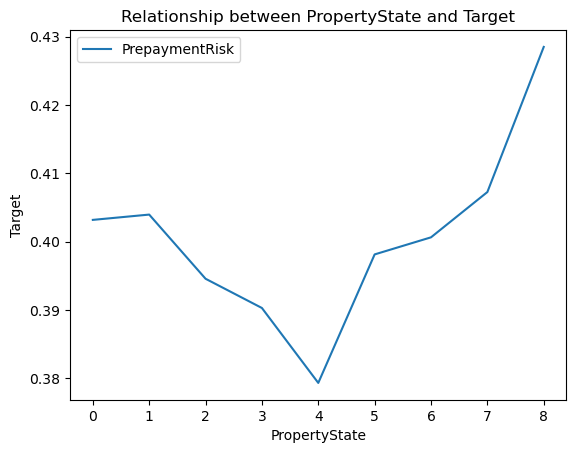

<Figure size 800x800 with 0 Axes>

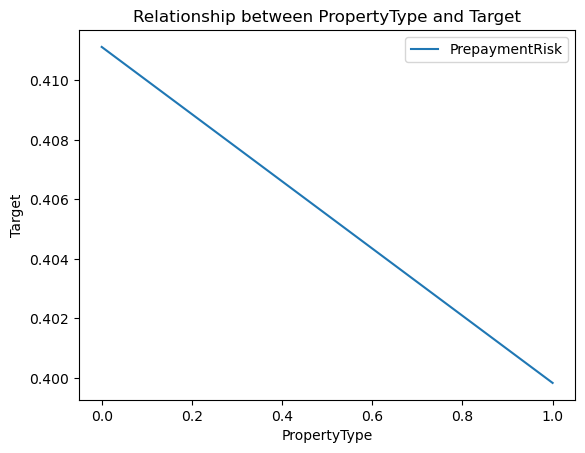

<Figure size 800x800 with 0 Axes>

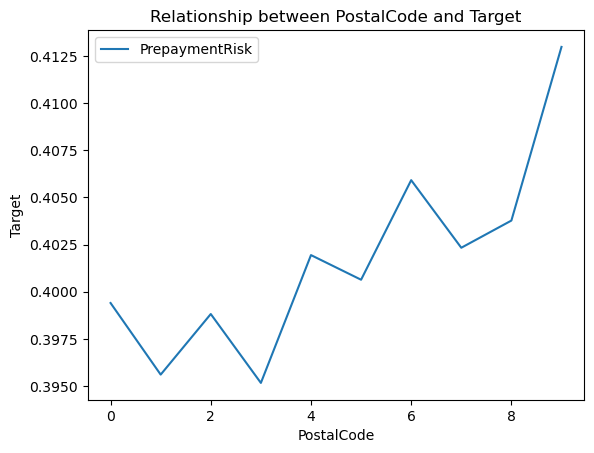

<Figure size 800x800 with 0 Axes>

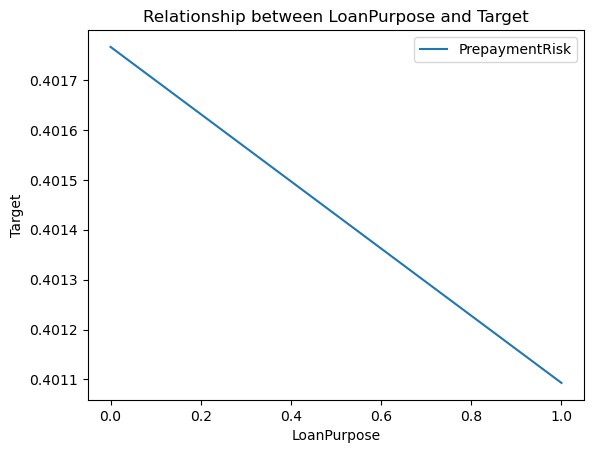

<Figure size 800x800 with 0 Axes>

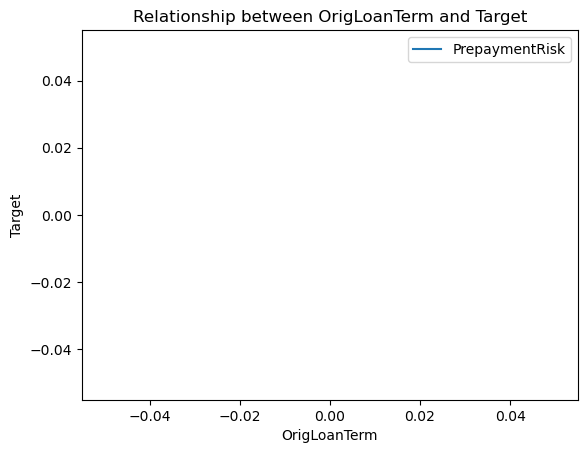

<Figure size 800x800 with 0 Axes>

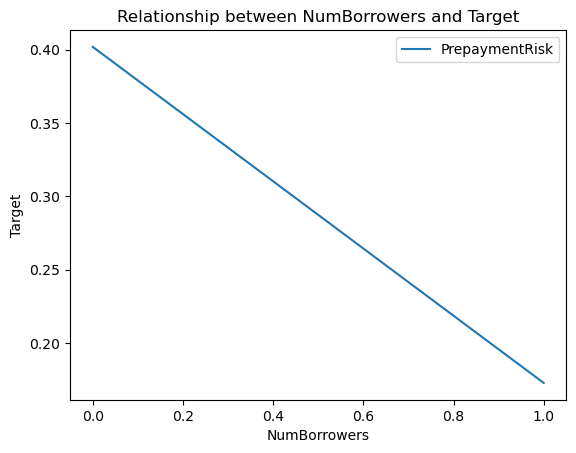

<Figure size 800x800 with 0 Axes>

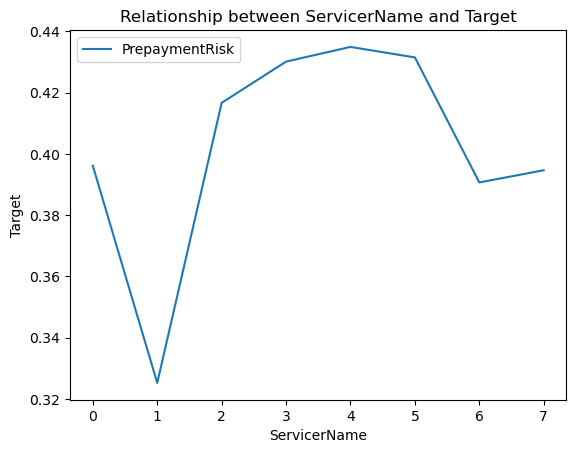

<Figure size 800x800 with 0 Axes>

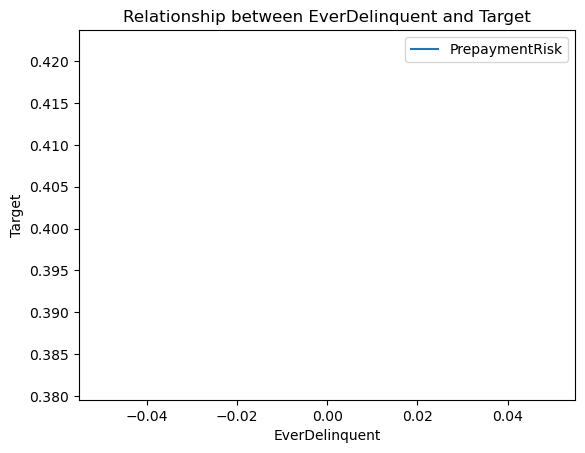

<Figure size 800x800 with 0 Axes>

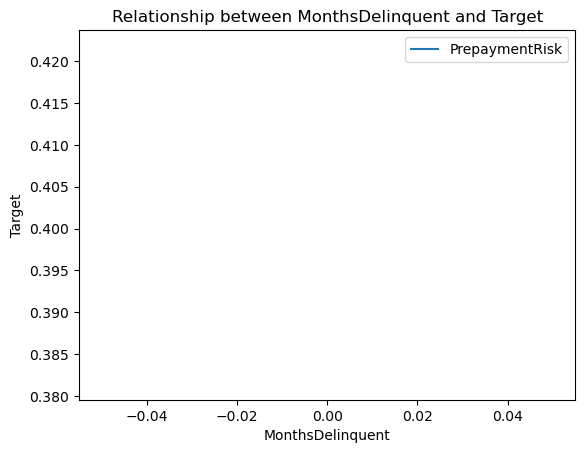

<Figure size 800x800 with 0 Axes>

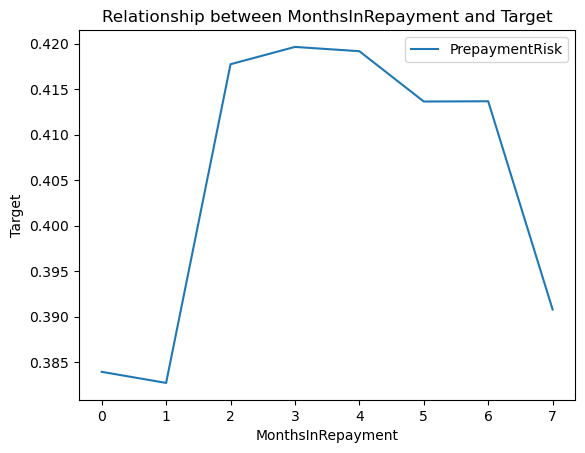

<Figure size 800x800 with 0 Axes>

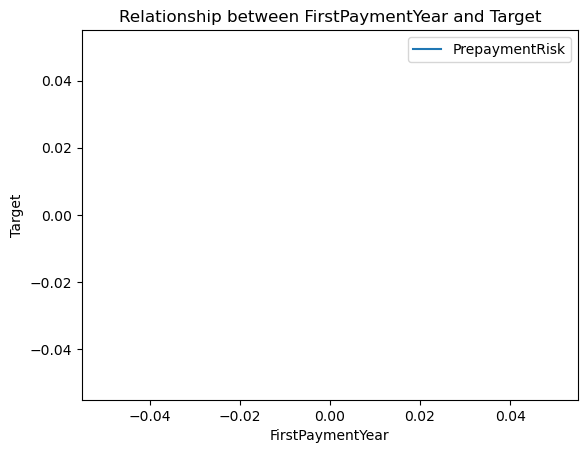

<Figure size 800x800 with 0 Axes>

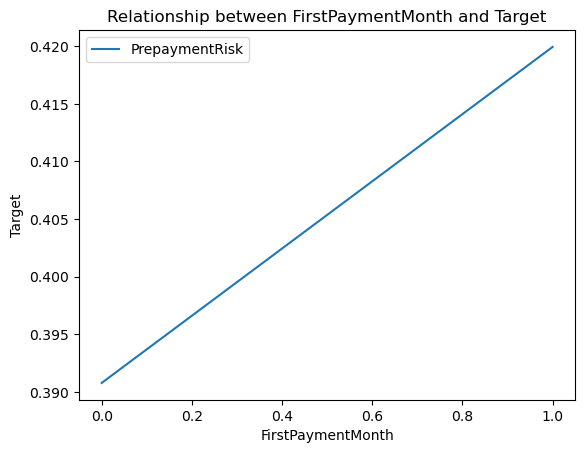

<Figure size 800x800 with 0 Axes>

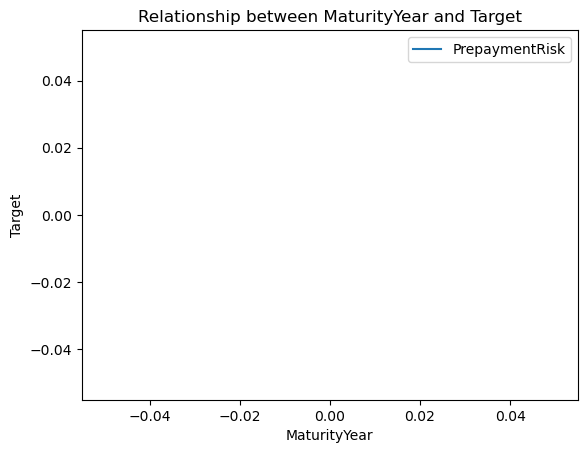

<Figure size 800x800 with 0 Axes>

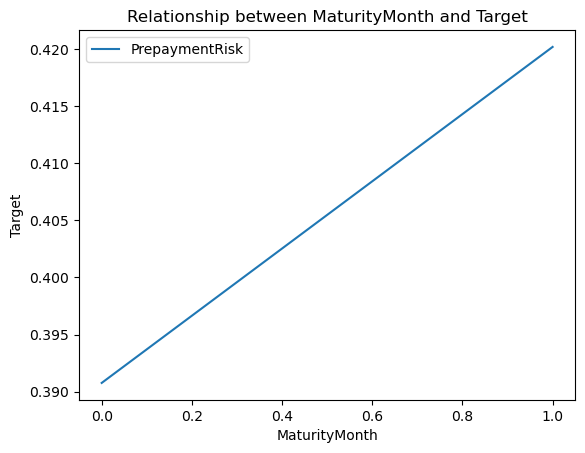

In [246]:
for var in ['CreditScore', 'FirstTimeHomebuyer', 'MSA', 'MIP', 'Units', 'Occupancy',
       'OCLTV', 'DTI', 'OrigUPB', 'LTV', 'OrigInterestRate', 'Channel', 'PPM',
       'PropertyState', 'PropertyType', 'PostalCode', 'LoanPurpose',
       'OrigLoanTerm', 'NumBorrowers', 'ServicerName', 'EverDelinquent',
       'MonthsDelinquent', 'MonthsInRepayment', 'FirstPaymentYear',
       'FirstPaymentMonth', 'MaturityYear', 'MaturityMonth']:
    
    plt.figure(figsize=(8,8))
    fig=y_train.groupby(train_t[var]).mean().plot()
    fig.set_xlabel(var)
    fig.set_ylabel('Target')
    fig.set_title('Relationship between {} and Target'.format(var))

In [247]:
train_t=train_t.drop(['FirstTimeHomebuyer','OrigLoanTerm','MaturityYear','FirstPaymentYear'],axis=1)
test_t=test_t.drop(['FirstTimeHomebuyer','OrigLoanTerm','MaturityYear','FirstPaymentYear'],axis=1)

In [248]:
from sklearn.linear_model import Lasso

In [249]:
lasso=Lasso()
lasso.fit(train_t,y_train)

Lasso()

In [250]:
y_pred=lasso.predict(test_t)

In [251]:
lasso_score=r2_score(y_pred,y_test)
lasso_score

-2.5969137545404485e+30

In [252]:
X=train_t[['OCLTV','DTI','OrigUPB','LTV','OrigInterestRate','Channel','PropertyType','LoanPurpose','NumBorrowers',
          'FirstPaymentMonth','MaturityMonth']]
y=y_train

In [253]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)

In [254]:
lasso=Lasso()
lasso.fit(X_train,y_train)

Lasso()

In [255]:
y_pred=lasso.predict(X_test)

In [256]:
lasso_score=r2_score(y_pred,y_test)
lasso_score

-2.6044770795805683e+30

###  Classification Pipeline

In [257]:
df=pd.read_csv('C:\\Python\\LoanExport.csv')
df.head()

C:\Users\prath\AppData\Local\Temp\ipykernel_8320\1106180122.py:1: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('C:\\Python\\LoanExport.csv')


,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PostalCode,LoanSeqNum,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,0,199902,N,202901,16974,25,1,O,89,27,...,60400,F199Q1268030,P,360,2,FL,WASHINGTONMUTUALBANK,0,0,52
1,0,199902,N,202901,19740,0,1,O,73,17,...,80200,F199Q1015092,N,360,1,FT,CHASEHOMEFINANCELLC,0,0,144
2,0,199902,N,202901,29940,0,1,O,75,16,...,66000,F199Q1266886,N,360,2,FL,WASHINGTONMUTUALBANK,0,0,67
3,0,199902,N,202901,31084,0,1,O,76,14,...,90700,F199Q1178167,N,360,2,GM,GMACMTGECORP,0,0,35
4,0,199902,N,202901,35644,0,1,O,78,18,...,7600,F199Q1178517,N,360,2,GM,GMACMTGECORP,0,0,54


In [258]:
df.drop(['SellerName','ProductType','LoanSeqNum'],axis=1,inplace=True) ## Dropping the irrelevant features

In [259]:
from sklearn.pipeline import Pipeline 
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge,Lasso
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score,classification_report
from sklearn.model_selection import train_test_split

In [260]:
for var in ['MSA','PropertyType','NumBorrowers']: ## Loop containing variables used for handling nan values
    df[var]=df[var].str.strip() ## Removing the white space using str.strip()
    df[var]=df[var].replace('X','Other') ## Replacing nan values with a category "Other"`

In [261]:
df['PPM']=df['PPM'].replace('X','Other')

In [262]:
mode=df['FirstTimeHomebuyer'].mode()
df['FirstTimeHomebuyer']=df['FirstTimeHomebuyer'].fillna(mode)[0]

In [263]:
## Function for removing outliers with 85th percentile and 5th percentile
def remove_outliers(df,variable):
    
    upper_limit=df[variable].quantile(0.85)
    lower_limit=df[variable].quantile(0.15)
    df[variable]=np.where(df[variable]<=upper_limit,upper_limit,
                         np.where(df[variable]>=lower_limit,lower_limit,
                                 df[variable])) ## We want values lower than upper limit and larger than lower limit

In [264]:
variables=['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm',
          'MonthsDelinquent','MonthsInRepayment']

for variable in variables:
    remove_outliers(df,variable) ## Loop to remove outliers for the variables in the list

In [265]:
for var in ['Occupancy','Channel','PPM','LoanPurpose','NumBorrowers','FirstTimeHomebuyer']:
    ordinal_mapping={k:i for i,k in enumerate(df[var].unique(),0)} ## Assigning labels starting from 0
    df[var]=df[var].map(ordinal_mapping) ## Encoding the variables with the labels assigned through the loop written above

In [266]:
for var in ['PostalCode','ServicerName','MSA']:
    frequency_map=(df[var].value_counts()/len(df)).to_dict() ## Calculating the frequency of the variables and convert them into
    ## a dictionary
    df[var]=df[var].map(frequency_map) ## Encoding with the frequency of the variables through loop

In [267]:
for variable in ['PropertyState','PropertyType']:
    count_map=df[variable].value_counts().to_dict() ## Calculating the number of observations present in each feature
    df[variable]=df[variable].map(count_map) ## Encoding the variables with the count of their observations

In [268]:
for var in ['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigLoanTerm','MonthsInRepayment']:
    df[var]=df[var].round(1).astype(int) ## rounding off the values to 1 decimal point to simplify the process

In [269]:
df['FirstPaymentDate']=df['FirstPaymentDate'].astype(str) ## converting the feature into string
df['FirstPaymentDate']=pd.to_datetime(df['FirstPaymentDate'],format="%Y%m") ## converting to appropriate date-time format 
## using year and month

df['MaturityDate']=df['MaturityDate'].astype(str)
df['MaturityDate']=pd.to_datetime(df['MaturityDate'],format='%Y%m')

In [270]:
df['FirstPaymentYear']=df['FirstPaymentDate'].dt.year ## extracting year from firstpaymentdate
df['FirstPaymentMonth']=df['FirstPaymentDate'].dt.month ## extracting month from firstpaymentdate
df['MaturityYear']=df['MaturityDate'].dt.year ## extracting year from maturitydate
df['MaturityMonth']=df['MaturityDate'].dt.month ## extracting month from maturitydate

df.drop(['FirstPaymentDate','MaturityDate'],axis=1,inplace=True)

In [271]:
X=df.drop('EverDelinquent',axis=1)
y=df['EverDelinquent']
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)

In [272]:
## XGBoost
pipeline=Pipeline([
    ('scaler',StandardScaler()),
    ('pca',PCA(n_components=15)),
    ('model',XGBClassifier())
])

In [273]:
from sklearn import set_config

In [274]:
set_config(display='diagram')

In [275]:
pipeline

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=15)),
                ('model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=None, ...))])

In [276]:
pipeline.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=15)),
                ('model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=None, ...))])

In [277]:
pred=pipeline.predict(X_test)

In [278]:
print('Classification Pipeline Metrics:')
print('Accuracy Score:',accuracy_score(y_test,pred))
print('Classification Report:',classification_report(y_test,pred))

Classification Pipeline Metrics:
Accuracy Score: 0.9181863409445712
Classification Report:               precision    recall  f1-score   support

           0       0.91      1.00      0.95     46771
           1       0.99      0.59      0.74     11520

    accuracy                           0.92     58291
   macro avg       0.95      0.80      0.85     58291
weighted avg       0.92      0.92      0.91     58291



In [279]:
## GradientBoost
pipeline=Pipeline([
    ('scaler',StandardScaler()),
    ('pca',PCA(n_components=15)),
    ('model',GradientBoostingClassifier())
])

In [280]:
pipeline.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=15)),
                ('model', GradientBoostingClassifier())])

In [281]:
pred=pipeline.predict(X_test)

In [282]:
print('Classification Pipeline Metrics:')
print('Accuracy Score:',accuracy_score(y_test,pred))
print('Classification Report:',classification_report(y_test,pred))

Classification Pipeline Metrics:
Accuracy Score: 0.9164879655521435
Classification Report:               precision    recall  f1-score   support

           0       0.91      1.00      0.95     46771
           1       0.99      0.58      0.73     11520

    accuracy                           0.92     58291
   macro avg       0.95      0.79      0.84     58291
weighted avg       0.92      0.92      0.91     58291



### Conclusion: XGboost is giving us better accuracy

### Regression Pipeline

In [283]:
data=pd.read_csv('C:\\Python\\LoanExport.csv')
data.head()

C:\Users\prath\AppData\Local\Temp\ipykernel_8320\825696754.py:1: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  data=pd.read_csv('C:\\Python\\LoanExport.csv')


,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PostalCode,LoanSeqNum,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,0,199902,N,202901,16974,25,1,O,89,27,...,60400,F199Q1268030,P,360,2,FL,WASHINGTONMUTUALBANK,0,0,52
1,0,199902,N,202901,19740,0,1,O,73,17,...,80200,F199Q1015092,N,360,1,FT,CHASEHOMEFINANCELLC,0,0,144
2,0,199902,N,202901,29940,0,1,O,75,16,...,66000,F199Q1266886,N,360,2,FL,WASHINGTONMUTUALBANK,0,0,67
3,0,199902,N,202901,31084,0,1,O,76,14,...,90700,F199Q1178167,N,360,2,GM,GMACMTGECORP,0,0,35
4,0,199902,N,202901,35644,0,1,O,78,18,...,7600,F199Q1178517,N,360,2,GM,GMACMTGECORP,0,0,54


In [284]:
from sklearn.preprocessing import MinMaxScaler

data['PrepaymentRisk'] = data['CreditScore'] * data['DTI']

# Scale the prepayment risk values between 0 and 1
scaler = MinMaxScaler()
data['PrepaymentRisk'] = scaler.fit_transform(data[['PrepaymentRisk']])

In [285]:
for var in ['MSA','PropertyType','NumBorrowers']: ## Loop containing variables used for handling nan values
    data[var]=data[var].str.strip() ## Removing the white space using str.strip()
    data[var]=data[var].replace('X','Other') ## Replacing nan values with a category "Other"

In [286]:
for var in ['FirstTimeHomebuyer','SellerName']:
    mode=data[var].mode()
    data[var]=data[var].fillna(mode)[0]

In [287]:
data['PPM']=data['PPM'].replace('X','Other') ## Replacing nan values with "Other"

In [288]:
## Function for capping outliers with 85th percentile and 15th percentile
def cap_outliers(data,variable):
    
    upper_limit=data[variable].quantile(0.85)
    lower_limit=data[variable].quantile(0.15)
    data[variable]=np.where(data[variable]>=upper_limit,upper_limit,
                         np.where(data[variable]<=lower_limit,lower_limit,
                                 data[variable])) ## We want values larger than upper limit and lower than lower limit

In [289]:
variables=['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm',
          'MonthsDelinquent','MonthsInRepayment']

for variable in variables:
    cap_outliers(data,variable) ## Loop to cap outliers for the variables in the list

In [290]:
for var in ['Occupancy','Channel','PPM','LoanPurpose','NumBorrowers','FirstTimeHomebuyer']:
    ordinal_mapping={k:i for i,k in enumerate(data[var].unique(),0)} ## Assigning labels starting from 0
    data[var]=data[var].map(ordinal_mapping) ## Encoding the variables with the labels assigned through the loop written above

In [291]:
for var in ['PostalCode','ServicerName','MSA']:
    frequency_map=(data[var].value_counts()/len(data)).to_dict() ## Calculating the frequency of the variables and convert them into
    ## a dictionary
    data[var]=data[var].map(frequency_map) ## Encoding with the frequency of the variables through loop

In [292]:
for variable in ['PropertyState','PropertyType']:
    count_map=data[variable].value_counts().to_dict() ## Calculating the number of observations present in each feature
    data[variable]=data[variable].map(count_map) ## Encoding the variables with the count of their observations

In [293]:
data.drop(['SellerName','ProductType','LoanSeqNum'],axis=1,inplace=True) ## Dropping the irrelevant features

In [294]:
for var in ['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigLoanTerm','MonthsInRepayment']:
    data[var]=data[var].round(1).astype(int) ## rounding off the values to 1 decimal point to simplify the process

In [295]:
data['FirstPaymentDate']=data['FirstPaymentDate'].astype(str) ## converting the feature into string
data['FirstPaymentDate']=pd.to_datetime(data['FirstPaymentDate'],format="%Y%m") ## converting to appropriate date-time format 
## using year and month

data['MaturityDate']=data['MaturityDate'].astype(str)
data['MaturityDate']=pd.to_datetime(data['MaturityDate'],format='%Y%m')

In [296]:
data['FirstPaymentYear']=data['FirstPaymentDate'].dt.year ## extracting year from firstpaymentdate
data['FirstPaymentMonth']=data['FirstPaymentDate'].dt.month ## extracting month from firstpaymentdate
data['MaturityYear']=data['MaturityDate'].dt.year ## extracting year from maturitydate
data['MaturityMonth']=data['MaturityDate'].dt.month ## extracting month from maturitydate

In [297]:
data.drop(['FirstPaymentDate','MaturityDate'],axis=1,inplace=True)

In [298]:
X=data.drop('PrepaymentRisk',axis=1)
y=data['PrepaymentRisk']
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)

In [299]:
## Linear Regression
pipeline=Pipeline([
    ('scaler1',StandardScaler()),
    ('pca1',PCA(n_components=15)),
    ('model',LinearRegression())
])

In [300]:
pipeline.fit(X_train,y_train)

Pipeline(steps=[('scaler1', StandardScaler()), ('pca1', PCA(n_components=15)),
                ('model', LinearRegression())])

In [301]:
pred=pipeline.predict(X_test)

In [302]:
print('Regression Pipeline Metrics:')
print('Accuracy Score:',r2_score(y_test,pred))
print('Mean Squared Error:',mean_squared_error(y_test,pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred))

Regression Pipeline Metrics:
Accuracy Score: 0.8700437221502513
Mean Squared Error: 0.0041472062124289
Mean Absolute Error: 0.04752796900884039


In [303]:
## Ridge Regression
pipeline=Pipeline([
    ('scaler2',StandardScaler()),
    ('pca2',PCA(n_components=15)),
    ('model',Ridge())
])

In [304]:
pipeline.fit(X_train,y_train)

Pipeline(steps=[('scaler2', StandardScaler()), ('pca2', PCA(n_components=15)),
                ('model', Ridge())])

In [305]:
pred=pipeline.predict(X_test)

In [306]:
print('Regression Pipeline Metrics:')
print('Accuracy Score:',r2_score(y_test,pred))
print('Mean Squared Error:',mean_squared_error(y_test,pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred))

Regression Pipeline Metrics:
Accuracy Score: 0.8700437473568321
Mean Squared Error: 0.004147205408028449
Mean Absolute Error: 0.047527958915955966


In [307]:
## Lasso Regression
pipeline=Pipeline([
    ('scaler3',StandardScaler()),
    ('pca3',PCA(n_components=15)),
    ('model',Lasso())
])

In [308]:
pipeline.fit(X_train,y_train)

Pipeline(steps=[('scaler3', StandardScaler()), ('pca3', PCA(n_components=15)),
                ('model', Lasso())])

In [309]:
pred=pipeline.predict(X_test)

In [310]:
print('Regression Pipeline Metrics:')
print('Accuracy Score:',r2_score(y_test,pred))
print('Mean Squared Error:',mean_squared_error(y_test,pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred))

Regression Pipeline Metrics:
Accuracy Score: -3.451353400629742e-06
Mean Squared Error: 0.0319124292763913
Mean Absolute Error: 0.13782352453968993


###  Conclusion: Linear Regression and Ridge Regression are giving us the best results while lasso regression is not suitable for this prediction

### Regression results with classification features

In [329]:
X=data[['MonthsDelinquent','CreditScore','MaturityMonth','FirstPaymentMonth','OrigLoanTerm','OrigInterestRate',
     'OrigUPB','Units','PropertyType','MaturityYear','FirstPaymentYear','DTI','MIP']]
y=data['PrepaymentRisk']

In [330]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)
X_train.shape,X_test.shape

((233160, 13), (58291, 13))

In [331]:
lin=LinearRegression()
lin.fit(X_train,y_train)

LinearRegression()

In [332]:
y_pred=lin.predict(X_test)

In [333]:
print('Results of Linear Regression with classification features:')
print('R2 Score:',r2_score(y_test,y_pred))
print('Mean squared error:',mean_squared_error(y_test,y_pred))
print('Mean absolute error:',mean_absolute_error(y_test,y_pred))

Results of Linear Regression with classification features:
R2 Score: 0.9752053573261706
Mean squared error: 0.0007912545498628911
Mean absolute error: 0.011241988541115184


In [334]:
ridge=Ridge()
ridge.fit(X_train,y_train)

Ridge()

In [335]:
pred=ridge.predict(X_test)

In [336]:
print('Results of Ridge Regression with classification features:')
print('R2 Score:',r2_score(y_test,pred))
print('Mean squared error:',mean_squared_error(y_test,pred))
print('Mean absolute error:',mean_absolute_error(y_test,pred))

Results of Ridge Regression with classification features:
R2 Score: 0.9752053578185457
Mean squared error: 0.0007912545341500621
Mean absolute error: 0.01124198888152306


In [337]:
lasso=Lasso()
lasso.fit(X_train,y_train)

Lasso()

In [338]:
lasso_pred=lasso.predict(X_test)

In [339]:
print('Results of Lasso Regression with classification features:')
print('R2 Score:',r2_score(y_test,lasso_pred))
print('Mean squared error:',mean_squared_error(y_test,lasso_pred))
print('Mean absolute error:',mean_absolute_error(y_test,lasso_pred))

Results of Lasso Regression with classification features:
R2 Score: 0.768759977893021
Mean squared error: 0.00737940538242427
Mean absolute error: 0.06448852762461323
